<h1> Install dependencies and Imports

In [2]:
!pip install pytorch_metric_learning

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.8/110.8 kB 3.5 MB/s eta 0:00:00


In [ ]:
!pip install neat-python

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torch.utils.data.sampler import SubsetRandomSampler
import torchvision.transforms as transforms
import subprocess
from torch.utils.data import TensorDataset, DataLoader
from pytorch_metric_learning import losses

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


<h1> Primary Model - VAE and Training

In [19]:
classes = np.load('/content/drive/MyDrive/APS360/Project/Data/Classes.npy')

In [5]:
# Define the architecture of the VAE
class VAE_Conv_V2(nn.Module):
    def __init__(self):
        super(VAE_Conv_V2, self).__init__()

        # Encoder
        self.conv1 = nn.Conv2d(1, 8, 2,stride = 2) #14
        self.conv2 = nn.Conv2d(8, 16, 2, stride = 2) #7 
        self.conv3 = nn.Conv2d(16, 32, 3, stride = 2) #3
        self.conv31 = nn.Conv2d(32, 100, 3, stride = 1) #1 mean
        self.conv32 = nn.Conv2d(32, 100, 3, stride = 1) #1 var

        # Decoder
        self.fc3 = nn.Linear(100, 400)
        self.fc4 = nn.Linear(400, 784)

        #Classifier
        self.fc5 = nn.Linear(100, 256)
        self.fc6 = nn.Linear(256,256)
        self.fc7 = nn.Linear(256,80)

    def encode(self, x):
        h1 = F.relu(self.conv1(x))
        h2 = F.relu(self.conv2(h1))
        h3 = F.relu(self.conv3(h2))
        return self.conv31(h3), self.conv32(h3)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return eps.mul(std).add_(mu)

    def decode(self, z):
        h4 = F.relu(self.fc3(z.view(-1, 100)))
        return torch.sigmoid(self.fc4(h4))

    def classify(self, z):
        h5 = F.relu(self.fc5(z.view(-1, 100)))
        h6 = F.relu(self.fc6(h5))
        h7 = F.relu(self.fc7(h6))
        return F.softmax(h7)


    def forward(self, x):
        mu, var = self.encode(x)
        z = self.reparameterize(mu, var)
        return self.decode(z), self.classify(z), mu, var

In [6]:
def loss_function(recon_x, x, pred, label, device, criterion, one_hot, mu, logvar):
    BCE = F.binary_cross_entropy(recon_x, x.view(-1, 784), reduction='sum')/20000
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())/20000
    contrast = criterion(pred,label)*2.56
    label = one_hot.index_select(dim=0, index=label)
    CE = F.cross_entropy(pred, label.to(device))*2.56
    total = BCE+CE+KLD+contrast  
    return total, contrast,CE, BCE, KLD

In [7]:
def Visualize(model, loader, device):
  with torch.no_grad(): #only evaluating - interested only in output
        for images, labels in loader:
            #images = images[:10]
            
            images = images.to(device).float()
            x_recon, _,_,_ = model(images.to(device).float())
            plt.figure()
            f, axarr = plt.subplots(2,10,figsize=(20,4))
            for i in range(10):
              axarr[0][i].imshow(images[i].cpu().squeeze(), cmap = 'gray')
            for i in range(10):
              axarr[1][i].imshow(x_recon[i].reshape([28,28]).cpu().squeeze(), cmap = 'gray')
            plt.show()
            break
            #only update correct number of labels if predicted matches ground truth
    #print('Accuracy on {} dataset: {} %'.format(dataset, (100 * correct / total)))#show accuracy
  return

In [8]:
def model_accuracy(model, loader, dataset, device):
    correct = 0 #correctly predicted labels
    total = 0 #total number of labels
    with torch.no_grad(): #only evaluating - interested only in output
        for images, labels in loader:
            _, outputs, _,_ = model(images.to(device).float())
            _, predicted = torch.max(outputs.data, 1) #get predicted class label for each image
            labels = labels.to(device)
            total += labels.size(0) #update total number of labels
            correct += (predicted == labels).sum().item() 
            #only update correct number of labels if predicted matches ground truth
    print('Accuracy on {} dataset: {} %'.format(dataset, (100 * correct / total)))#show accuracy
    return 100 * correct / total

In [9]:
from torch.autograd.variable import Variable
def train_class(model, batch_size, learning_rate, num_epochs, saveName):
    one_hot = torch.eye(80)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    criterion = losses.ContrastiveLoss()
    train_losses = []
    val_losses = []
    train_losses_recon = []
    val_losses_recon = []
    train_losses_l1 = []
    val_losses_l1 = []
    train_losses_kld = []
    val_losses_kld = []
    train_losses_bce = []
    val_losses_bce = []
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)


    for epoch in range(num_epochs):
      for dl in range(10):
        train_loader = torch.load('/content/drive/MyDrive/APS360/Project'\
                                  +'/Data/TrainLoader_'+str(dl))
        val_loader = torch.load('/content/drive/MyDrive/APS360/Project'\
                                +'/Data/ValLoader_'+str(dl))
        train_loss = 0.0
        train_loss_recon = 0.0
        train_loss_l1 = 0.0
        train_loss_kld = 0.0
        train_loss_bce = 0.0
        val_loss = 0.0
        val_loss_recon = 0.0
        val_loss_l1 = 0.0
        val_loss_bce = 0.0
        val_loss_kld = 0.0

        model.train()
        for i, (images, labels) in enumerate(train_loader):
          x = images.to(device).float()
          #labels = labels.to(device)
          x_recon, pred, mu, var = model(x)
          optimizer.zero_grad()
          loss, recon, l1, bce, kld = loss_function(x_recon, x, pred, labels, device, criterion, one_hot, mu, var)
          loss.backward()
          optimizer.step()

          train_loss += loss.item()
          train_loss_recon += recon.item()
          train_loss_l1 += l1.item()
          train_loss_bce += bce.item()
          train_loss_kld += kld.item()

        model.eval()
        with torch.no_grad():
          for images, labels in val_loader:
              x = images.to(device).float()
              #labels = labels.to(device)
              x_recon, pred, mu, var= model(x)
              optimizer.zero_grad()
              loss, recon, l1, bce, kld = loss_function(x_recon, x, pred, labels, device, criterion,one_hot, mu, var)

              val_loss += loss.item()
              val_loss_recon += recon.item()
              val_loss_l1 += l1.item()
              val_loss_l1 += l1.item()
              val_loss_bce += bce.item()
              val_loss_kld += kld.item()

          train_loss = train_loss / len(train_loader.dataset)
          val_loss = val_loss / len(val_loader.dataset)
          train_loss_recon = train_loss_recon / len(train_loader.dataset)
          val_loss_recon = val_loss_recon / len(val_loader.dataset)
          train_loss_l1 = train_loss_l1 / len(train_loader.dataset)
          val_loss_l1 = val_loss_l1 / len(val_loader.dataset)
          train_loss_bce = train_loss_bce / len(train_loader.dataset)
          train_loss_kld = train_loss_kld / len(train_loader.dataset)
          val_loss_bce = val_loss_bce / len(val_loader.dataset)
          val_loss_kld = val_loss_kld / len(val_loader.dataset)
          


          train_losses.append(train_loss)
          val_losses.append(val_loss)
          val_losses_recon.append(val_loss_recon)
          train_losses_recon.append(train_loss_recon)
          val_losses_l1.append(val_loss_l1)
          train_losses_l1.append(train_loss_l1)
          val_losses_bce.append(val_loss_bce)
          val_losses_kld.append(val_loss_kld)
          train_losses_bce.append(train_loss_bce)
          train_losses_kld.append(train_loss_kld)
          
          if dl %5 == 4:
            train_accuracy = model_accuracy(model, train_loader, 'Train', device)
            val_accuracy = model_accuracy(model, val_loader, 'Val', device)
            print(f'Train Performance:')
            Visualize(model,train_loader, device)
            print(f'Val Performance:')
            Visualize(model,val_loader, device)
          print('Epoch [{}/{}], Train Loader [{}/{}], Training Loss: {:.10f}, Validation Loss: {:.10f}'.format(epoch+1, num_epochs, dl+1, 10, train_loss, val_loss))
          print('\t\tTraining Loss Recon: {:.5f},   Validation Loss Recon: {:.5f}'.format(train_loss_recon, val_loss_recon))
          print('\t\tTraining Loss L1: {:.5f},   Validation Loss L1: {:.5f}'.format(train_loss_l1, val_loss_l1))

        torch.save(model.state_dict(), '/content/drive/MyDrive/APS360/Project/Models/'+saveName+'_'+str(epoch))

    torch.save(model.state_dict(), '/content/drive/MyDrive/APS360/Project/Models/'+saveName)
    return train_losses, val_losses, train_losses_l1, val_losses_l1, train_losses_recon, val_losses_recon, train_losses_bce, val_losses_bce, train_losses_kld, val_losses_kld

In [10]:
vae_wild = VAE_Conv_V2()


<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Epoch [1/20], Train Loader [1/10], Training Loss: 0.0694214865, Validation Loss: 0.0694372627
		Training Loss Recon: 0.01055,   Validation Loss Recon: 0.01198
		Training Loss L1: 0.04386,   Validation Loss L1: 0.08764
Epoch [1/20], Train Loader [2/10], Training Loss: 0.0687056028, Validation Loss: 0.0686277515
		Training Loss Recon: 0.01200,   Validation Loss Recon: 0.01242
		Training Loss L1: 0.04357,   Validation Loss L1: 0.08678
Epoch [1/20], Train Loader [3/10], Training Loss: 0.0679651627, Validation Loss: 0.0677014798
		Training Loss Recon: 0.01223,   Validation Loss Recon: 0.01224
		Training Loss L1: 0.04313,   Validation Loss L1: 0.08599
Epoch [1/20], Train Loader [4/10], Training Loss: 0.0672018238, Validation Loss: 0.0668888240
		Training Loss Recon: 0.01216,   Validation Loss Recon: 0.01210
		Training Loss L1: 0.04276,   Validation Loss L1: 0.08545
Accuracy on Train dataset: 22.09464285714286 %
Accuracy on Val dataset: 22.108333333333334 %
Train Performance:


<Figure size 640x480 with 0 Axes>

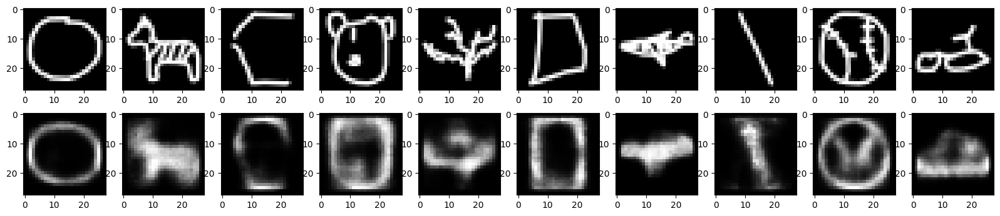

Val Performance:


<Figure size 640x480 with 0 Axes>

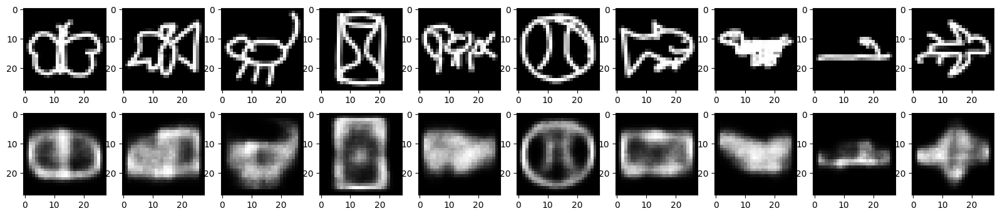

Epoch [1/20], Train Loader [5/10], Training Loss: 0.0666376357, Validation Loss: 0.0663396015
		Training Loss Recon: 0.01217,   Validation Loss Recon: 0.01203
		Training Loss L1: 0.04247,   Validation Loss L1: 0.08491
Epoch [1/20], Train Loader [6/10], Training Loss: 0.0661869750, Validation Loss: 0.0660791497
		Training Loss Recon: 0.01211,   Validation Loss Recon: 0.01207
		Training Loss L1: 0.04228,   Validation Loss L1: 0.08455
Epoch [1/20], Train Loader [7/10], Training Loss: 0.0658709829, Validation Loss: 0.0659028370
		Training Loss Recon: 0.01215,   Validation Loss Recon: 0.01230
		Training Loss L1: 0.04209,   Validation Loss L1: 0.08397
Epoch [1/20], Train Loader [8/10], Training Loss: 0.0655908130, Validation Loss: 0.0656141562
		Training Loss Recon: 0.01218,   Validation Loss Recon: 0.01222
		Training Loss L1: 0.04188,   Validation Loss L1: 0.08377
Epoch [1/20], Train Loader [9/10], Training Loss: 0.0652893708, Validation Loss: 0.0652899019
		Training Loss Recon: 0.01212,   

<Figure size 640x480 with 0 Axes>

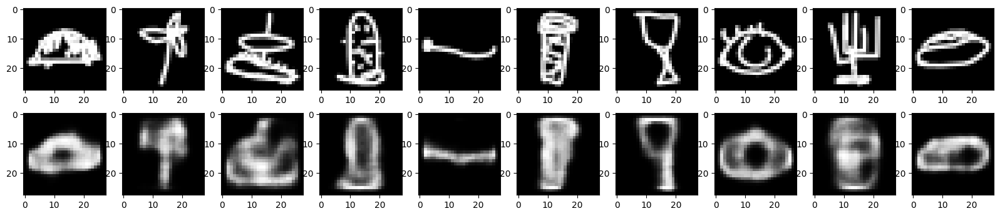

Val Performance:


<Figure size 640x480 with 0 Axes>

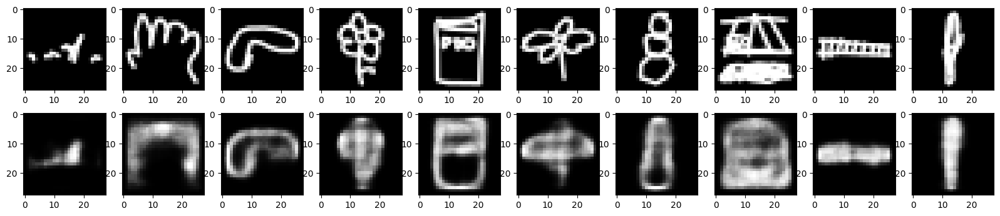

Epoch [1/20], Train Loader [10/10], Training Loss: 0.0649523576, Validation Loss: 0.0650092187
		Training Loss Recon: 0.01204,   Validation Loss Recon: 0.01203
		Training Loss L1: 0.04164,   Validation Loss L1: 0.08343
Epoch [2/20], Train Loader [1/10], Training Loss: 0.0646874240, Validation Loss: 0.0644585656
		Training Loss Recon: 0.01197,   Validation Loss Recon: 0.01176
		Training Loss L1: 0.04151,   Validation Loss L1: 0.08298
Epoch [2/20], Train Loader [2/10], Training Loss: 0.0645051983, Validation Loss: 0.0644873069
		Training Loss Recon: 0.01201,   Validation Loss Recon: 0.01197
		Training Loss L1: 0.04133,   Validation Loss L1: 0.08272
Epoch [2/20], Train Loader [3/10], Training Loss: 0.0643056159, Validation Loss: 0.0640659201
		Training Loss Recon: 0.01200,   Validation Loss Recon: 0.01186
		Training Loss L1: 0.04120,   Validation Loss L1: 0.08230
Epoch [2/20], Train Loader [4/10], Training Loss: 0.0640895147, Validation Loss: 0.0642925955
		Training Loss Recon: 0.01197,  

<Figure size 640x480 with 0 Axes>

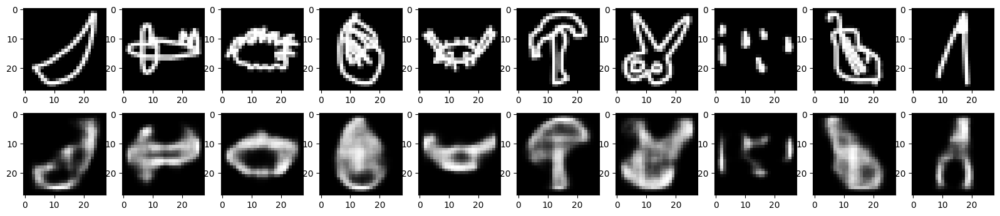

Val Performance:


<Figure size 640x480 with 0 Axes>

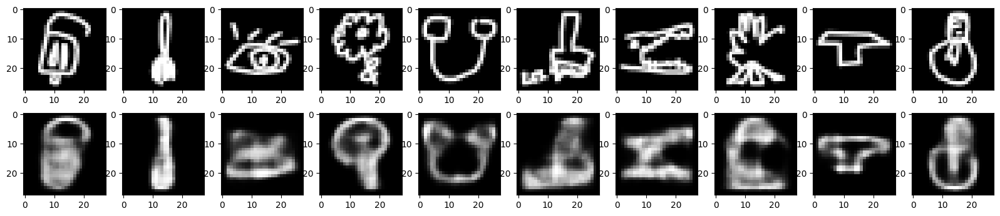

Epoch [2/20], Train Loader [5/10], Training Loss: 0.0638905223, Validation Loss: 0.0639686435
		Training Loss Recon: 0.01191,   Validation Loss Recon: 0.01205
		Training Loss L1: 0.04098,   Validation Loss L1: 0.08184
Epoch [2/20], Train Loader [6/10], Training Loss: 0.0638835329, Validation Loss: 0.0638108529
		Training Loss Recon: 0.01197,   Validation Loss Recon: 0.01189
		Training Loss L1: 0.04092,   Validation Loss L1: 0.08184
Epoch [2/20], Train Loader [7/10], Training Loss: 0.0637291438, Validation Loss: 0.0636392802
		Training Loss Recon: 0.01193,   Validation Loss Recon: 0.01183
		Training Loss L1: 0.04087,   Validation Loss L1: 0.08171
Epoch [2/20], Train Loader [8/10], Training Loss: 0.0635601759, Validation Loss: 0.0636699336
		Training Loss Recon: 0.01189,   Validation Loss Recon: 0.01191
		Training Loss L1: 0.04072,   Validation Loss L1: 0.08157
Epoch [2/20], Train Loader [9/10], Training Loss: 0.0634451969, Validation Loss: 0.0635472021
		Training Loss Recon: 0.01188,   

<Figure size 640x480 with 0 Axes>

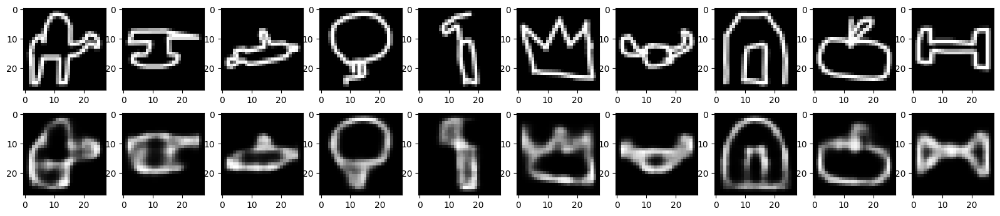

Val Performance:


<Figure size 640x480 with 0 Axes>

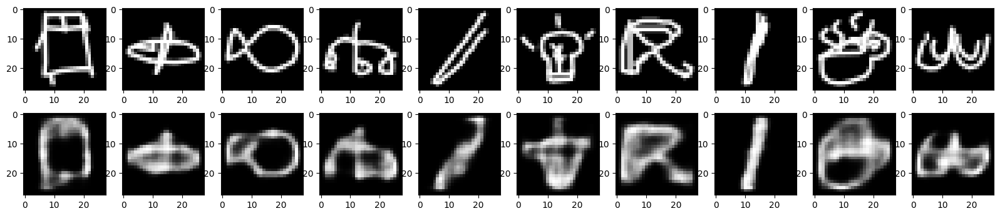

Epoch [2/20], Train Loader [10/10], Training Loss: 0.0632479517, Validation Loss: 0.0633143182
		Training Loss Recon: 0.01184,   Validation Loss Recon: 0.01181
		Training Loss L1: 0.04051,   Validation Loss L1: 0.08104
Epoch [3/20], Train Loader [1/10], Training Loss: 0.0630965448, Validation Loss: 0.0629965390
		Training Loss Recon: 0.01182,   Validation Loss Recon: 0.01174
		Training Loss L1: 0.04039,   Validation Loss L1: 0.08075
Epoch [3/20], Train Loader [2/10], Training Loss: 0.0629366772, Validation Loss: 0.0632157503
		Training Loss Recon: 0.01179,   Validation Loss Recon: 0.01207
		Training Loss L1: 0.04027,   Validation Loss L1: 0.08043
Epoch [3/20], Train Loader [3/10], Training Loss: 0.0629503524, Validation Loss: 0.0628423128
		Training Loss Recon: 0.01180,   Validation Loss Recon: 0.01179
		Training Loss L1: 0.04025,   Validation Loss L1: 0.08029
Epoch [3/20], Train Loader [4/10], Training Loss: 0.0627543820, Validation Loss: 0.0629018018
		Training Loss Recon: 0.01170,  

<Figure size 640x480 with 0 Axes>

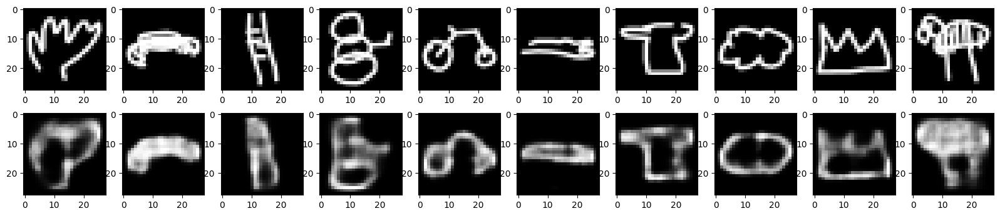

Val Performance:


<Figure size 640x480 with 0 Axes>

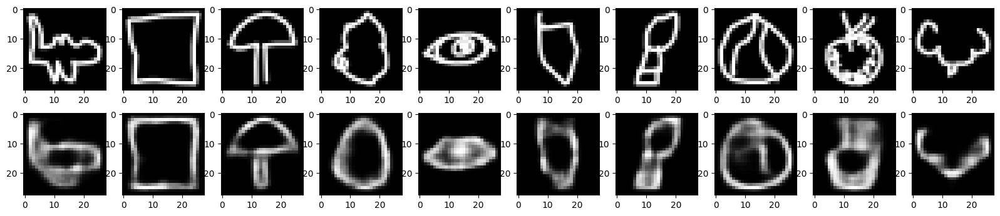

Epoch [3/20], Train Loader [5/10], Training Loss: 0.0627052232, Validation Loss: 0.0626879288
		Training Loss Recon: 0.01170,   Validation Loss Recon: 0.01169
		Training Loss L1: 0.04011,   Validation Loss L1: 0.08028
Epoch [3/20], Train Loader [6/10], Training Loss: 0.0626350188, Validation Loss: 0.0625466924
		Training Loss Recon: 0.01167,   Validation Loss Recon: 0.01149
		Training Loss L1: 0.04008,   Validation Loss L1: 0.08038
Epoch [3/20], Train Loader [7/10], Training Loss: 0.0624942261, Validation Loss: 0.0625578369
		Training Loss Recon: 0.01160,   Validation Loss Recon: 0.01159
		Training Loss L1: 0.04003,   Validation Loss L1: 0.08020
Epoch [3/20], Train Loader [8/10], Training Loss: 0.0624878305, Validation Loss: 0.0624502933
		Training Loss Recon: 0.01159,   Validation Loss Recon: 0.01143
		Training Loss L1: 0.04000,   Validation Loss L1: 0.08022
Epoch [3/20], Train Loader [9/10], Training Loss: 0.0623863619, Validation Loss: 0.0624614594
		Training Loss Recon: 0.01155,   

<Figure size 640x480 with 0 Axes>

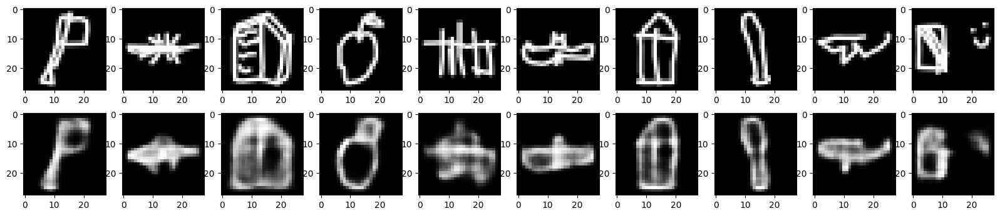

Val Performance:


<Figure size 640x480 with 0 Axes>

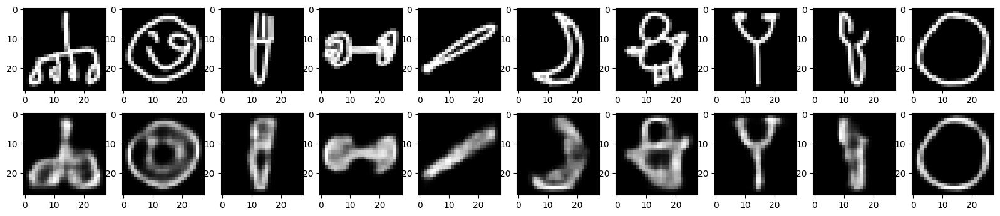

Epoch [3/20], Train Loader [10/10], Training Loss: 0.0622768116, Validation Loss: 0.0624726199
		Training Loss Recon: 0.01149,   Validation Loss Recon: 0.01153
		Training Loss L1: 0.03994,   Validation Loss L1: 0.08006
Epoch [4/20], Train Loader [1/10], Training Loss: 0.0622292041, Validation Loss: 0.0622529124
		Training Loss Recon: 0.01148,   Validation Loss Recon: 0.01140
		Training Loss L1: 0.03990,   Validation Loss L1: 0.07983
Epoch [4/20], Train Loader [2/10], Training Loss: 0.0621807407, Validation Loss: 0.0622303200
		Training Loss Recon: 0.01151,   Validation Loss Recon: 0.01146
		Training Loss L1: 0.03982,   Validation Loss L1: 0.07985
Epoch [4/20], Train Loader [3/10], Training Loss: 0.0621541464, Validation Loss: 0.0623444613
		Training Loss Recon: 0.01151,   Validation Loss Recon: 0.01171
		Training Loss L1: 0.03978,   Validation Loss L1: 0.07944
Epoch [4/20], Train Loader [4/10], Training Loss: 0.0621620656, Validation Loss: 0.0620667419
		Training Loss Recon: 0.01155,  

<Figure size 640x480 with 0 Axes>

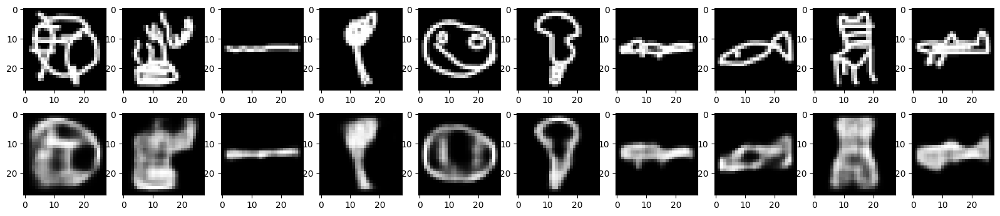

Val Performance:


<Figure size 640x480 with 0 Axes>

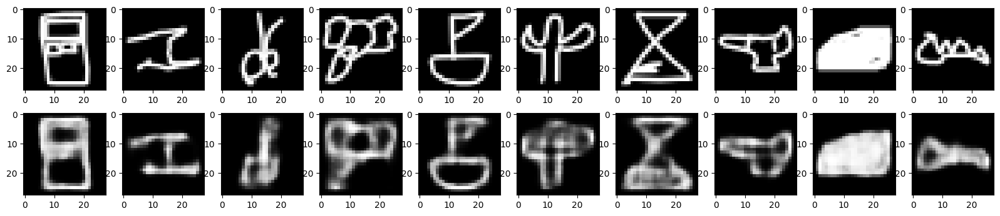

Epoch [4/20], Train Loader [5/10], Training Loss: 0.0620518583, Validation Loss: 0.0622188160
		Training Loss Recon: 0.01150,   Validation Loss Recon: 0.01157
		Training Loss L1: 0.03969,   Validation Loss L1: 0.07958
Epoch [4/20], Train Loader [6/10], Training Loss: 0.0619936021, Validation Loss: 0.0619564569
		Training Loss Recon: 0.01146,   Validation Loss Recon: 0.01132
		Training Loss L1: 0.03968,   Validation Loss L1: 0.07954
Epoch [4/20], Train Loader [7/10], Training Loss: 0.0619381727, Validation Loss: 0.0620713855
		Training Loss Recon: 0.01149,   Validation Loss Recon: 0.01146
		Training Loss L1: 0.03963,   Validation Loss L1: 0.07958
Epoch [4/20], Train Loader [8/10], Training Loss: 0.0618634018, Validation Loss: 0.0621231407
		Training Loss Recon: 0.01137,   Validation Loss Recon: 0.01156
		Training Loss L1: 0.03963,   Validation Loss L1: 0.07931
Epoch [4/20], Train Loader [9/10], Training Loss: 0.0618343373, Validation Loss: 0.0618900294
		Training Loss Recon: 0.01139,   

<Figure size 640x480 with 0 Axes>

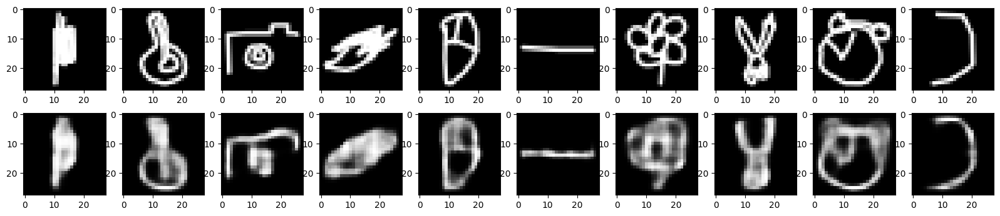

Val Performance:


<Figure size 640x480 with 0 Axes>

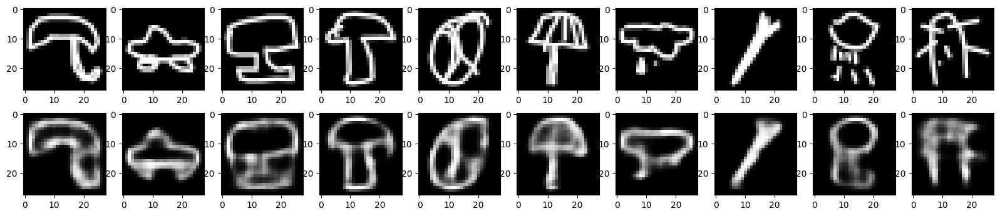

Epoch [4/20], Train Loader [10/10], Training Loss: 0.0617350521, Validation Loss: 0.0620744561
		Training Loss Recon: 0.01135,   Validation Loss Recon: 0.01155
		Training Loss L1: 0.03955,   Validation Loss L1: 0.07930
Epoch [5/20], Train Loader [1/10], Training Loss: 0.0617180179, Validation Loss: 0.0616562418
		Training Loss Recon: 0.01135,   Validation Loss Recon: 0.01118
		Training Loss L1: 0.03953,   Validation Loss L1: 0.07918
Epoch [5/20], Train Loader [2/10], Training Loss: 0.0616646009, Validation Loss: 0.0617638462
		Training Loss Recon: 0.01132,   Validation Loss Recon: 0.01133
		Training Loss L1: 0.03950,   Validation Loss L1: 0.07907
Epoch [5/20], Train Loader [3/10], Training Loss: 0.0616397437, Validation Loss: 0.0615019743
		Training Loss Recon: 0.01132,   Validation Loss Recon: 0.01115
		Training Loss L1: 0.03948,   Validation Loss L1: 0.07902
Epoch [5/20], Train Loader [4/10], Training Loss: 0.0615870062, Validation Loss: 0.0618311089
		Training Loss Recon: 0.01126,  

<Figure size 640x480 with 0 Axes>

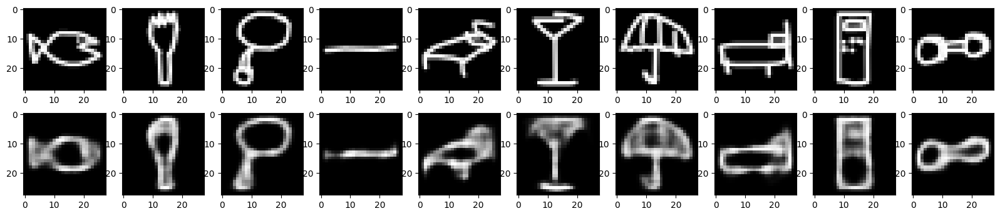

Val Performance:


<Figure size 640x480 with 0 Axes>

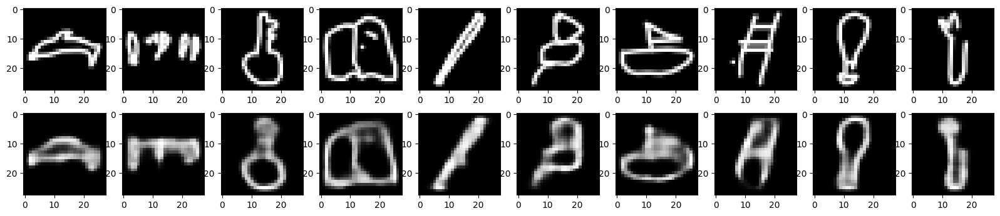

Epoch [5/20], Train Loader [5/10], Training Loss: 0.0614597055, Validation Loss: 0.0616477926
		Training Loss Recon: 0.01120,   Validation Loss Recon: 0.01138
		Training Loss L1: 0.03942,   Validation Loss L1: 0.07892
Epoch [5/20], Train Loader [6/10], Training Loss: 0.0614844545, Validation Loss: 0.0615208479
		Training Loss Recon: 0.01126,   Validation Loss Recon: 0.01125
		Training Loss L1: 0.03939,   Validation Loss L1: 0.07880
Epoch [5/20], Train Loader [7/10], Training Loss: 0.0614755622, Validation Loss: 0.0616001738
		Training Loss Recon: 0.01130,   Validation Loss Recon: 0.01135
		Training Loss L1: 0.03934,   Validation Loss L1: 0.07887
Epoch [5/20], Train Loader [8/10], Training Loss: 0.0613990320, Validation Loss: 0.0615505269
		Training Loss Recon: 0.01121,   Validation Loss Recon: 0.01131
		Training Loss L1: 0.03931,   Validation Loss L1: 0.07861
Epoch [5/20], Train Loader [9/10], Training Loss: 0.0613258811, Validation Loss: 0.0614419338
		Training Loss Recon: 0.01119,   

<Figure size 640x480 with 0 Axes>

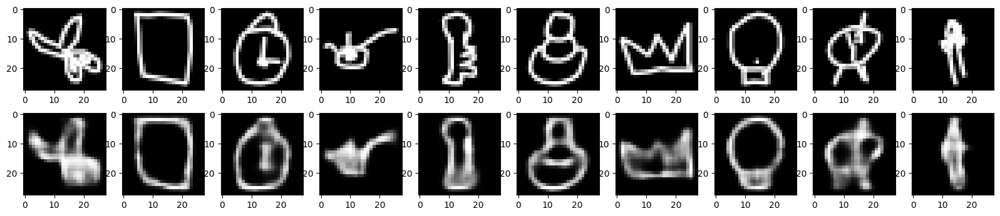

Val Performance:


<Figure size 640x480 with 0 Axes>

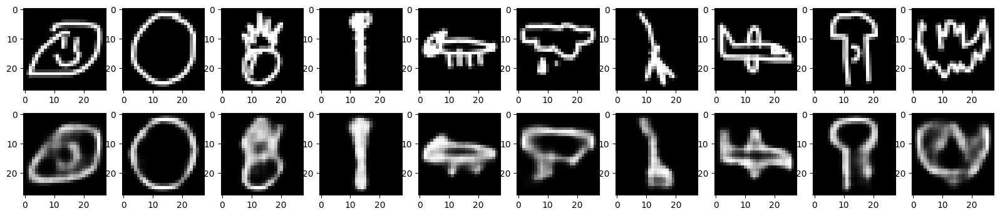

Epoch [5/20], Train Loader [10/10], Training Loss: 0.0612699557, Validation Loss: 0.0615490671
		Training Loss Recon: 0.01119,   Validation Loss Recon: 0.01133
		Training Loss L1: 0.03925,   Validation Loss L1: 0.07865
Epoch [6/20], Train Loader [1/10], Training Loss: 0.0612643560, Validation Loss: 0.0614019045
		Training Loss Recon: 0.01119,   Validation Loss Recon: 0.01129
		Training Loss L1: 0.03923,   Validation Loss L1: 0.07844
Epoch [6/20], Train Loader [2/10], Training Loss: 0.0611845918, Validation Loss: 0.0612943244
		Training Loss Recon: 0.01114,   Validation Loss Recon: 0.01115
		Training Loss L1: 0.03921,   Validation Loss L1: 0.07853
Epoch [6/20], Train Loader [3/10], Training Loss: 0.0612386361, Validation Loss: 0.0614770810
		Training Loss Recon: 0.01116,   Validation Loss Recon: 0.01139
		Training Loss L1: 0.03922,   Validation Loss L1: 0.07842
Epoch [6/20], Train Loader [4/10], Training Loss: 0.0612204876, Validation Loss: 0.0613062037
		Training Loss Recon: 0.01121,  

<Figure size 640x480 with 0 Axes>

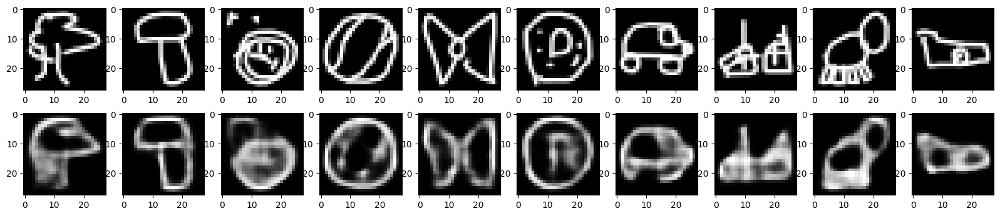

Val Performance:


<Figure size 640x480 with 0 Axes>

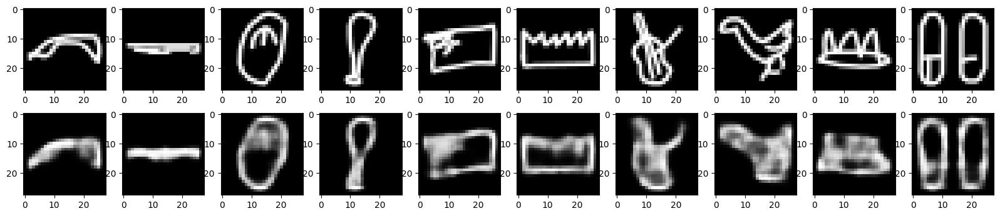

Epoch [6/20], Train Loader [5/10], Training Loss: 0.0611311365, Validation Loss: 0.0612609634
		Training Loss Recon: 0.01112,   Validation Loss Recon: 0.01112
		Training Loss L1: 0.03916,   Validation Loss L1: 0.07843
Epoch [6/20], Train Loader [6/10], Training Loss: 0.0611077975, Validation Loss: 0.0613339314
		Training Loss Recon: 0.01112,   Validation Loss Recon: 0.01125
		Training Loss L1: 0.03914,   Validation Loss L1: 0.07848
Epoch [6/20], Train Loader [7/10], Training Loss: 0.0611468027, Validation Loss: 0.0613461631
		Training Loss Recon: 0.01117,   Validation Loss Recon: 0.01127
		Training Loss L1: 0.03915,   Validation Loss L1: 0.07839
Epoch [6/20], Train Loader [8/10], Training Loss: 0.0610715082, Validation Loss: 0.0614519755
		Training Loss Recon: 0.01111,   Validation Loss Recon: 0.01129
		Training Loss L1: 0.03912,   Validation Loss L1: 0.07843
Epoch [6/20], Train Loader [9/10], Training Loss: 0.0610651301, Validation Loss: 0.0613062146
		Training Loss Recon: 0.01113,   

<Figure size 640x480 with 0 Axes>

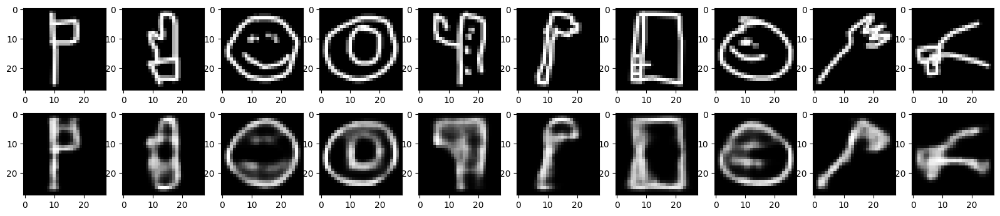

Val Performance:


<Figure size 640x480 with 0 Axes>

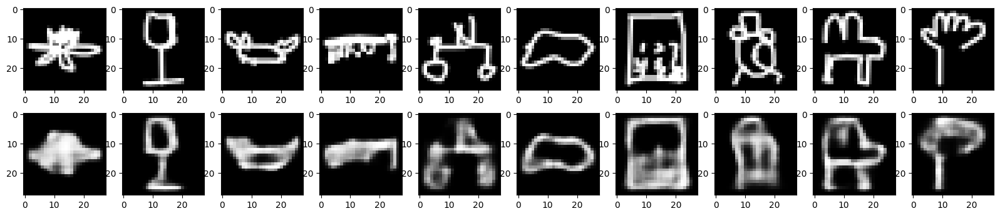

Epoch [6/20], Train Loader [10/10], Training Loss: 0.0609049220, Validation Loss: 0.0614573806
		Training Loss Recon: 0.01110,   Validation Loss Recon: 0.01148
		Training Loss L1: 0.03897,   Validation Loss L1: 0.07806
Epoch [7/20], Train Loader [1/10], Training Loss: 0.0609118778, Validation Loss: 0.0610327915
		Training Loss Recon: 0.01110,   Validation Loss Recon: 0.01116
		Training Loss L1: 0.03897,   Validation Loss L1: 0.07801
Epoch [7/20], Train Loader [2/10], Training Loss: 0.0608883122, Validation Loss: 0.0609937441
		Training Loss Recon: 0.01109,   Validation Loss Recon: 0.01117
		Training Loss L1: 0.03895,   Validation Loss L1: 0.07793
Epoch [7/20], Train Loader [3/10], Training Loss: 0.0608885243, Validation Loss: 0.0609261562
		Training Loss Recon: 0.01108,   Validation Loss Recon: 0.01109
		Training Loss L1: 0.03896,   Validation Loss L1: 0.07804
Epoch [7/20], Train Loader [4/10], Training Loss: 0.0608150921, Validation Loss: 0.0612575274
		Training Loss Recon: 0.01106,  

<Figure size 640x480 with 0 Axes>

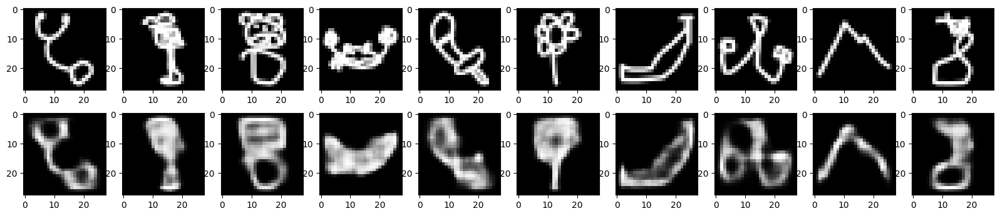

Val Performance:


<Figure size 640x480 with 0 Axes>

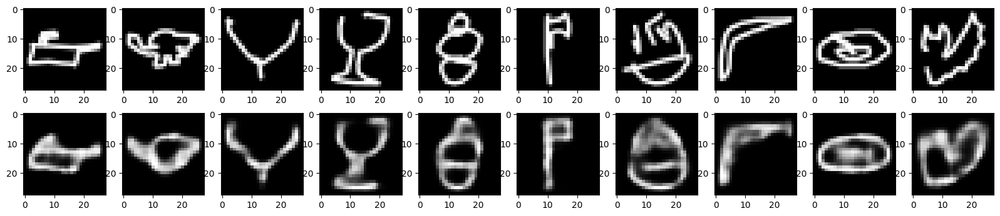

Epoch [7/20], Train Loader [5/10], Training Loss: 0.0608474140, Validation Loss: 0.0610584951
		Training Loss Recon: 0.01108,   Validation Loss Recon: 0.01124
		Training Loss L1: 0.03891,   Validation Loss L1: 0.07796
Epoch [7/20], Train Loader [6/10], Training Loss: 0.0608076716, Validation Loss: 0.0609543732
		Training Loss Recon: 0.01108,   Validation Loss Recon: 0.01104
		Training Loss L1: 0.03889,   Validation Loss L1: 0.07808
Epoch [7/20], Train Loader [7/10], Training Loss: 0.0607316357, Validation Loss: 0.0610301800
		Training Loss Recon: 0.01103,   Validation Loss Recon: 0.01127
		Training Loss L1: 0.03887,   Validation Loss L1: 0.07774
Epoch [7/20], Train Loader [8/10], Training Loss: 0.0606328361, Validation Loss: 0.0610163325
		Training Loss Recon: 0.01101,   Validation Loss Recon: 0.01114
		Training Loss L1: 0.03877,   Validation Loss L1: 0.07795
Epoch [7/20], Train Loader [9/10], Training Loss: 0.0605924727, Validation Loss: 0.0606033843
		Training Loss Recon: 0.01099,   

<Figure size 640x480 with 0 Axes>

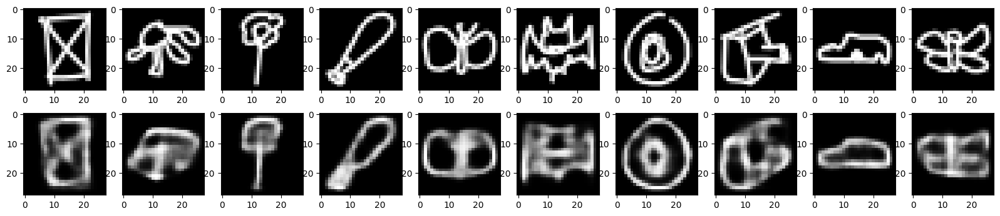

Val Performance:


<Figure size 640x480 with 0 Axes>

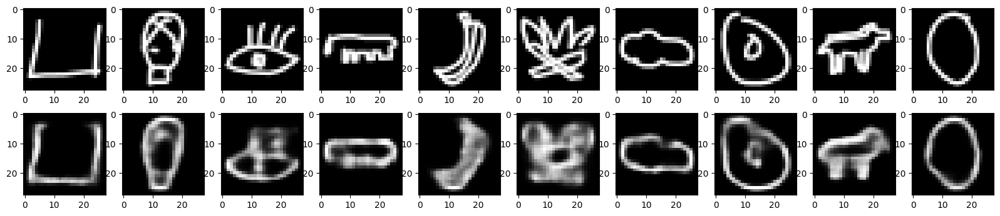

Epoch [7/20], Train Loader [10/10], Training Loss: 0.0606109373, Validation Loss: 0.0610077142
		Training Loss Recon: 0.01105,   Validation Loss Recon: 0.01125
		Training Loss L1: 0.03872,   Validation Loss L1: 0.07761
Epoch [8/20], Train Loader [1/10], Training Loss: 0.0605904624, Validation Loss: 0.0607752945
		Training Loss Recon: 0.01105,   Validation Loss Recon: 0.01118
		Training Loss L1: 0.03870,   Validation Loss L1: 0.07737
Epoch [8/20], Train Loader [2/10], Training Loss: 0.0604538926, Validation Loss: 0.0606496123
		Training Loss Recon: 0.01098,   Validation Loss Recon: 0.01111
		Training Loss L1: 0.03863,   Validation Loss L1: 0.07743
Epoch [8/20], Train Loader [3/10], Training Loss: 0.0605164076, Validation Loss: 0.0608053284
		Training Loss Recon: 0.01105,   Validation Loss Recon: 0.01121
		Training Loss L1: 0.03864,   Validation Loss L1: 0.07751
Epoch [8/20], Train Loader [4/10], Training Loss: 0.0604605290, Validation Loss: 0.0607022631
		Training Loss Recon: 0.01102,  

<Figure size 640x480 with 0 Axes>

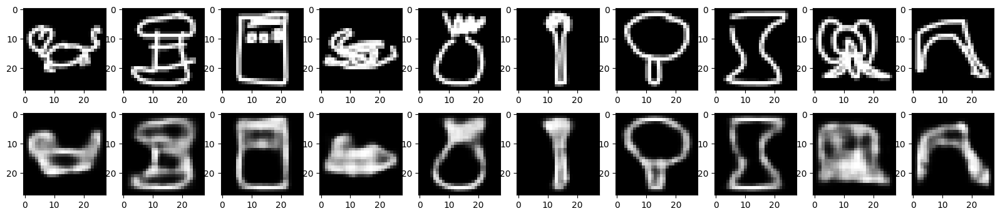

Val Performance:


<Figure size 640x480 with 0 Axes>

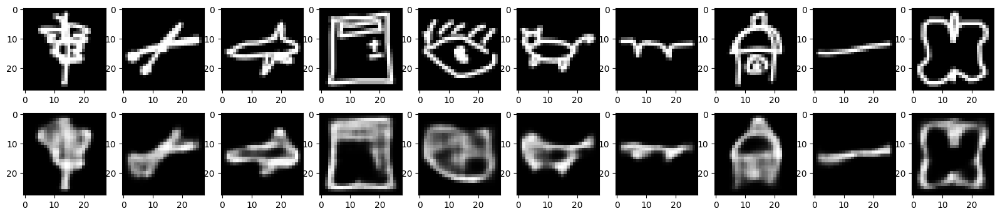

Epoch [8/20], Train Loader [5/10], Training Loss: 0.0604216738, Validation Loss: 0.0605224443
		Training Loss Recon: 0.01097,   Validation Loss Recon: 0.01103
		Training Loss L1: 0.03860,   Validation Loss L1: 0.07732
Epoch [8/20], Train Loader [6/10], Training Loss: 0.0604477695, Validation Loss: 0.0608049968
		Training Loss Recon: 0.01104,   Validation Loss Recon: 0.01119
		Training Loss L1: 0.03857,   Validation Loss L1: 0.07750
Epoch [8/20], Train Loader [7/10], Training Loss: 0.0604788326, Validation Loss: 0.0606990657
		Training Loss Recon: 0.01106,   Validation Loss Recon: 0.01110
		Training Loss L1: 0.03859,   Validation Loss L1: 0.07752
Epoch [8/20], Train Loader [8/10], Training Loss: 0.0604556590, Validation Loss: 0.0606945429
		Training Loss Recon: 0.01105,   Validation Loss Recon: 0.01114
		Training Loss L1: 0.03856,   Validation Loss L1: 0.07730
Epoch [8/20], Train Loader [9/10], Training Loss: 0.0604024602, Validation Loss: 0.0607995162
		Training Loss Recon: 0.01102,   

<Figure size 640x480 with 0 Axes>

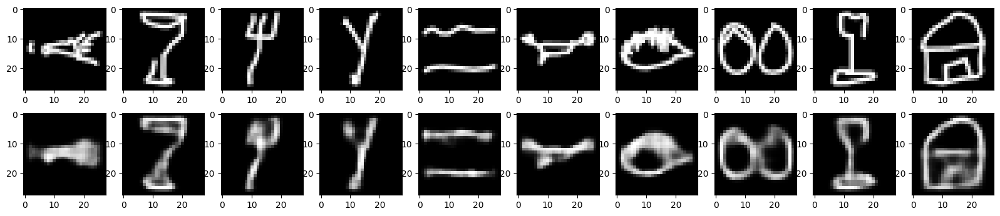

Val Performance:


<Figure size 640x480 with 0 Axes>

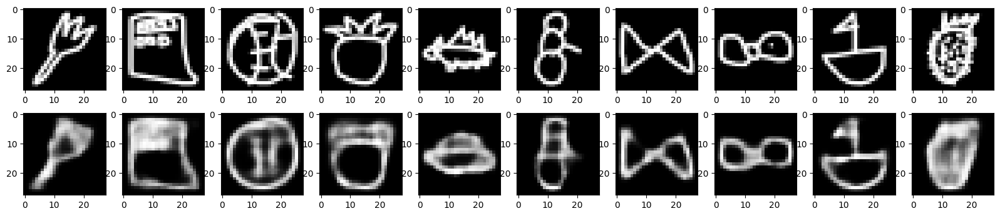

Epoch [8/20], Train Loader [10/10], Training Loss: 0.0604178442, Validation Loss: 0.0608718996
		Training Loss Recon: 0.01108,   Validation Loss Recon: 0.01133
		Training Loss L1: 0.03850,   Validation Loss L1: 0.07720
Epoch [9/20], Train Loader [1/10], Training Loss: 0.0603992138, Validation Loss: 0.0603341400
		Training Loss Recon: 0.01105,   Validation Loss Recon: 0.01087
		Training Loss L1: 0.03851,   Validation Loss L1: 0.07724
Epoch [9/20], Train Loader [2/10], Training Loss: 0.0603209283, Validation Loss: 0.0604385221
		Training Loss Recon: 0.01099,   Validation Loss Recon: 0.01110
		Training Loss L1: 0.03849,   Validation Loss L1: 0.07700
Epoch [9/20], Train Loader [3/10], Training Loss: 0.0603345583, Validation Loss: 0.0604269016
		Training Loss Recon: 0.01102,   Validation Loss Recon: 0.01097
		Training Loss L1: 0.03847,   Validation Loss L1: 0.07724
Epoch [9/20], Train Loader [4/10], Training Loss: 0.0602989916, Validation Loss: 0.0607789174
		Training Loss Recon: 0.01101,  

<Figure size 640x480 with 0 Axes>

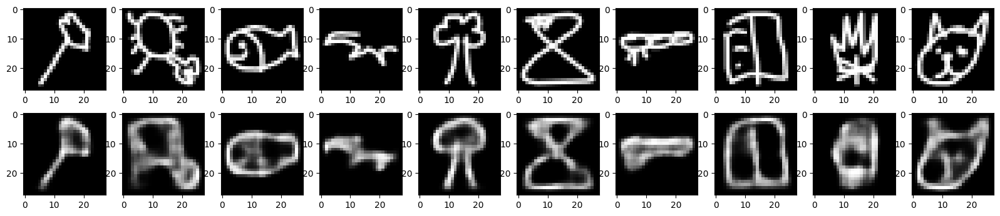

Val Performance:


<Figure size 640x480 with 0 Axes>

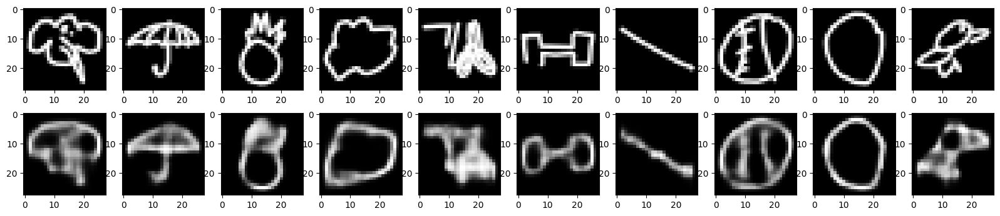

Epoch [9/20], Train Loader [5/10], Training Loss: 0.0602808205, Validation Loss: 0.0605079046
		Training Loss Recon: 0.01095,   Validation Loss Recon: 0.01119
		Training Loss L1: 0.03847,   Validation Loss L1: 0.07705
Epoch [9/20], Train Loader [6/10], Training Loss: 0.0602369811, Validation Loss: 0.0605359362
		Training Loss Recon: 0.01095,   Validation Loss Recon: 0.01104
		Training Loss L1: 0.03844,   Validation Loss L1: 0.07728
Epoch [9/20], Train Loader [7/10], Training Loss: 0.0603533386, Validation Loss: 0.0606673015
		Training Loss Recon: 0.01105,   Validation Loss Recon: 0.01123
		Training Loss L1: 0.03847,   Validation Loss L1: 0.07706
Epoch [9/20], Train Loader [8/10], Training Loss: 0.0602323700, Validation Loss: 0.0605443346
		Training Loss Recon: 0.01094,   Validation Loss Recon: 0.01109
		Training Loss L1: 0.03844,   Validation Loss L1: 0.07701
Epoch [9/20], Train Loader [9/10], Training Loss: 0.0603140826, Validation Loss: 0.0604697014
		Training Loss Recon: 0.01102,   

<Figure size 640x480 with 0 Axes>

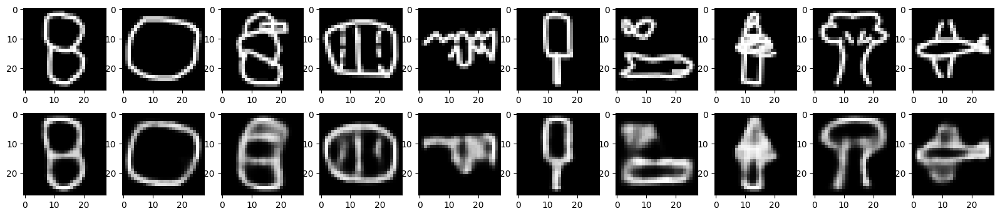

Val Performance:


<Figure size 640x480 with 0 Axes>

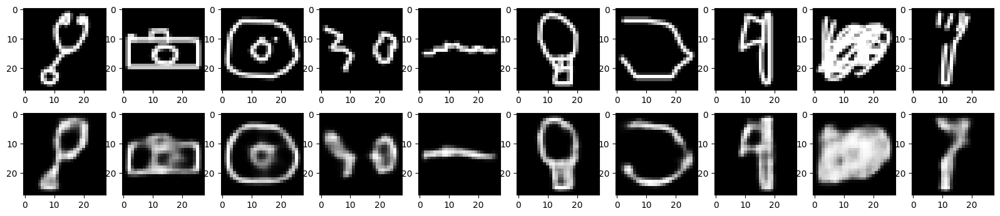

Epoch [9/20], Train Loader [10/10], Training Loss: 0.0601565651, Validation Loss: 0.0605481893
		Training Loss Recon: 0.01093,   Validation Loss Recon: 0.01107
		Training Loss L1: 0.03838,   Validation Loss L1: 0.07713
Epoch [10/20], Train Loader [1/10], Training Loss: 0.0601854382, Validation Loss: 0.0603049987
		Training Loss Recon: 0.01093,   Validation Loss Recon: 0.01104
		Training Loss L1: 0.03840,   Validation Loss L1: 0.07682
Epoch [10/20], Train Loader [2/10], Training Loss: 0.0601696609, Validation Loss: 0.0605105263
		Training Loss Recon: 0.01093,   Validation Loss Recon: 0.01115
		Training Loss L1: 0.03840,   Validation Loss L1: 0.07691
Epoch [10/20], Train Loader [3/10], Training Loss: 0.0602006951, Validation Loss: 0.0607050386
		Training Loss Recon: 0.01094,   Validation Loss Recon: 0.01127
		Training Loss L1: 0.03840,   Validation Loss L1: 0.07697
Epoch [10/20], Train Loader [4/10], Training Loss: 0.0601565740, Validation Loss: 0.0604361847
		Training Loss Recon: 0.0109

<Figure size 640x480 with 0 Axes>

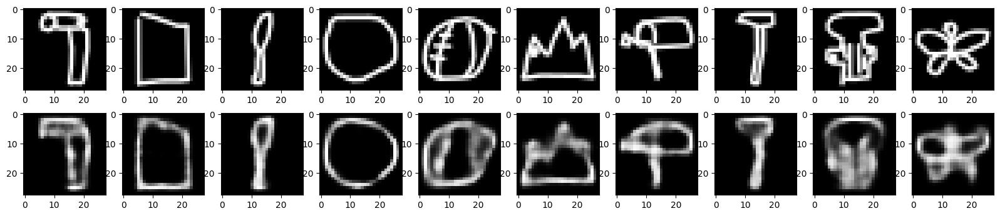

Val Performance:


<Figure size 640x480 with 0 Axes>

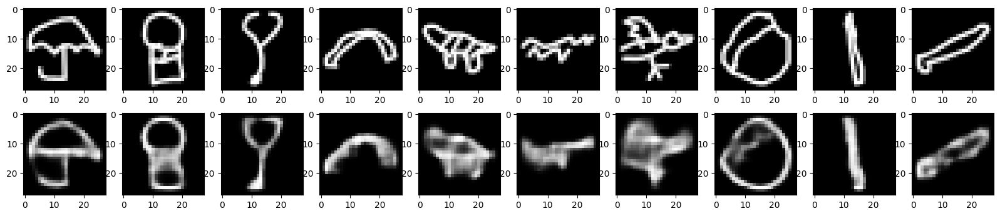

Epoch [10/20], Train Loader [5/10], Training Loss: 0.0601757928, Validation Loss: 0.0603397034
		Training Loss Recon: 0.01095,   Validation Loss Recon: 0.01111
		Training Loss L1: 0.03837,   Validation Loss L1: 0.07687
Epoch [10/20], Train Loader [6/10], Training Loss: 0.0601342994, Validation Loss: 0.0604793836
		Training Loss Recon: 0.01091,   Validation Loss Recon: 0.01110
		Training Loss L1: 0.03838,   Validation Loss L1: 0.07708
Epoch [10/20], Train Loader [7/10], Training Loss: 0.0601323663, Validation Loss: 0.0603070131
		Training Loss Recon: 0.01092,   Validation Loss Recon: 0.01099
		Training Loss L1: 0.03837,   Validation Loss L1: 0.07692
Epoch [10/20], Train Loader [8/10], Training Loss: 0.0601236270, Validation Loss: 0.0602428586
		Training Loss Recon: 0.01092,   Validation Loss Recon: 0.01087
		Training Loss L1: 0.03832,   Validation Loss L1: 0.07697
Epoch [10/20], Train Loader [9/10], Training Loss: 0.0600902189, Validation Loss: 0.0605580194
		Training Loss Recon: 0.0109

<Figure size 640x480 with 0 Axes>

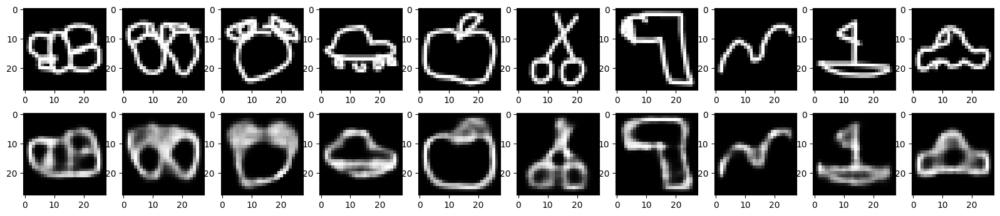

Val Performance:


<Figure size 640x480 with 0 Axes>

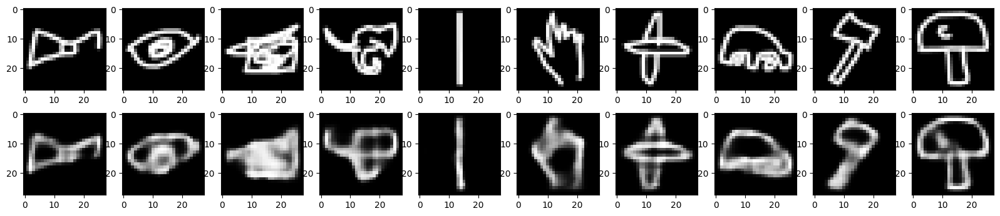

Epoch [10/20], Train Loader [10/10], Training Loss: 0.0601371683, Validation Loss: 0.0603555607
		Training Loss Recon: 0.01098,   Validation Loss Recon: 0.01104
		Training Loss L1: 0.03831,   Validation Loss L1: 0.07693
Epoch [11/20], Train Loader [1/10], Training Loss: 0.0600605856, Validation Loss: 0.0603097947
		Training Loss Recon: 0.01088,   Validation Loss Recon: 0.01094
		Training Loss L1: 0.03832,   Validation Loss L1: 0.07684
Epoch [11/20], Train Loader [2/10], Training Loss: 0.0600004817, Validation Loss: 0.0604136401
		Training Loss Recon: 0.01084,   Validation Loss Recon: 0.01125
		Training Loss L1: 0.03830,   Validation Loss L1: 0.07671
Epoch [11/20], Train Loader [3/10], Training Loss: 0.0601971111, Validation Loss: 0.0605553966
		Training Loss Recon: 0.01101,   Validation Loss Recon: 0.01128
		Training Loss L1: 0.03833,   Validation Loss L1: 0.07689
Epoch [11/20], Train Loader [4/10], Training Loss: 0.0601307662, Validation Loss: 0.0604627531
		Training Loss Recon: 0.010

<Figure size 640x480 with 0 Axes>

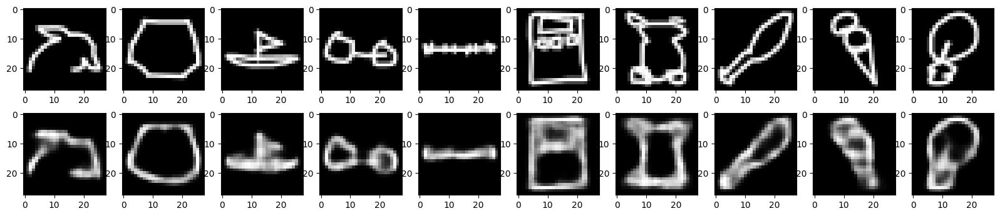

Val Performance:


<Figure size 640x480 with 0 Axes>

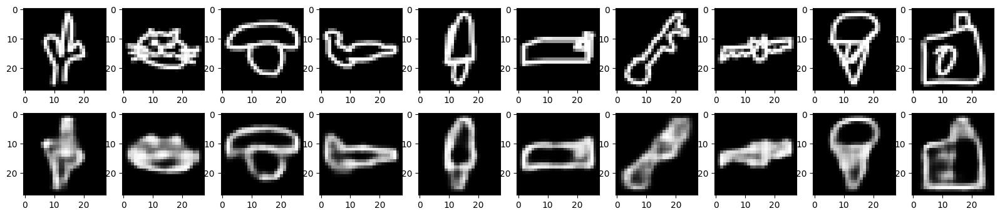

Epoch [11/20], Train Loader [5/10], Training Loss: 0.0600522378, Validation Loss: 0.0602237187
		Training Loss Recon: 0.01087,   Validation Loss Recon: 0.01097
		Training Loss L1: 0.03832,   Validation Loss L1: 0.07677
Epoch [11/20], Train Loader [6/10], Training Loss: 0.0601243381, Validation Loss: 0.0607879338
		Training Loss Recon: 0.01100,   Validation Loss Recon: 0.01142
		Training Loss L1: 0.03828,   Validation Loss L1: 0.07690
Epoch [11/20], Train Loader [7/10], Training Loss: 0.0601463238, Validation Loss: 0.0604118661
		Training Loss Recon: 0.01101,   Validation Loss Recon: 0.01110
		Training Loss L1: 0.03830,   Validation Loss L1: 0.07692
Epoch [11/20], Train Loader [8/10], Training Loss: 0.0600532906, Validation Loss: 0.0602262635
		Training Loss Recon: 0.01091,   Validation Loss Recon: 0.01093
		Training Loss L1: 0.03828,   Validation Loss L1: 0.07678
Epoch [11/20], Train Loader [9/10], Training Loss: 0.0601120037, Validation Loss: 0.0603891761
		Training Loss Recon: 0.0109

<Figure size 640x480 with 0 Axes>

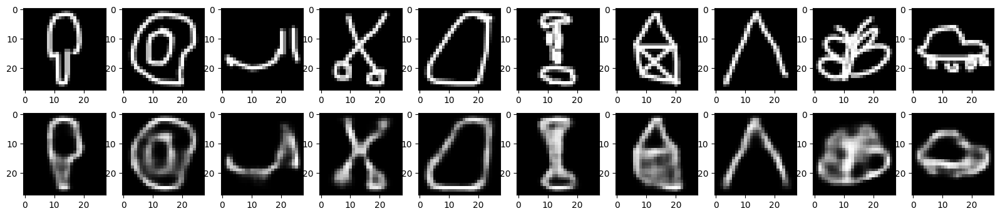

Val Performance:


<Figure size 640x480 with 0 Axes>

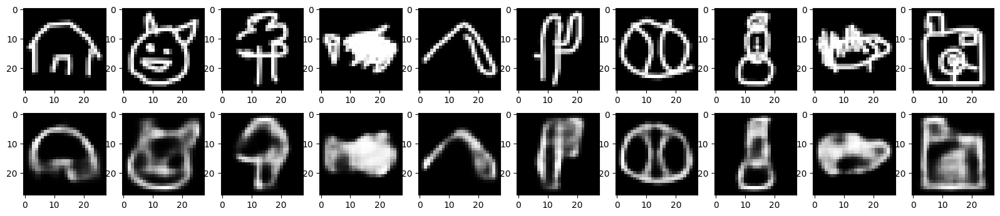

Epoch [11/20], Train Loader [10/10], Training Loss: 0.0600023322, Validation Loss: 0.0605895736
		Training Loss Recon: 0.01088,   Validation Loss Recon: 0.01131
		Training Loss L1: 0.03826,   Validation Loss L1: 0.07673
Epoch [12/20], Train Loader [1/10], Training Loss: 0.0600449490, Validation Loss: 0.0601779416
		Training Loss Recon: 0.01094,   Validation Loss Recon: 0.01100
		Training Loss L1: 0.03826,   Validation Loss L1: 0.07661
Epoch [12/20], Train Loader [2/10], Training Loss: 0.0600207502, Validation Loss: 0.0603397798
		Training Loss Recon: 0.01090,   Validation Loss Recon: 0.01112
		Training Loss L1: 0.03827,   Validation Loss L1: 0.07676
Epoch [12/20], Train Loader [3/10], Training Loss: 0.0600999758, Validation Loss: 0.0603734157
		Training Loss Recon: 0.01095,   Validation Loss Recon: 0.01109
		Training Loss L1: 0.03828,   Validation Loss L1: 0.07680
Epoch [12/20], Train Loader [4/10], Training Loss: 0.0600247389, Validation Loss: 0.0605501349
		Training Loss Recon: 0.010

<Figure size 640x480 with 0 Axes>

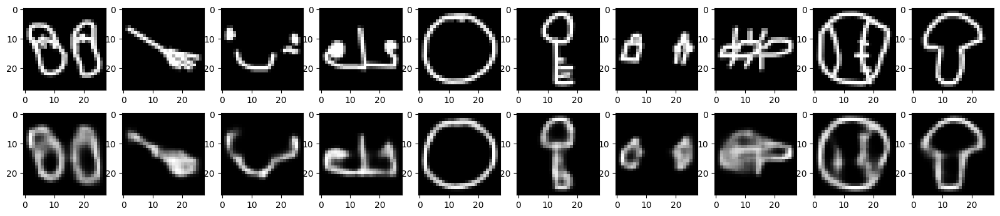

Val Performance:


<Figure size 640x480 with 0 Axes>

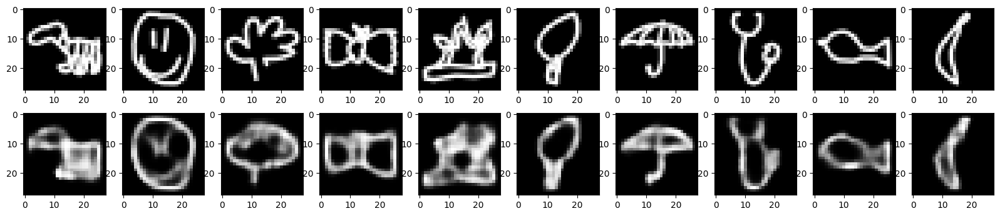

Epoch [12/20], Train Loader [5/10], Training Loss: 0.0599624266, Validation Loss: 0.0601563212
		Training Loss Recon: 0.01084,   Validation Loss Recon: 0.01106
		Training Loss L1: 0.03825,   Validation Loss L1: 0.07659
Epoch [12/20], Train Loader [6/10], Training Loss: 0.0599224314, Validation Loss: 0.0604605077
		Training Loss Recon: 0.01084,   Validation Loss Recon: 0.01112
		Training Loss L1: 0.03821,   Validation Loss L1: 0.07688
Epoch [12/20], Train Loader [7/10], Training Loss: 0.0601325887, Validation Loss: 0.0603248573
		Training Loss Recon: 0.01104,   Validation Loss Recon: 0.01116
		Training Loss L1: 0.03826,   Validation Loss L1: 0.07669
Epoch [12/20], Train Loader [8/10], Training Loss: 0.0599987685, Validation Loss: 0.0602743098
		Training Loss Recon: 0.01089,   Validation Loss Recon: 0.01094
		Training Loss L1: 0.03824,   Validation Loss L1: 0.07671
Epoch [12/20], Train Loader [9/10], Training Loss: 0.0601039697, Validation Loss: 0.0604421336
		Training Loss Recon: 0.0109

<Figure size 640x480 with 0 Axes>

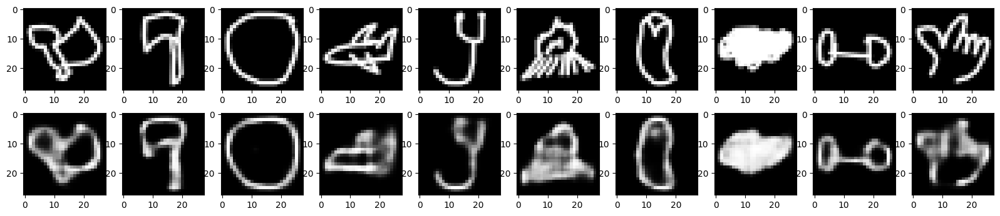

Val Performance:


<Figure size 640x480 with 0 Axes>

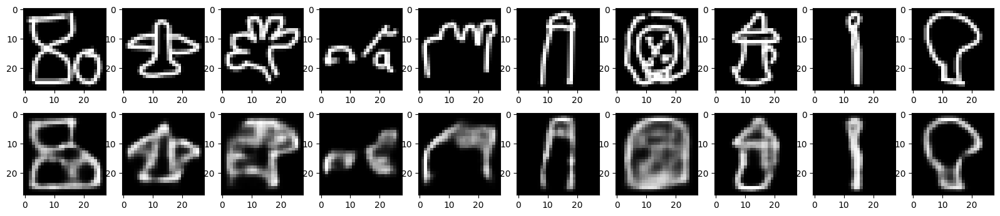

Epoch [12/20], Train Loader [10/10], Training Loss: 0.0599230985, Validation Loss: 0.0603561679
		Training Loss Recon: 0.01086,   Validation Loss Recon: 0.01108
		Training Loss L1: 0.03822,   Validation Loss L1: 0.07676
Epoch [13/20], Train Loader [1/10], Training Loss: 0.0599892362, Validation Loss: 0.0602683342
		Training Loss Recon: 0.01092,   Validation Loss Recon: 0.01110
		Training Loss L1: 0.03821,   Validation Loss L1: 0.07654
Epoch [13/20], Train Loader [2/10], Training Loss: 0.0598432531, Validation Loss: 0.0602053887
		Training Loss Recon: 0.01080,   Validation Loss Recon: 0.01106
		Training Loss L1: 0.03819,   Validation Loss L1: 0.07656
Epoch [13/20], Train Loader [3/10], Training Loss: 0.0600152782, Validation Loss: 0.0604076997
		Training Loss Recon: 0.01092,   Validation Loss Recon: 0.01122
		Training Loss L1: 0.03823,   Validation Loss L1: 0.07673
Epoch [13/20], Train Loader [4/10], Training Loss: 0.0599970336, Validation Loss: 0.0603633290
		Training Loss Recon: 0.010

<Figure size 640x480 with 0 Axes>

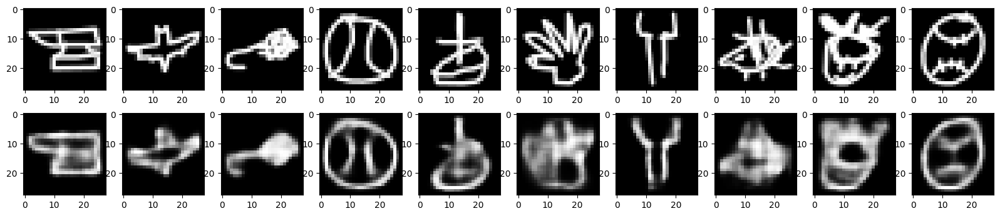

Val Performance:


<Figure size 640x480 with 0 Axes>

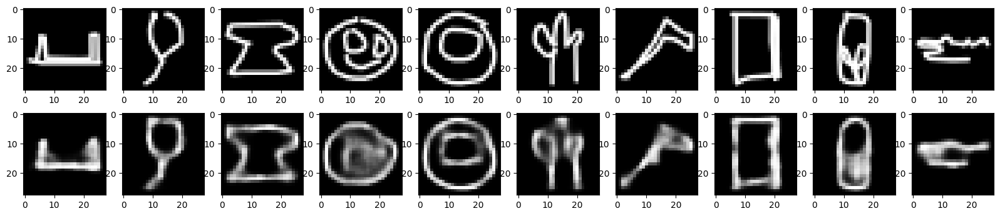

Epoch [13/20], Train Loader [5/10], Training Loss: 0.0600075753, Validation Loss: 0.0600903676
		Training Loss Recon: 0.01091,   Validation Loss Recon: 0.01097
		Training Loss L1: 0.03822,   Validation Loss L1: 0.07661
Epoch [13/20], Train Loader [6/10], Training Loss: 0.0599310989, Validation Loss: 0.0605325320
		Training Loss Recon: 0.01088,   Validation Loss Recon: 0.01131
		Training Loss L1: 0.03820,   Validation Loss L1: 0.07653
Epoch [13/20], Train Loader [7/10], Training Loss: 0.0600292480, Validation Loss: 0.0602953192
		Training Loss Recon: 0.01099,   Validation Loss Recon: 0.01115
		Training Loss L1: 0.03819,   Validation Loss L1: 0.07657
Epoch [13/20], Train Loader [8/10], Training Loss: 0.0599330456, Validation Loss: 0.0601783722
		Training Loss Recon: 0.01089,   Validation Loss Recon: 0.01102
		Training Loss L1: 0.03819,   Validation Loss L1: 0.07657
Epoch [13/20], Train Loader [9/10], Training Loss: 0.0599940948, Validation Loss: 0.0601506904
		Training Loss Recon: 0.0109

<Figure size 640x480 with 0 Axes>

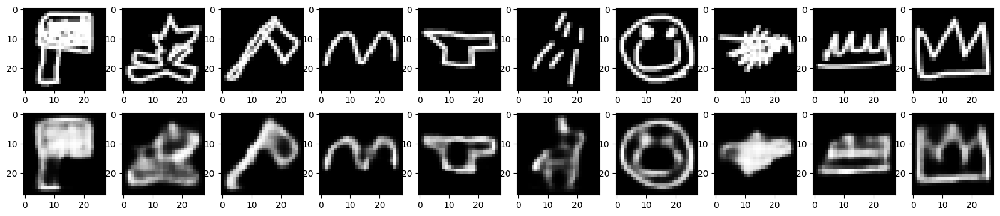

Val Performance:


<Figure size 640x480 with 0 Axes>

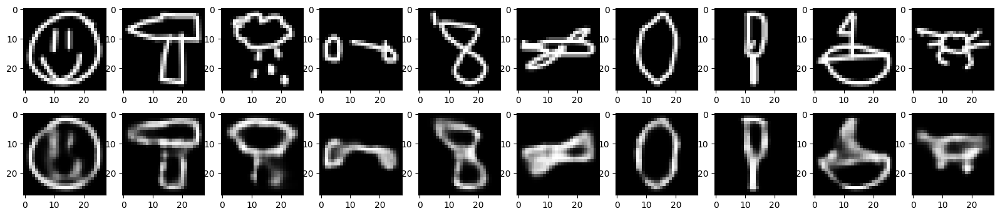

Epoch [13/20], Train Loader [10/10], Training Loss: 0.0598602924, Validation Loss: 0.0603007843
		Training Loss Recon: 0.01085,   Validation Loss Recon: 0.01108
		Training Loss L1: 0.03814,   Validation Loss L1: 0.07655
Epoch [14/20], Train Loader [1/10], Training Loss: 0.0599365113, Validation Loss: 0.0602241576
		Training Loss Recon: 0.01091,   Validation Loss Recon: 0.01109
		Training Loss L1: 0.03817,   Validation Loss L1: 0.07647
Epoch [14/20], Train Loader [2/10], Training Loss: 0.0597977392, Validation Loss: 0.0601426852
		Training Loss Recon: 0.01079,   Validation Loss Recon: 0.01104
		Training Loss L1: 0.03814,   Validation Loss L1: 0.07650
Epoch [14/20], Train Loader [3/10], Training Loss: 0.0599267096, Validation Loss: 0.0602000556
		Training Loss Recon: 0.01088,   Validation Loss Recon: 0.01106
		Training Loss L1: 0.03818,   Validation Loss L1: 0.07655
Epoch [14/20], Train Loader [4/10], Training Loss: 0.0598730694, Validation Loss: 0.0603399328
		Training Loss Recon: 0.010

<Figure size 640x480 with 0 Axes>

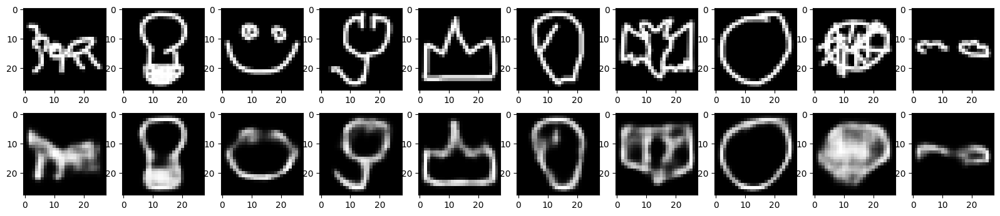

Val Performance:


<Figure size 640x480 with 0 Axes>

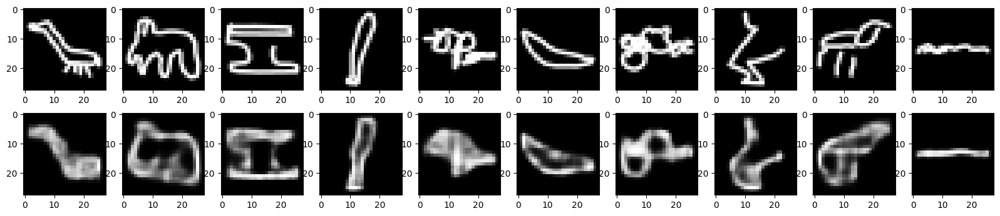

Epoch [14/20], Train Loader [5/10], Training Loss: 0.0598495459, Validation Loss: 0.0601924871
		Training Loss Recon: 0.01081,   Validation Loss Recon: 0.01107
		Training Loss L1: 0.03817,   Validation Loss L1: 0.07656
Epoch [14/20], Train Loader [6/10], Training Loss: 0.0598726155, Validation Loss: 0.0604248464
		Training Loss Recon: 0.01087,   Validation Loss Recon: 0.01121
		Training Loss L1: 0.03814,   Validation Loss L1: 0.07665
Epoch [14/20], Train Loader [7/10], Training Loss: 0.0600219891, Validation Loss: 0.0604243109
		Training Loss Recon: 0.01101,   Validation Loss Recon: 0.01131
		Training Loss L1: 0.03817,   Validation Loss L1: 0.07653
Epoch [14/20], Train Loader [8/10], Training Loss: 0.0599337895, Validation Loss: 0.0601702750
		Training Loss Recon: 0.01091,   Validation Loss Recon: 0.01093
		Training Loss L1: 0.03815,   Validation Loss L1: 0.07662
Epoch [14/20], Train Loader [9/10], Training Loss: 0.0598662868, Validation Loss: 0.0602222176
		Training Loss Recon: 0.0108

<Figure size 640x480 with 0 Axes>

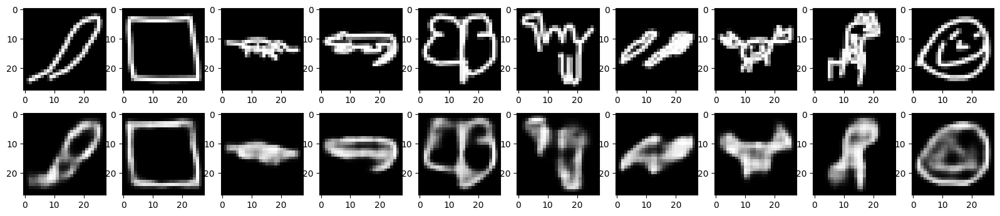

Val Performance:


<Figure size 640x480 with 0 Axes>

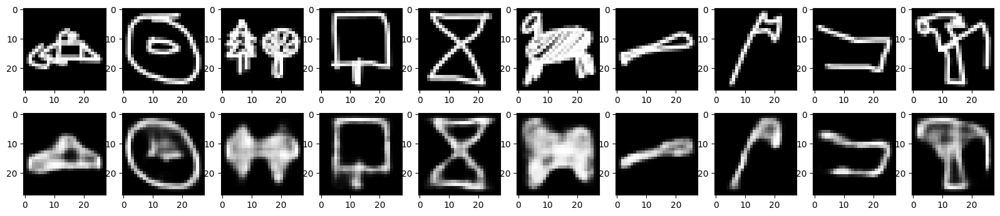

Epoch [14/20], Train Loader [10/10], Training Loss: 0.0598312989, Validation Loss: 0.0604605243
		Training Loss Recon: 0.01086,   Validation Loss Recon: 0.01129
		Training Loss L1: 0.03810,   Validation Loss L1: 0.07662
Epoch [15/20], Train Loader [1/10], Training Loss: 0.0599003755, Validation Loss: 0.0600706613
		Training Loss Recon: 0.01091,   Validation Loss Recon: 0.01097
		Training Loss L1: 0.03813,   Validation Loss L1: 0.07640
Epoch [15/20], Train Loader [2/10], Training Loss: 0.0598839109, Validation Loss: 0.0600769801
		Training Loss Recon: 0.01090,   Validation Loss Recon: 0.01104
		Training Loss L1: 0.03812,   Validation Loss L1: 0.07640
Epoch [15/20], Train Loader [3/10], Training Loss: 0.0599380775, Validation Loss: 0.0602578844
		Training Loss Recon: 0.01089,   Validation Loss Recon: 0.01106
		Training Loss L1: 0.03815,   Validation Loss L1: 0.07657
Epoch [15/20], Train Loader [4/10], Training Loss: 0.0598292745, Validation Loss: 0.0604557325
		Training Loss Recon: 0.010

<Figure size 640x480 with 0 Axes>

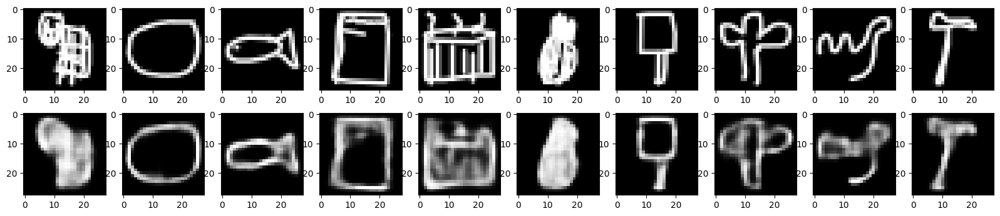

Val Performance:


<Figure size 640x480 with 0 Axes>

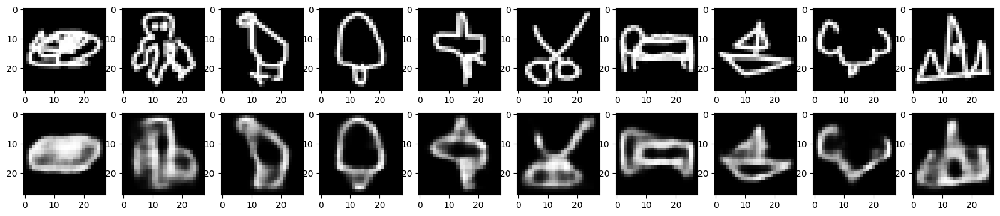

Epoch [15/20], Train Loader [5/10], Training Loss: 0.0598594363, Validation Loss: 0.0601084845
		Training Loss Recon: 0.01085,   Validation Loss Recon: 0.01102
		Training Loss L1: 0.03814,   Validation Loss L1: 0.07654
Epoch [15/20], Train Loader [6/10], Training Loss: 0.0598610870, Validation Loss: 0.0605597955
		Training Loss Recon: 0.01086,   Validation Loss Recon: 0.01137
		Training Loss L1: 0.03812,   Validation Loss L1: 0.07655
Epoch [15/20], Train Loader [7/10], Training Loss: 0.0599402876, Validation Loss: 0.0601271404
		Training Loss Recon: 0.01093,   Validation Loss Recon: 0.01092
		Training Loss L1: 0.03814,   Validation Loss L1: 0.07665
Epoch [15/20], Train Loader [8/10], Training Loss: 0.0598115278, Validation Loss: 0.0599317514
		Training Loss Recon: 0.01082,   Validation Loss Recon: 0.01084
		Training Loss L1: 0.03811,   Validation Loss L1: 0.07643
Epoch [15/20], Train Loader [9/10], Training Loss: 0.0598578673, Validation Loss: 0.0601558735
		Training Loss Recon: 0.0108

<Figure size 640x480 with 0 Axes>

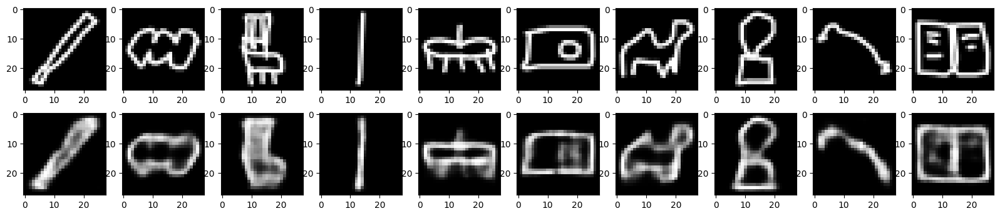

Val Performance:


<Figure size 640x480 with 0 Axes>

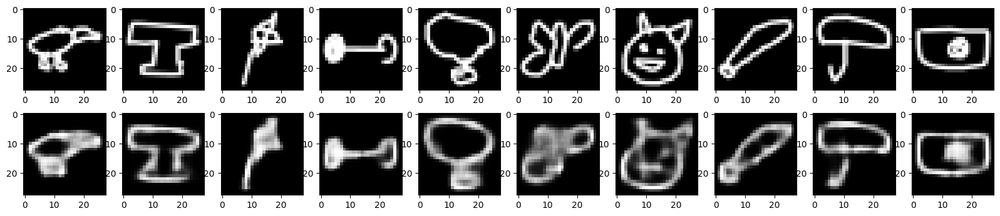

Epoch [15/20], Train Loader [10/10], Training Loss: 0.0597919351, Validation Loss: 0.0603703103
		Training Loss Recon: 0.01084,   Validation Loss Recon: 0.01115
		Training Loss L1: 0.03808,   Validation Loss L1: 0.07642
Epoch [16/20], Train Loader [1/10], Training Loss: 0.0598508933, Validation Loss: 0.0599900700
		Training Loss Recon: 0.01087,   Validation Loss Recon: 0.01091
		Training Loss L1: 0.03812,   Validation Loss L1: 0.07638
Epoch [16/20], Train Loader [2/10], Training Loss: 0.0598022030, Validation Loss: 0.0603071442
		Training Loss Recon: 0.01084,   Validation Loss Recon: 0.01123
		Training Loss L1: 0.03807,   Validation Loss L1: 0.07630
Epoch [16/20], Train Loader [3/10], Training Loss: 0.0598308358, Validation Loss: 0.0604211274
		Training Loss Recon: 0.01084,   Validation Loss Recon: 0.01136
		Training Loss L1: 0.03809,   Validation Loss L1: 0.07642
Epoch [16/20], Train Loader [4/10], Training Loss: 0.0598825853, Validation Loss: 0.0601643795
		Training Loss Recon: 0.010

<Figure size 640x480 with 0 Axes>

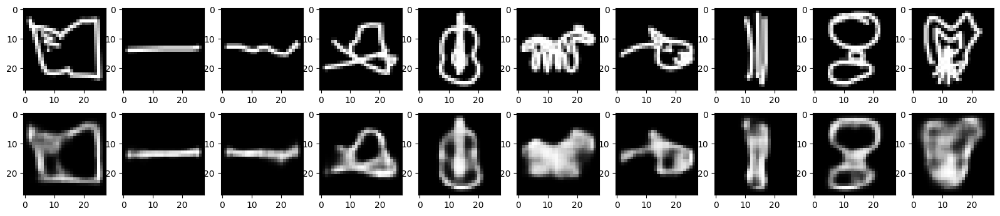

Val Performance:


<Figure size 640x480 with 0 Axes>

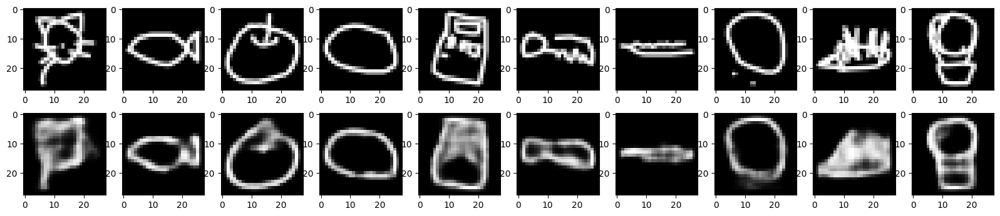

Epoch [16/20], Train Loader [5/10], Training Loss: 0.0598316995, Validation Loss: 0.0601617351
		Training Loss Recon: 0.01085,   Validation Loss Recon: 0.01107
		Training Loss L1: 0.03810,   Validation Loss L1: 0.07645
Epoch [16/20], Train Loader [6/10], Training Loss: 0.0598192063, Validation Loss: 0.0600786720
		Training Loss Recon: 0.01084,   Validation Loss Recon: 0.01091
		Training Loss L1: 0.03810,   Validation Loss L1: 0.07651
Epoch [16/20], Train Loader [7/10], Training Loss: 0.0598919442, Validation Loss: 0.0602681528
		Training Loss Recon: 0.01092,   Validation Loss Recon: 0.01116
		Training Loss L1: 0.03810,   Validation Loss L1: 0.07649
Epoch [16/20], Train Loader [8/10], Training Loss: 0.0598516308, Validation Loss: 0.0604135393
		Training Loss Recon: 0.01089,   Validation Loss Recon: 0.01126
		Training Loss L1: 0.03806,   Validation Loss L1: 0.07635
Epoch [16/20], Train Loader [9/10], Training Loss: 0.0598844321, Validation Loss: 0.0600200835
		Training Loss Recon: 0.0109

<Figure size 640x480 with 0 Axes>

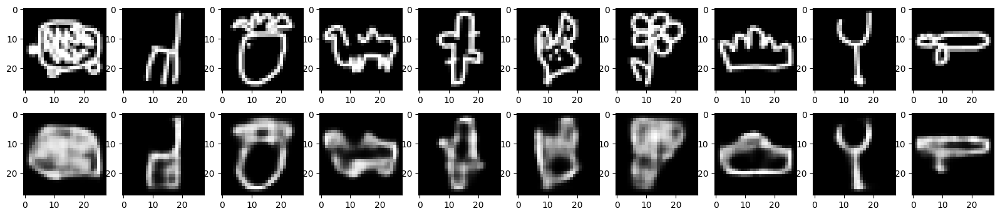

Val Performance:


<Figure size 640x480 with 0 Axes>

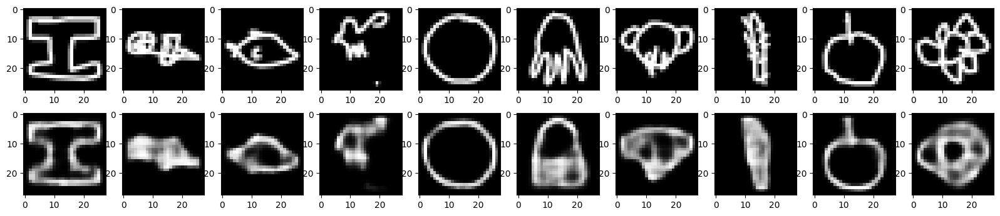

Epoch [16/20], Train Loader [10/10], Training Loss: 0.0597787061, Validation Loss: 0.0603128958
		Training Loss Recon: 0.01086,   Validation Loss Recon: 0.01116
		Training Loss L1: 0.03807,   Validation Loss L1: 0.07647
Epoch [17/20], Train Loader [1/10], Training Loss: 0.0597778249, Validation Loss: 0.0603555827
		Training Loss Recon: 0.01085,   Validation Loss Recon: 0.01121
		Training Loss L1: 0.03807,   Validation Loss L1: 0.07649
Epoch [17/20], Train Loader [2/10], Training Loss: 0.0598322856, Validation Loss: 0.0602126553
		Training Loss Recon: 0.01086,   Validation Loss Recon: 0.01120
		Training Loss L1: 0.03805,   Validation Loss L1: 0.07619
Epoch [17/20], Train Loader [3/10], Training Loss: 0.0599388744, Validation Loss: 0.0606424333
		Training Loss Recon: 0.01095,   Validation Loss Recon: 0.01159
		Training Loss L1: 0.03808,   Validation Loss L1: 0.07631
Epoch [17/20], Train Loader [4/10], Training Loss: 0.0599202548, Validation Loss: 0.0602728423
		Training Loss Recon: 0.010

<Figure size 640x480 with 0 Axes>

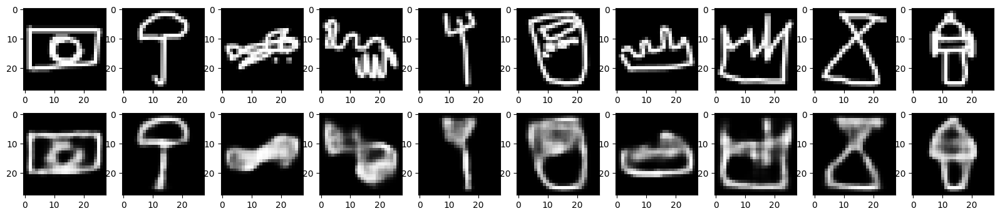

Val Performance:


<Figure size 640x480 with 0 Axes>

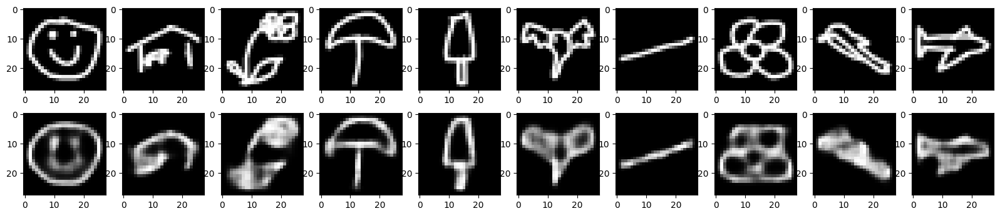

Epoch [17/20], Train Loader [5/10], Training Loss: 0.0598030312, Validation Loss: 0.0601065174
		Training Loss Recon: 0.01082,   Validation Loss Recon: 0.01108
		Training Loss L1: 0.03808,   Validation Loss L1: 0.07637
Epoch [17/20], Train Loader [6/10], Training Loss: 0.0597585160, Validation Loss: 0.0606146339
		Training Loss Recon: 0.01085,   Validation Loss Recon: 0.01145
		Training Loss L1: 0.03803,   Validation Loss L1: 0.07653
Epoch [17/20], Train Loader [7/10], Training Loss: 0.0598777262, Validation Loss: 0.0603352976
		Training Loss Recon: 0.01092,   Validation Loss Recon: 0.01124
		Training Loss L1: 0.03808,   Validation Loss L1: 0.07647
Epoch [17/20], Train Loader [8/10], Training Loss: 0.0598681229, Validation Loss: 0.0602781661
		Training Loss Recon: 0.01095,   Validation Loss Recon: 0.01108
		Training Loss L1: 0.03806,   Validation Loss L1: 0.07645
Epoch [17/20], Train Loader [9/10], Training Loss: 0.0598933090, Validation Loss: 0.0602753900
		Training Loss Recon: 0.0109

<Figure size 640x480 with 0 Axes>

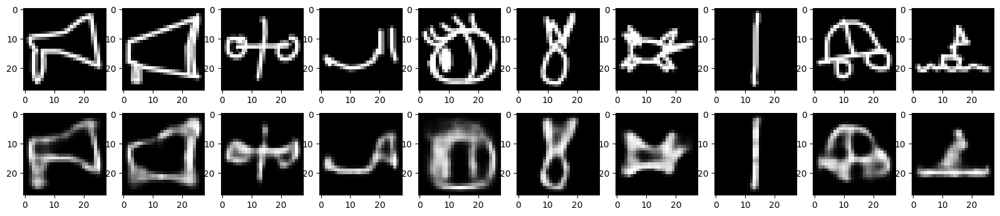

Val Performance:


<Figure size 640x480 with 0 Axes>

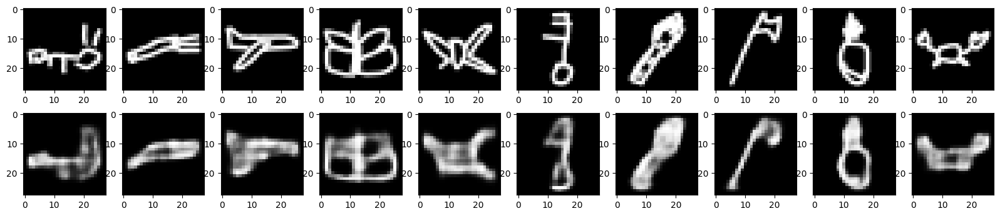

Epoch [17/20], Train Loader [10/10], Training Loss: 0.0598058393, Validation Loss: 0.0604407997
		Training Loss Recon: 0.01089,   Validation Loss Recon: 0.01136
		Training Loss L1: 0.03803,   Validation Loss L1: 0.07626
Epoch [18/20], Train Loader [1/10], Training Loss: 0.0597922565, Validation Loss: 0.0600543155
		Training Loss Recon: 0.01088,   Validation Loss Recon: 0.01100
		Training Loss L1: 0.03804,   Validation Loss L1: 0.07623
Epoch [18/20], Train Loader [2/10], Training Loss: 0.0597773659, Validation Loss: 0.0602006069
		Training Loss Recon: 0.01085,   Validation Loss Recon: 0.01118
		Training Loss L1: 0.03802,   Validation Loss L1: 0.07617
Epoch [18/20], Train Loader [3/10], Training Loss: 0.0598846714, Validation Loss: 0.0603862292
		Training Loss Recon: 0.01094,   Validation Loss Recon: 0.01129
		Training Loss L1: 0.03806,   Validation Loss L1: 0.07631
Epoch [18/20], Train Loader [4/10], Training Loss: 0.0599054401, Validation Loss: 0.0601841469
		Training Loss Recon: 0.010

<Figure size 640x480 with 0 Axes>

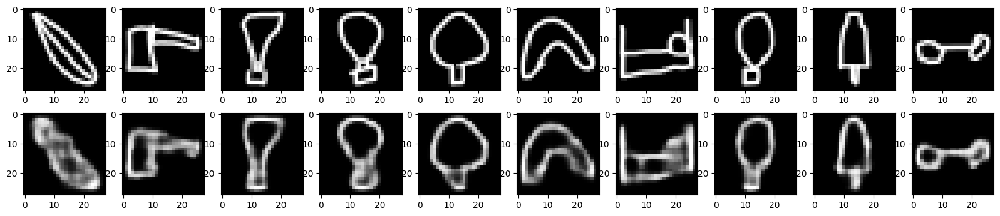

Val Performance:


<Figure size 640x480 with 0 Axes>

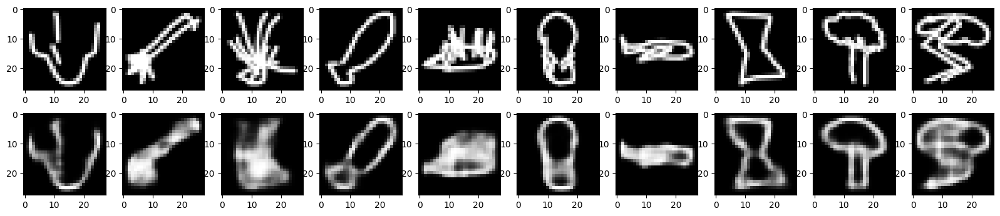

Epoch [18/20], Train Loader [5/10], Training Loss: 0.0598062704, Validation Loss: 0.0602314730
		Training Loss Recon: 0.01084,   Validation Loss Recon: 0.01115
		Training Loss L1: 0.03805,   Validation Loss L1: 0.07634
Epoch [18/20], Train Loader [6/10], Training Loss: 0.0598568760, Validation Loss: 0.0604417847
		Training Loss Recon: 0.01093,   Validation Loss Recon: 0.01132
		Training Loss L1: 0.03801,   Validation Loss L1: 0.07650
Epoch [18/20], Train Loader [7/10], Training Loss: 0.0598953740, Validation Loss: 0.0603323375
		Training Loss Recon: 0.01096,   Validation Loss Recon: 0.01123
		Training Loss L1: 0.03805,   Validation Loss L1: 0.07636
Epoch [18/20], Train Loader [8/10], Training Loss: 0.0598310031, Validation Loss: 0.0603839476
		Training Loss Recon: 0.01090,   Validation Loss Recon: 0.01128
		Training Loss L1: 0.03803,   Validation Loss L1: 0.07628
Epoch [18/20], Train Loader [9/10], Training Loss: 0.0598221167, Validation Loss: 0.0601595237
		Training Loss Recon: 0.0109

<Figure size 640x480 with 0 Axes>

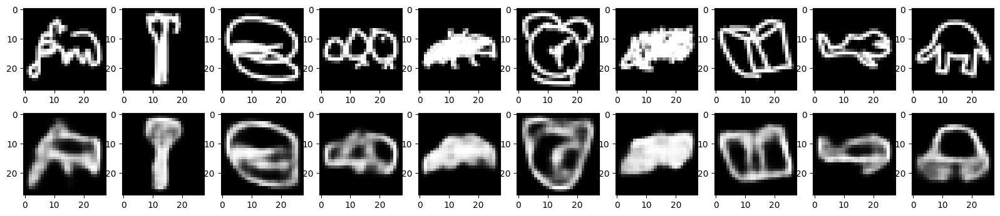

Val Performance:


<Figure size 640x480 with 0 Axes>

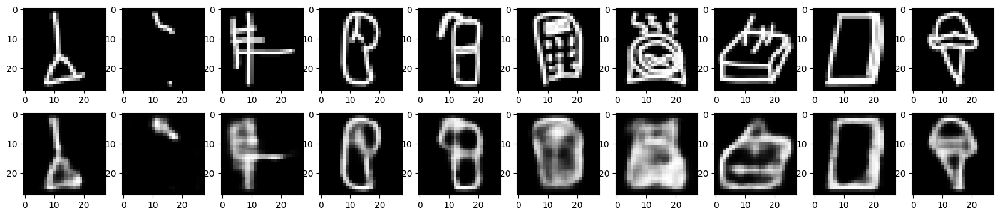

Epoch [18/20], Train Loader [10/10], Training Loss: 0.0597239142, Validation Loss: 0.0603822843
		Training Loss Recon: 0.01086,   Validation Loss Recon: 0.01124
		Training Loss L1: 0.03798,   Validation Loss L1: 0.07634
Epoch [19/20], Train Loader [1/10], Training Loss: 0.0598723201, Validation Loss: 0.0600335051
		Training Loss Recon: 0.01099,   Validation Loss Recon: 0.01107
		Training Loss L1: 0.03800,   Validation Loss L1: 0.07612
Epoch [19/20], Train Loader [2/10], Training Loss: 0.0598066024, Validation Loss: 0.0602717274
		Training Loss Recon: 0.01095,   Validation Loss Recon: 0.01116
		Training Loss L1: 0.03796,   Validation Loss L1: 0.07643
Epoch [19/20], Train Loader [3/10], Training Loss: 0.0598093075, Validation Loss: 0.0605237626
		Training Loss Recon: 0.01088,   Validation Loss Recon: 0.01146
		Training Loss L1: 0.03803,   Validation Loss L1: 0.07623
Epoch [19/20], Train Loader [4/10], Training Loss: 0.0596964620, Validation Loss: 0.0601477420
		Training Loss Recon: 0.010

<Figure size 640x480 with 0 Axes>

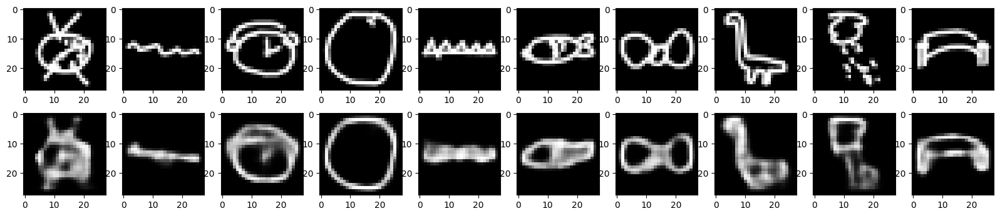

Val Performance:


<Figure size 640x480 with 0 Axes>

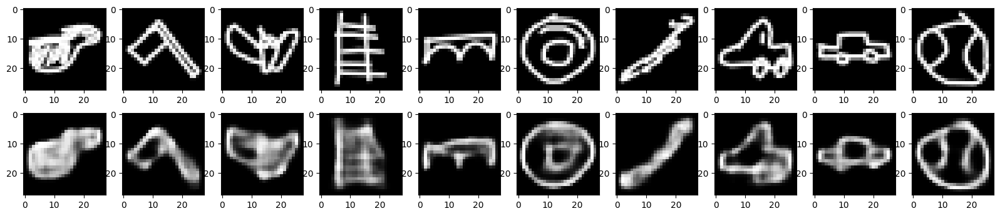

Epoch [19/20], Train Loader [5/10], Training Loss: 0.0597990179, Validation Loss: 0.0601189751
		Training Loss Recon: 0.01089,   Validation Loss Recon: 0.01100
		Training Loss L1: 0.03801,   Validation Loss L1: 0.07644
Epoch [19/20], Train Loader [6/10], Training Loss: 0.0597537490, Validation Loss: 0.0602817164
		Training Loss Recon: 0.01086,   Validation Loss Recon: 0.01116
		Training Loss L1: 0.03800,   Validation Loss L1: 0.07641
Epoch [19/20], Train Loader [7/10], Training Loss: 0.0598700507, Validation Loss: 0.0604095953
		Training Loss Recon: 0.01095,   Validation Loss Recon: 0.01120
		Training Loss L1: 0.03804,   Validation Loss L1: 0.07660
Epoch [19/20], Train Loader [8/10], Training Loss: 0.0598105945, Validation Loss: 0.0604664915
		Training Loss Recon: 0.01090,   Validation Loss Recon: 0.01128
		Training Loss L1: 0.03802,   Validation Loss L1: 0.07638
Epoch [19/20], Train Loader [9/10], Training Loss: 0.0597475277, Validation Loss: 0.0603191791
		Training Loss Recon: 0.0108

<Figure size 640x480 with 0 Axes>

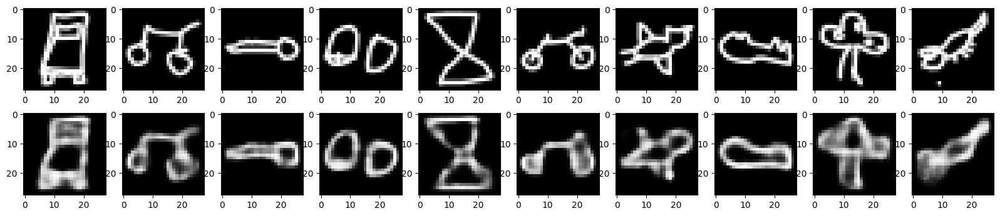

Val Performance:


<Figure size 640x480 with 0 Axes>

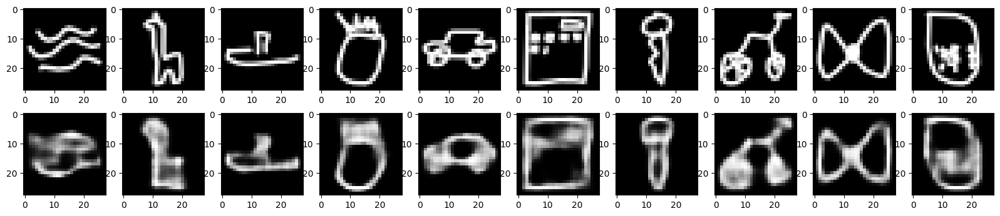

Epoch [19/20], Train Loader [10/10], Training Loss: 0.0597112793, Validation Loss: 0.0604982360
		Training Loss Recon: 0.01086,   Validation Loss Recon: 0.01131
		Training Loss L1: 0.03797,   Validation Loss L1: 0.07643
Epoch [20/20], Train Loader [1/10], Training Loss: 0.0598008624, Validation Loss: 0.0600556884
		Training Loss Recon: 0.01091,   Validation Loss Recon: 0.01101
		Training Loss L1: 0.03800,   Validation Loss L1: 0.07616
Epoch [20/20], Train Loader [2/10], Training Loss: 0.0597941314, Validation Loss: 0.0601192669
		Training Loss Recon: 0.01090,   Validation Loss Recon: 0.01109
		Training Loss L1: 0.03798,   Validation Loss L1: 0.07620
Epoch [20/20], Train Loader [3/10], Training Loss: 0.0597730807, Validation Loss: 0.0602095307
		Training Loss Recon: 0.01086,   Validation Loss Recon: 0.01113
		Training Loss L1: 0.03802,   Validation Loss L1: 0.07634
Epoch [20/20], Train Loader [4/10], Training Loss: 0.0597492201, Validation Loss: 0.0602804226
		Training Loss Recon: 0.010

<Figure size 640x480 with 0 Axes>

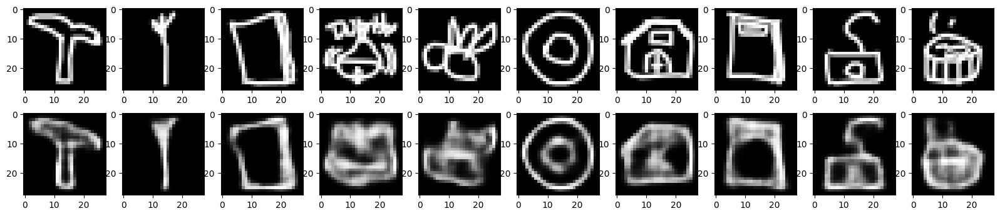

Val Performance:


<Figure size 640x480 with 0 Axes>

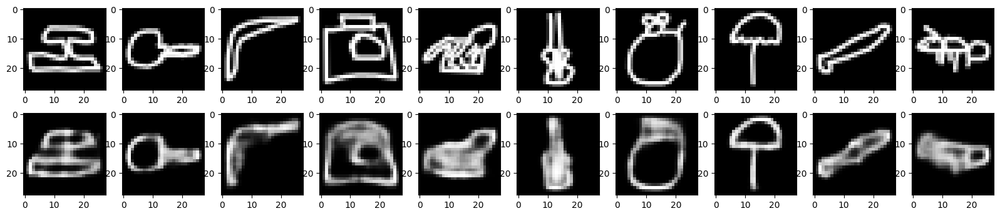

Epoch [20/20], Train Loader [5/10], Training Loss: 0.0598821957, Validation Loss: 0.0599657439
		Training Loss Recon: 0.01098,   Validation Loss Recon: 0.01102
		Training Loss L1: 0.03800,   Validation Loss L1: 0.07621
Epoch [20/20], Train Loader [6/10], Training Loss: 0.0598757739, Validation Loss: 0.0603979574
		Training Loss Recon: 0.01098,   Validation Loss Recon: 0.01134
		Training Loss L1: 0.03797,   Validation Loss L1: 0.07616
Epoch [20/20], Train Loader [7/10], Training Loss: 0.0597837421, Validation Loss: 0.0603586551
		Training Loss Recon: 0.01091,   Validation Loss Recon: 0.01137
		Training Loss L1: 0.03800,   Validation Loss L1: 0.07620
Epoch [20/20], Train Loader [8/10], Training Loss: 0.0597545877, Validation Loss: 0.0600914077
		Training Loss Recon: 0.01086,   Validation Loss Recon: 0.01098
		Training Loss L1: 0.03798,   Validation Loss L1: 0.07632
Epoch [20/20], Train Loader [9/10], Training Loss: 0.0597775306, Validation Loss: 0.0600381265
		Training Loss Recon: 0.0108

<Figure size 640x480 with 0 Axes>

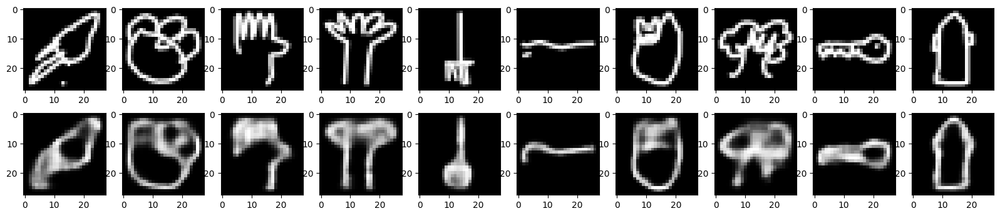

Val Performance:


<Figure size 640x480 with 0 Axes>

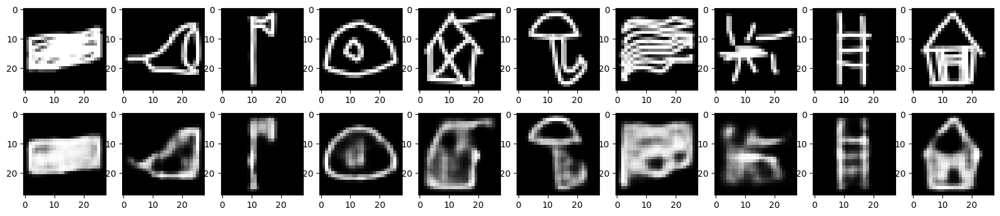

Epoch [20/20], Train Loader [10/10], Training Loss: 0.0596295796, Validation Loss: 0.0604733256
		Training Loss Recon: 0.01082,   Validation Loss Recon: 0.01138
		Training Loss L1: 0.03792,   Validation Loss L1: 0.07615


In [ ]:
train_losses, val_losses, train_losses_l1, val_losses_l1, train_losses_recon, val_losses_recon,train_losses_bce, val_losses_bce, train_losses_kld, val_losses_kld = train_class(vae_wild, 256, 0.001, 20, 'vae_new_comb_V4')

In [22]:
def VisualizeNew4(model, loader, dataset):
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
  classes = np.load('/content/drive/MyDrive/APS360/Project/Data/Classes.npy')
  with torch.no_grad(): #only evaluating - interested only in output
        total = 0
        correct = 0
        correct2 = 0
        correct3 = 0
        for images, labels in loader:
            images = images
            images = images.to(device).float()
            model = model.to(device)
            x_recon, pred, _, _  = model(images)
            pred_class = [classes[p.argmax()] for p in pred[:10]]
            #pred_class_2 = [classes[torch.cat([p[0:p.argmax()], torch.tensor([0]).to(device), p[p.argmax()+1:]]).argmax()] for p in pred[:10]]
            #indexes = [classes[p.argmax()],classes[torch.cat([p[0:p.argmax()], torch.tensor([0]).to(device), p[p.argmax()+1:]]).argmax()]]
            pred_class_2 =[classes[p.argsort(descending = True)[1]] for p in pred[:10]]
            pred_class_3 =[classes[p.argsort(descending = True)[2]] for p in pred[:10]]
            plt.figure()
            fig, ax = plt.subplots(nrows=1, ncols=20, figsize=(20, 10))
            for i in range(10):
                ax[i*2+1].imshow(images[i].reshape([28,28]).cpu().squeeze(), cmap='gray')
                ax[i*2].imshow(x_recon[i].reshape([28,28]).cpu().squeeze(), cmap='gray')
            plt.show()
            probs = pred[:10].max().sort(descending = True)
            print(pred_class)
            print(pred_class_2)
            print(pred_class_3)
            #print(tabulate(pred_class_2))
            print([classes[p] for p in labels[:10]])
              

            for i, val in enumerate(pred):

              total+=1
              ami = val.argmax()
              if ami == labels[i]:
                correct+=1
                correct2+=1
                correct3+=1
                continue
              val = torch.cat([val[0:ami], torch.zeros([1]).to(device), val[ami+1:]])
              ami = val.argmax()
              if ami == labels[i]:
                correct2+=1
                correct3+=1
                continue

              val = torch.cat([val[0:ami],torch.zeros([1]).to(device), val[ami+1:]])
              ami = val.argmax()
              ami = val.argmax()
              if ami == labels[i]:
                correct3+=1
                continue
              
            #only update correct number of labels if predicted matches ground truth
        print('Accuracy on {} dataset: {} %'.format(dataset, (100 * correct / total)))#show accuracy
        print('Accuracy on {} dataset within 2 guesses: {} %'.format(dataset, (100 * correct2 / total)))#show accuracy
        print('Accuracy on {} dataset within 3 guesses: {} %'.format(dataset, (100 * correct3 / total)))#show accuracy
  return

In [ ]:
vae_wild.load_state_dict(torch.load('/content/drive/MyDrive/APS360/Project/Models/FinalFinalFinal', map_location=torch.device('cpu')))

<ipython-input-5-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


<Figure size 640x480 with 0 Axes>

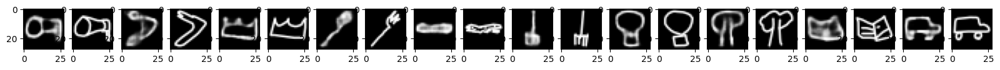

['ant', 'boomerang', 'sailboat', 'asparagus', 'crocodile', 'broom', 'hot air balloon', 'tree', 'book', 'car']
['megaphone', 'hammer', 'bat', 'fork', 'bat', 'chandelier', 'light bulb', 'mushroom', 'cat', 'line']
['bat', 'dolphin', 'hot tub', 'axe', 'cloud', 'scissors', 'square', 'hammer', 'bear', 'ant']
['megaphone', 'boomerang', 'crown', 'fork', 'crocodile', 'broom', 'hot air balloon', 'tree', 'book', 'car']


<Figure size 640x480 with 0 Axes>

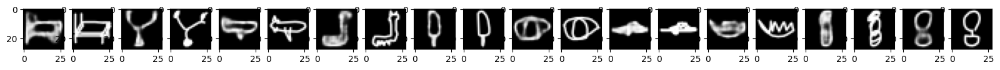

['bed', 'hedgehog', 'airplane', 'giraffe', 'popsicle', 'eye', 'umbrella', 'sailboat', 'key', 'hot air balloon']
['ant', 'scissors', 'ant', 'square', 'square', 'ant', 'fish', 'hand', 'cello', 'square']
['calculator', 'wine glass', 'crocodile', 'bird', 'flip flops', 'smiley face', 'hand', 'bat', 'snowman', 'snowman']
['bed', 'stethoscope', 'airplane', 'giraffe', 'popsicle', 'eye', 'airplane', 'crown', 'snowman', 'hot air balloon']


<Figure size 640x480 with 0 Axes>

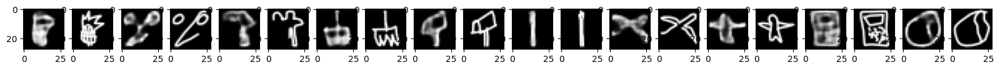

['pineapple', 'scissors', 'fork', 'chandelier', 'mailbox', 'asparagus', 'scissors', 'fire hydrant', 'calculator', 'baseball']
['cactus', 'hedgehog', 'camel', 'broom', 'tree', 'axe', 'airplane', 'airplane', 'hourglass', 'apple']
['campfire', 'bird', 'key', 'square', 'elephant', 'fork', 'lightning', 'bear', 'square', 'ant']
['pineapple', 'scissors', 'camel', 'chandelier', 'mailbox', 'asparagus', 'airplane', 'airplane', 'calculator', 'baseball']


<Figure size 640x480 with 0 Axes>

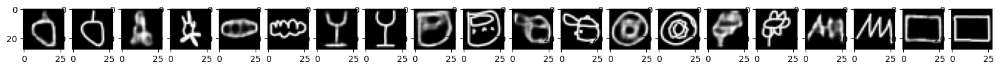

['apple', 'campfire', 'cloud', 'wine glass', 'calculator', 'alarm clock', 'donut', 'flower', 'mountain', 'circle']
['chandelier', 'square', 'hand', 'hedgehog', 'bear', 'barn', 'eye', 'lightning', 'square', 'square']
['bridge', 'chandelier', 'bear', 'square', 'alarm clock', 'fish', 'smiley face', 'fork', 'fish', 'bed']
['apple', 'campfire', 'cloud', 'wine glass', 'calculator', 'baseball bat', 'donut', 'flower', 'mountain', 'square']


<Figure size 640x480 with 0 Axes>

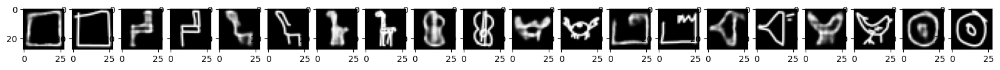

['circle', 'chair', 'giraffe', 'giraffe', 'cello', 'crab', 'sailboat', 'bird', 'scissors', 'donut']
['square', 'square', 'lightning', 'zebra', 'butterfly', 'cat', 'circle', 'cactus', 'airplane', 'baseball']
['bear', 'axe', 'chair', 'cello', 'chandelier', 'mailbox', 'ant', 'bear', 'crab', 'smiley face']
['square', 'chair', 'giraffe', 'giraffe', 'cello', 'crab', 'crown', 'megaphone', 'bird', 'donut']


<Figure size 640x480 with 0 Axes>

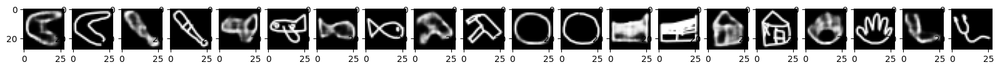

['boomerang', 'baseball bat', 'smiley face', 'fish', 'hammer', 'circle', 'bed', 'barn', 'hand', 'hedgehog']
['square', 'lightning', 'ant', 'dumbbell', 'umbrella', 'hexagon', 'wine glass', 'fire hydrant', 'cactus', 'lightning']
['lightning', 'ant', 'hot air balloon', 'bowtie', 'tree', 'square', 'circle', 'alarm clock', 'sailboat', 'banana']
['boomerang', 'baseball bat', 'airplane', 'fish', 'hammer', 'circle', 'flower', 'barn', 'hand', 'stethoscope']


<Figure size 640x480 with 0 Axes>

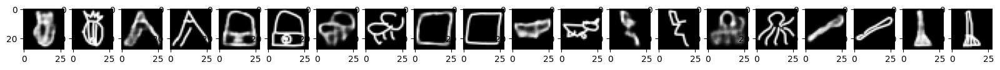

['pineapple', 'boomerang', 'barn', 'flip flops', 'circle', 'bear', 'lightning', 'octopus', 'baseball bat', 'broom']
['bear', 'mountain', 'square', 'bird', 'square', 'cat', 'square', 'rain', 'asparagus', 'scissors']
['square', 'square', 'hot air balloon', 'key', 'ant', 'hot air balloon', 'ladder', 'fire hydrant', 'broom', 'giraffe']
['pineapple', 'mountain', 'camera', 'ant', 'square', 'bear', 'lightning', 'octopus', 'baseball bat', 'broom']


<Figure size 640x480 with 0 Axes>

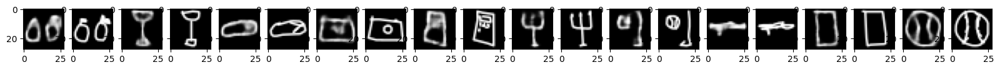

['flip flops', 'wine glass', 'flip flops', 'camera', 'calculator', 'chandelier', 'cactus', 'crocodile', 'square', 'baseball']
['fish', 'hourglass', 'cloud', 'circle', 'square', 'fork', 'fork', 'mailbox', 'circle', 'flip flops']
['mailbox', 'square', 'bird', 'square', 'bed', 'wine glass', 'light bulb', 'fire hydrant', 'chair', 'square']
['apple', 'wine glass', 'flip flops', 'camera', 'calculator', 'chandelier', 'baseball', 'airplane', 'square', 'baseball']


<Figure size 640x480 with 0 Axes>

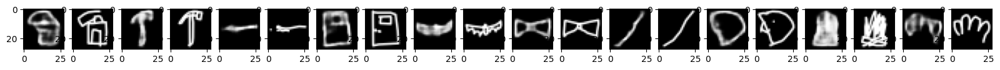

['fire hydrant', 'hammer', 'ocean', 'calculator', 'bat', 'bowtie', 'lightning', 'square', 'campfire', 'hand']
['barn', 'fire hydrant', 'bridge', 'book', 'chandelier', 'ant', 'line', 'tree', 'hot tub', 'flip flops']
['hot air balloon', 'umbrella', 'bird', 'square', 'ant', 'bridge', 'broom', 'light bulb', 'stethoscope', 'ant']
['barn', 'hammer', 'ocean', 'calculator', 'bat', 'bowtie', 'baseball bat', 'circle', 'campfire', 'hand']


<Figure size 640x480 with 0 Axes>

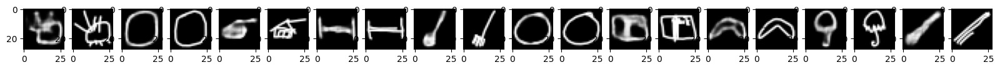

['chandelier', 'circle', 'crocodile', 'bed', 'broom', 'circle', 'book', 'boomerang', 'popsicle', 'broom']
['square', 'hexagon', 'anvil', 'bridge', 'giraffe', 'hexagon', 'square', 'bridge', 'hot air balloon', 'baseball bat']
['sailboat', 'square', 'barn', 'ant', 'scissors', 'cloud', 'tree', 'dolphin', 'umbrella', 'asparagus']
['hedgehog', 'circle', 'barn', 'bed', 'broom', 'circle', 'book', 'boomerang', 'umbrella', 'asparagus']


<Figure size 640x480 with 0 Axes>

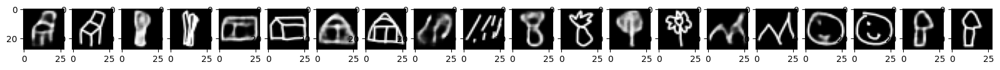

['chair', 'asparagus', 'barn', 'barn', 'mountain', 'pineapple', 'flower', 'mountain', 'smiley face', 'fire hydrant']
['bed', 'cello', 'camera', 'crab', 'cactus', 'bear', 'tree', 'bridge', 'square', 'bear']
['square', 'square', 'hot tub', 'chandelier', 'rain', 'hourglass', 'ant', 'bat', 'bear', 'ice cream']
['chair', 'asparagus', 'barn', 'barn', 'rain', 'pineapple', 'flower', 'mountain', 'smiley face', 'ice cream']


<Figure size 640x480 with 0 Axes>

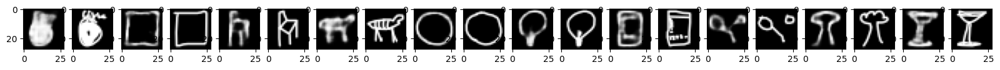

['pineapple', 'circle', 'cactus', 'zebra', 'circle', 'light bulb', 'calculator', 'tree', 'tree', 'wine glass']
['asparagus', 'book', 'mountain', 'fork', 'hexagon', 'hot air balloon', 'hourglass', 'hedgehog', 'fire hydrant', 'hourglass']
['barn', 'square', 'chair', 'popsicle', 'square', 'elephant', 'square', 'scissors', 'mushroom', 'square']
['circle', 'square', 'chair', 'zebra', 'circle', 'light bulb', 'calculator', 'stethoscope', 'tree', 'wine glass']


<Figure size 640x480 with 0 Axes>

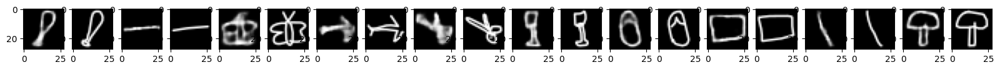

['baseball bat', 'line', 'butterfly', 'dolphin', 'scissors', 'wine glass', 'flip flops', 'circle', 'broom', 'mushroom']
['square', 'rain', 'chandelier', 'airplane', 'fork', 'tree', 'square', 'square', 'line', 'mailbox']
['key', 'square', 'fire hydrant', 'bridge', 'octopus', 'key', 'snowman', 'hot tub', 'lightning', 'hammer']
['baseball bat', 'hexagon', 'butterfly', 'airplane', 'scissors', 'wine glass', 'flip flops', 'square', 'line', 'mushroom']


<Figure size 640x480 with 0 Axes>

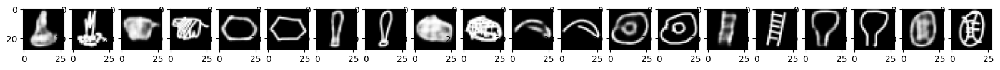

['campfire', 'zebra', 'hexagon', 'baseball bat', 'mushroom', 'boomerang', 'donut', 'ladder', 'light bulb', 'baseball']
['square', 'asparagus', 'square', 'key', 'dumbbell', 'dolphin', 'eye', 'chair', 'hot air balloon', 'cello']
['scissors', 'stethoscope', 'alarm clock', 'hot air balloon', 'stethoscope', 'bridge', 'smiley face', 'bear', 'ice cream', 'flower']
['campfire', 'zebra', 'hexagon', 'baseball bat', 'baseball', 'boomerang', 'donut', 'ladder', 'light bulb', 'baseball']


<Figure size 640x480 with 0 Axes>

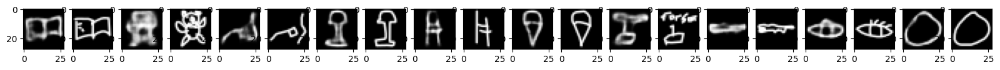

['book', 'bear', 'chair', 'wine glass', 'ladder', 'ice cream', 'bird', 'crocodile', 'bear', 'circle']
['butterfly', 'chair', 'megaphone', 'fire hydrant', 'chair', 'hot air balloon', 'hedgehog', 'ant', 'ant', 'hexagon']
['bat', 'tree', 'lightning', 'key', 'bridge', 'square', 'bear', 'bat', 'cloud', 'cloud']
['book', 'bear', 'axe', 'fire hydrant', 'ladder', 'ice cream', 'sailboat', 'crocodile', 'eye', 'circle']


<Figure size 640x480 with 0 Axes>

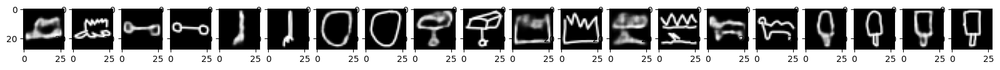

['cat', 'dumbbell', 'broom', 'circle', 'umbrella', 'sailboat', 'campfire', 'camel', 'popsicle', 'popsicle']
['square', 'key', 'lightning', 'hexagon', 'bird', 'camel', 'tree', 'rain', 'flip flops', 'hot air balloon']
['ant', 'bridge', 'chandelier', 'light bulb', 'mailbox', 'square', 'bird', 'dolphin', 'hot air balloon', 'wine glass']
['campfire', 'dumbbell', 'broom', 'circle', 'mailbox', 'crown', 'mountain', 'camel', 'popsicle', 'popsicle']


<Figure size 640x480 with 0 Axes>

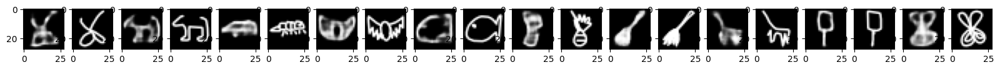

['scissors', 'bicycle', 'elephant', 'bat', 'fish', 'cactus', 'broom', 'giraffe', 'popsicle', 'scissors']
['chandelier', 'square', 'bat', 'cat', 'baseball', 'square', 'scissors', 'broom', 'wine glass', 'campfire']
['square', 'line', 'fork', 'elephant', 'flip flops', 'bear', 'square', 'chandelier', 'mailbox', 'square']
['scissors', 'bear', 'ant', 'bat', 'fish', 'pineapple', 'broom', 'giraffe', 'popsicle', 'scissors']


<Figure size 640x480 with 0 Axes>

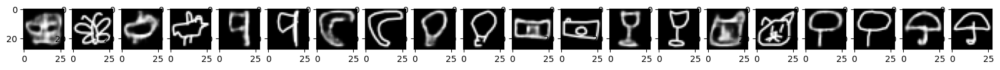

['butterfly', 'stethoscope', 'axe', 'boomerang', 'hot air balloon', 'camera', 'wine glass', 'cat', 'mushroom', 'umbrella']
['bat', 'bat', 'mailbox', 'bird', 'light bulb', 'barn', 'hourglass', 'bear', 'mailbox', 'mushroom']
['bird', 'bear', 'square', 'square', 'popsicle', 'book', 'bear', 'camera', 'light bulb', 'bird']
['butterfly', 'bird', 'axe', 'boomerang', 'hot air balloon', 'camera', 'wine glass', 'cat', 'mushroom', 'umbrella']


<Figure size 640x480 with 0 Axes>

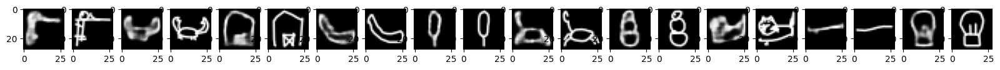

['mailbox', 'crab', 'barn', 'banana', 'popsicle', 'giraffe', 'snowman', 'cat', 'line', 'hot air balloon']
['barn', 'square', 'elephant', 'megaphone', 'square', 'chair', 'fire hydrant', 'chair', 'ocean', 'light bulb']
['bridge', 'smiley face', 'square', 'hedgehog', 'cactus', 'hedgehog', 'hot air balloon', 'bear', 'rain', 'fire hydrant']
['barn', 'crab', 'barn', 'boomerang', 'popsicle', 'crab', 'snowman', 'cat', 'line', 'light bulb']


<Figure size 640x480 with 0 Axes>

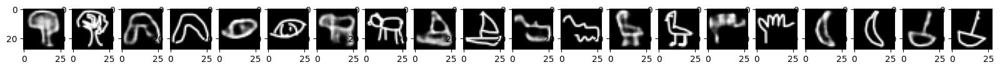

['tree', 'boomerang', 'eye', 'zebra', 'megaphone', 'camel', 'giraffe', 'hand', 'banana', 'chandelier']
['fire hydrant', 'square', 'chandelier', 'mailbox', 'boomerang', 'giraffe', 'chair', 'ant', 'boomerang', 'broom']
['hot air balloon', 'barn', 'bridge', 'camel', 'square', 'rain', 'bird', 'fork', 'square', 'megaphone']
['tree', 'boomerang', 'eye', 'bear', 'sailboat', 'camel', 'zebra', 'hand', 'banana', 'sailboat']


<Figure size 640x480 with 0 Axes>

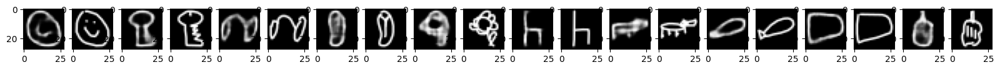

['smiley face', 'hot air balloon', 'flip flops', 'flip flops', 'flower', 'chair', 'bed', 'baseball bat', 'circle', 'cello']
['square', 'fire hydrant', 'ant', 'fire hydrant', 'bird', 'giraffe', 'ant', 'dolphin', 'square', 'square']
['baseball', 'light bulb', 'mailbox', 'key', 'fork', 'square', 'cat', 'fish', 'ant', 'alarm clock']
['smiley face', 'key', 'dumbbell', 'flip flops', 'flower', 'chair', 'crocodile', 'baseball bat', 'square', 'cello']


<Figure size 640x480 with 0 Axes>

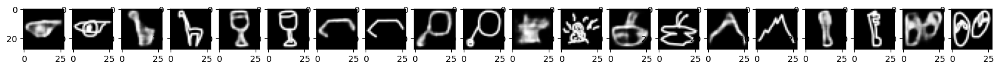

['eye', 'giraffe', 'wine glass', 'hexagon', 'hedgehog', 'campfire', 'chandelier', 'mountain', 'asparagus', 'flip flops']
['chandelier', 'cello', 'square', 'square', 'baseball bat', 'stethoscope', 'bat', 'square', 'key', 'rain']
['ant', 'square', 'hot air balloon', 'bird', 'dolphin', 'chandelier', 'square', 'boomerang', 'fork', 'book']
['eye', 'giraffe', 'wine glass', 'hexagon', 'stethoscope', 'alarm clock', 'butterfly', 'mountain', 'key', 'flip flops']


<Figure size 640x480 with 0 Axes>

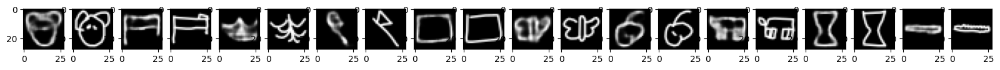

['alarm clock', 'bed', 'chandelier', 'hedgehog', 'circle', 'butterfly', 'apple', 'bear', 'hourglass', 'crocodile']
['bear', 'hot tub', 'light bulb', 'ant', 'square', 'chandelier', 'square', 'elephant', 'bear', 'baseball bat']
['ant', 'bridge', 'bat', 'lightning', 'bed', 'cactus', 'alarm clock', 'ant', 'anvil', 'bat']
['bear', 'bed', 'chandelier', 'axe', 'square', 'butterfly', 'apple', 'elephant', 'hourglass', 'crocodile']


<Figure size 640x480 with 0 Axes>

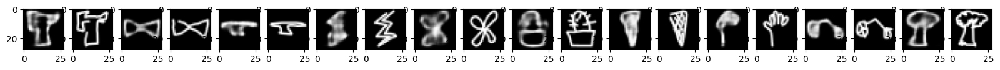

['hammer', 'bowtie', 'anvil', 'lightning', 'scissors', 'cactus', 'asparagus', 'hand', 'bicycle', 'tree']
['tree', 'bridge', 'baseball', 'square', 'butterfly', 'snowman', 'square', 'ant', 'fire hydrant', 'mushroom']
['bear', 'ant', 'bear', 'campfire', 'campfire', 'hot tub', 'scissors', 'umbrella', 'bear', 'fire hydrant']
['hammer', 'bowtie', 'anvil', 'lightning', 'scissors', 'cactus', 'ice cream', 'hand', 'bicycle', 'tree']


<Figure size 640x480 with 0 Axes>

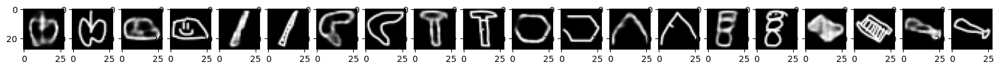

['butterfly', 'smiley face', 'asparagus', 'boomerang', 'hammer', 'hexagon', 'mountain', 'snowman', 'bird', 'baseball bat']
['apple', 'circle', 'cello', 'lightning', 'wine glass', 'smiley face', 'boomerang', 'hourglass', 'zebra', 'dolphin']
['chandelier', 'ant', 'baseball bat', 'rain', 'umbrella', 'square', 'square', 'square', 'calculator', 'ant']
['apple', 'smiley face', 'asparagus', 'boomerang', 'hammer', 'hexagon', 'mountain', 'snowman', 'ladder', 'baseball bat']


<Figure size 640x480 with 0 Axes>

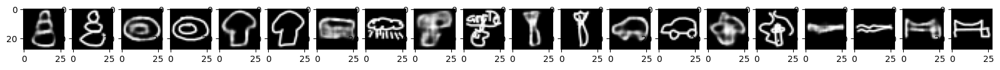

['snowman', 'donut', 'mushroom', 'rain', 'rain', 'asparagus', 'car', 'umbrella', 'ocean', 'dumbbell']
['hot air balloon', 'smiley face', 'fire hydrant', 'elephant', 'bird', 'scissors', 'bat', 'light bulb', 'crocodile', 'ant']
['square', 'eye', 'light bulb', 'ant', 'flower', 'fork', 'fire hydrant', 'mailbox', 'bridge', 'megaphone']
['snowman', 'donut', 'mushroom', 'rain', 'apple', 'asparagus', 'car', 'fire hydrant', 'ocean', 'bridge']


<Figure size 640x480 with 0 Axes>

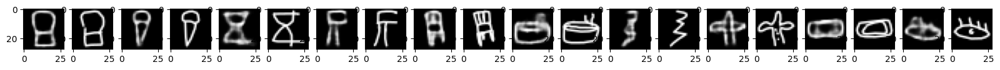

['hot air balloon', 'ice cream', 'hourglass', 'mailbox', 'chair', 'hot tub', 'lightning', 'cactus', 'donut', 'eye']
['hourglass', 'hot air balloon', 'bear', 'mushroom', 'cactus', 'bed', 'square', 'airplane', 'hot tub', 'square']
['chair', 'key', 'ant', 'hammer', 'square', 'ant', 'snowman', 'fire hydrant', 'bridge', 'cat']
['hot air balloon', 'ice cream', 'hourglass', 'mailbox', 'chair', 'hot tub', 'lightning', 'cactus', 'hot tub', 'eye']


<Figure size 640x480 with 0 Axes>

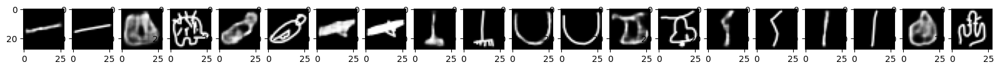

['line', 'line', 'cat', 'wine glass', 'broom', 'hedgehog', 'fire hydrant', 'lightning', 'line', 'fish']
['lightning', 'square', 'hot air balloon', 'asparagus', 'chandelier', 'smiley face', 'square', 'fork', 'broom', 'bird']
['ocean', 'hot air balloon', 'bird', 'stethoscope', 'square', 'banana', 'hourglass', 'square', 'lightning', 'square']
['line', 'hedgehog', 'bird', 'dumbbell', 'broom', 'stethoscope', 'dumbbell', 'lightning', 'line', 'cactus']


<Figure size 640x480 with 0 Axes>

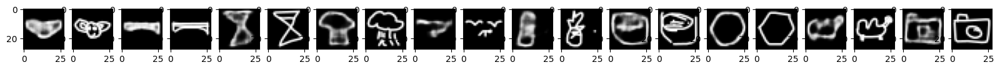

['alarm clock', 'bridge', 'hourglass', 'rain', 'ocean', 'bear', 'hot tub', 'hexagon', 'camel', 'camera']
['baseball', 'bed', 'bear', 'tree', 'bird', 'cello', 'calculator', 'circle', 'sailboat', 'barn']
['bear', 'ant', 'lightning', 'mushroom', 'camel', 'snowman', 'alarm clock', 'smiley face', 'square', 'square']
['bear', 'bridge', 'hourglass', 'rain', 'bird', 'pineapple', 'hot tub', 'hexagon', 'camel', 'camera']


<Figure size 640x480 with 0 Axes>

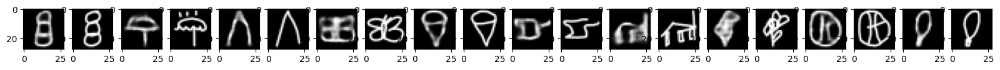

['snowman', 'mailbox', 'mountain', 'butterfly', 'ice cream', 'anvil', 'elephant', 'flower', 'baseball', 'baseball bat']
['hot air balloon', 'light bulb', 'fire hydrant', 'chandelier', 'hot air balloon', 'hexagon', 'hot air balloon', 'ice cream', 'flip flops', 'light bulb']
['fire hydrant', 'umbrella', 'square', 'book', 'light bulb', 'square', 'ant', 'cello', 'barn', 'popsicle']
['snowman', 'umbrella', 'mountain', 'butterfly', 'ice cream', 'anvil', 'chair', 'flower', 'baseball', 'baseball bat']


<Figure size 640x480 with 0 Axes>

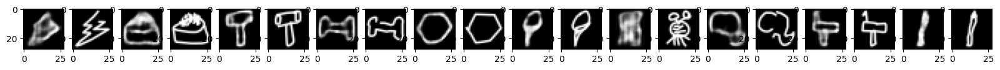

['lightning', 'hot tub', 'hammer', 'dumbbell', 'hexagon', 'popsicle', 'alarm clock', 'hedgehog', 'mailbox', 'asparagus']
['umbrella', 'sailboat', 'mailbox', 'ant', 'circle', 'tree', 'ladder', 'octopus', 'chandelier', 'fork']
['square', 'alarm clock', 'tree', 'bowtie', 'smiley face', 'ice cream', 'campfire', 'elephant', 'axe', 'ladder']
['lightning', 'hot tub', 'hammer', 'dumbbell', 'hexagon', 'ice cream', 'alarm clock', 'elephant', 'mailbox', 'asparagus']


<Figure size 640x480 with 0 Axes>

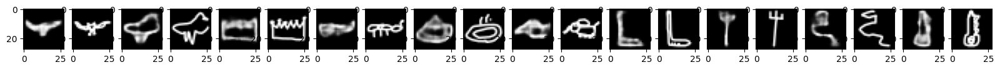

['light bulb', 'bat', 'sailboat', 'ant', 'hot tub', 'light bulb', 'broom', 'fork', 'lightning', 'key']
['chandelier', 'bird', 'hot tub', 'crocodile', 'chandelier', 'fish', 'giraffe', 'asparagus', 'square', 'square']
['ant', 'ant', 'camel', 'fire hydrant', 'eye', 'calculator', 'chandelier', 'axe', 'mailbox', 'scissors']
['bat', 'bird', 'crown', 'ant', 'hot tub', 'elephant', 'bat', 'fork', 'anvil', 'key']


<Figure size 640x480 with 0 Axes>

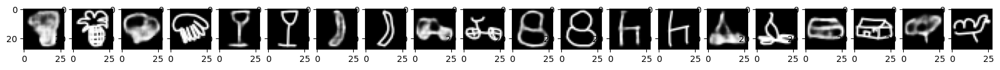

['pineapple', 'tree', 'wine glass', 'banana', 'bicycle', 'snowman', 'chair', 'campfire', 'barn', 'camel']
['bird', 'hot air balloon', 'hourglass', 'book', 'car', 'hot air balloon', 'square', 'octopus', 'hot tub', 'bird']
['umbrella', 'calculator', 'bear', 'key', 'cactus', 'bird', 'fire hydrant', 'chandelier', 'car', 'hedgehog']
['pineapple', 'octopus', 'wine glass', 'banana', 'bicycle', 'snowman', 'chair', 'campfire', 'barn', 'camel']


<Figure size 640x480 with 0 Axes>

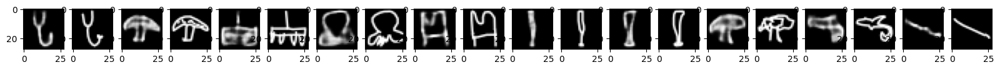

['hedgehog', 'umbrella', 'chandelier', 'octopus', 'chair', 'asparagus', 'baseball bat', 'mushroom', 'key', 'line']
['square', 'mushroom', 'bicycle', 'square', 'cactus', 'baseball bat', 'wine glass', 'tree', 'scissors', 'ocean']
['lightning', 'hammer', 'square', 'hot air balloon', 'camel', 'popsicle', 'key', 'mailbox', 'hammer', 'bird']
['stethoscope', 'mushroom', 'chandelier', 'octopus', 'camel', 'baseball bat', 'baseball bat', 'tree', 'dolphin', 'line']


<Figure size 640x480 with 0 Axes>

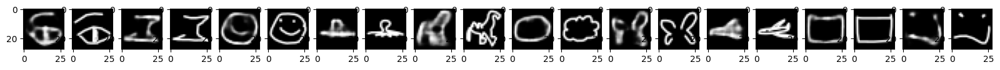

['eye', 'hourglass', 'smiley face', 'octopus', 'zebra', 'cloud', 'fork', 'airplane', 'circle', 'smiley face']
['barn', 'anvil', 'circle', 'megaphone', 'giraffe', 'circle', 'ant', 'umbrella', 'square', 'square']
['chandelier', 'fire hydrant', 'hexagon', 'fire hydrant', 'ant', 'smiley face', 'fish', 'megaphone', 'bed', 'hedgehog']
['eye', 'hourglass', 'smiley face', 'octopus', 'camel', 'cloud', 'butterfly', 'airplane', 'square', 'smiley face']


<Figure size 640x480 with 0 Axes>

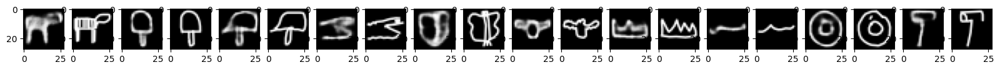

['zebra', 'popsicle', 'mushroom', 'anvil', 'butterfly', 'bat', 'sailboat', 'ocean', 'donut', 'mailbox']
['bear', 'mushroom', 'umbrella', 'hot tub', 'book', 'bird', 'hot tub', 'bridge', 'smiley face', 'hammer']
['alarm clock', 'light bulb', 'mailbox', 'ocean', 'chandelier', 'butterfly', 'square', 'bird', 'eye', 'axe']
['zebra', 'popsicle', 'mushroom', 'crocodile', 'butterfly', 'bat', 'crown', 'ocean', 'donut', 'mailbox']


<Figure size 640x480 with 0 Axes>

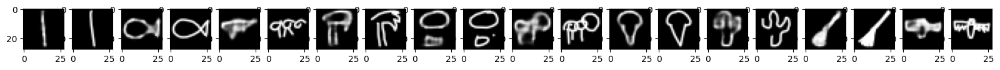

['line', 'fish', 'octopus', 'mailbox', 'hot air balloon', 'zebra', 'ice cream', 'cactus', 'broom', 'bat']
['broom', 'ant', 'bridge', 'hammer', 'hedgehog', 'bear', 'light bulb', 'fork', 'scissors', 'bear']
['asparagus', 'flip flops', 'fire hydrant', 'axe', 'snowman', 'cello', 'hot air balloon', 'hand', 'key', 'hot air balloon']
['bridge', 'fish', 'ant', 'axe', 'circle', 'ant', 'ice cream', 'cactus', 'broom', 'bat']


<Figure size 640x480 with 0 Axes>

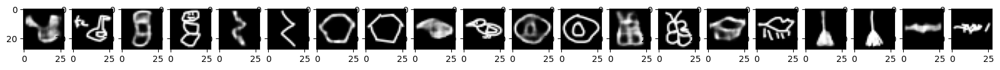

['crab', 'snowman', 'lightning', 'hexagon', 'eye', 'smiley face', 'butterfly', 'barn', 'broom', 'ocean']
['boomerang', 'key', 'square', 'alarm clock', 'bird', 'donut', 'cello', 'bridge', 'scissors', 'bat']
['bird', 'square', 'ladder', 'square', 'elephant', 'eye', 'scissors', 'elephant', 'chandelier', 'bridge']
['key', 'snowman', 'lightning', 'hexagon', 'bird', 'donut', 'butterfly', 'rain', 'broom', 'ant']


<Figure size 640x480 with 0 Axes>

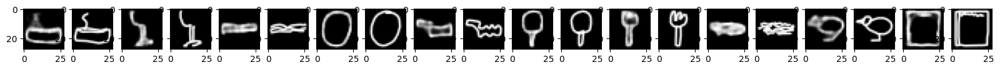

['hot tub', 'wine glass', 'bat', 'circle', 'camel', 'popsicle', 'fork', 'fire hydrant', 'bird', 'book']
['megaphone', 'chandelier', 'cloud', 'hexagon', 'bowtie', 'hot air balloon', 'mailbox', 'wine glass', 'dolphin', 'circle']
['snowman', 'square', 'ant', 'smiley face', 'line', 'light bulb', 'axe', 'ocean', 'boomerang', 'calculator']
['hot tub', 'wine glass', 'ocean', 'circle', 'camel', 'popsicle', 'fork', 'dolphin', 'bird', 'book']


<Figure size 640x480 with 0 Axes>

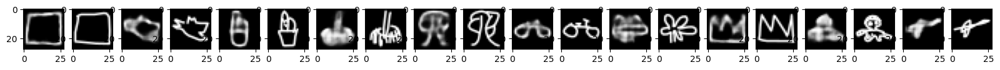

['circle', 'cloud', 'cactus', 'chandelier', 'tree', 'bicycle', 'smiley face', 'sailboat', 'octopus', 'hexagon']
['square', 'bird', 'square', 'bicycle', 'rain', 'square', 'cactus', 'camel', 'crab', 'baseball']
['ant', 'hammer', 'alarm clock', 'mailbox', 'bird', 'flip flops', 'octopus', 'square', 'fire hydrant', 'cat']
['square', 'bat', 'cactus', 'chandelier', 'tree', 'bicycle', 'hand', 'crown', 'asparagus', 'dumbbell']


<Figure size 640x480 with 0 Axes>

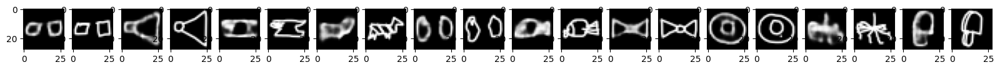

['square', 'ant', 'anvil', 'zebra', 'flip flops', 'crab', 'bowtie', 'donut', 'chandelier', 'axe']
['elephant', 'megaphone', 'airplane', 'bicycle', 'fire hydrant', 'fish', 'bridge', 'smiley face', 'square', 'flip flops']
['bowtie', 'bowtie', 'crab', 'cat', 'dumbbell', 'flip flops', 'fire hydrant', 'square', 'bridge', 'light bulb']
['square', 'bowtie', 'anvil', 'zebra', 'flip flops', 'fish', 'bowtie', 'donut', 'chandelier', 'popsicle']


<Figure size 640x480 with 0 Axes>

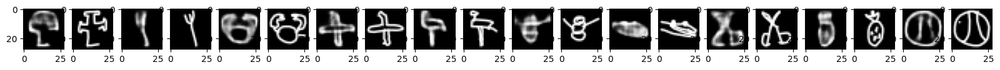

['fire hydrant', 'fork', 'crab', 'airplane', 'mailbox', 'light bulb', 'crocodile', 'scissors', 'pineapple', 'baseball']
['cactus', 'hedgehog', 'baseball', 'bat', 'axe', 'alarm clock', 'megaphone', 'bicycle', 'bear', 'flip flops']
['hand', 'lightning', 'square', 'mailbox', 'hammer', 'pineapple', 'donut', 'bear', 'square', 'smiley face']
['fire hydrant', 'fork', 'crab', 'airplane', 'mailbox', 'snowman', 'crocodile', 'scissors', 'pineapple', 'baseball']


<Figure size 640x480 with 0 Axes>

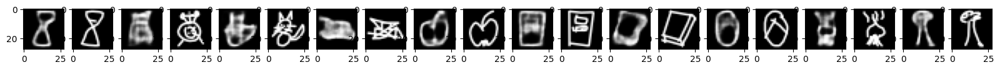

['hourglass', 'alarm clock', 'bear', 'cat', 'apple', 'calculator', 'book', 'flip flops', 'campfire', 'tree']
['hot air balloon', 'bear', 'cat', 'square', 'butterfly', 'hot air balloon', 'banana', 'baseball', 'light bulb', 'hammer']
['bear', 'pineapple', 'stethoscope', 'ant', 'square', 'hourglass', 'dolphin', 'square', 'square', 'fire hydrant']
['hourglass', 'alarm clock', 'cat', 'alarm clock', 'apple', 'calculator', 'book', 'flip flops', 'campfire', 'tree']


<Figure size 640x480 with 0 Axes>

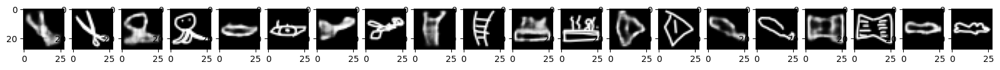

['scissors', 'octopus', 'eye', 'scissors', 'ladder', 'hot tub', 'apple', 'baseball bat', 'book', 'bat']
['fire hydrant', 'campfire', 'bridge', 'bridge', 'cat', 'sailboat', 'bird', 'banana', 'ant', 'cloud']
['chandelier', 'ant', 'megaphone', 'dumbbell', 'bear', 'cat', 'boomerang', 'elephant', 'bed', 'dolphin']
['scissors', 'octopus', 'eye', 'bird', 'ladder', 'hot tub', 'flip flops', 'baseball bat', 'book', 'dolphin']


<Figure size 640x480 with 0 Axes>

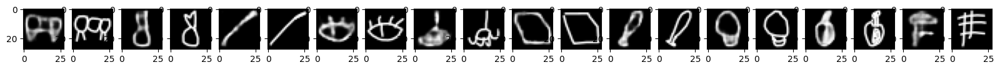

['ant', 'bear', 'line', 'eye', 'chandelier', 'square', 'baseball bat', 'light bulb', 'cello', 'lightning']
['fork', 'pineapple', 'asparagus', 'stethoscope', 'square', 'hexagon', 'square', 'hot air balloon', 'butterfly', 'ladder']
['bridge', 'snowman', 'broom', 'cat', 'broom', 'circle', 'asparagus', 'flip flops', 'pineapple', 'light bulb']
['ant', 'pineapple', 'asparagus', 'eye', 'chandelier', 'hexagon', 'baseball bat', 'hot air balloon', 'cello', 'ladder']


<Figure size 640x480 with 0 Axes>

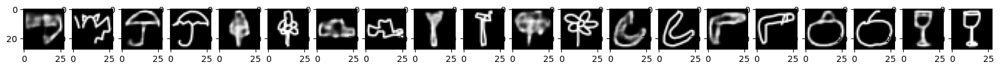

['hand', 'umbrella', 'flower', 'car', 'fork', 'flower', 'bird', 'boomerang', 'apple', 'wine glass']
['fork', 'mushroom', 'popsicle', 'bat', 'hammer', 'rain', 'square', 'mailbox', 'snowman', 'hourglass']
['camel', 'hammer', 'tree', 'calculator', 'axe', 'tree', 'megaphone', 'ant', 'square', 'bear']
['bat', 'umbrella', 'flower', 'car', 'mailbox', 'flower', 'boomerang', 'boomerang', 'apple', 'wine glass']


<Figure size 640x480 with 0 Axes>

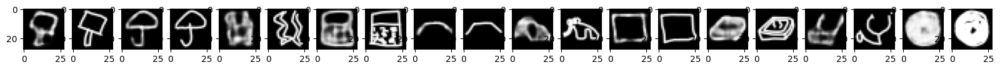

['tree', 'umbrella', 'alarm clock', 'calculator', 'bridge', 'elephant', 'circle', 'hot tub', 'hedgehog', 'stethoscope']
['rain', 'mushroom', 'bird', 'crocodile', 'square', 'bear', 'square', 'alarm clock', 'key', 'popsicle']
['ant', 'bird', 'square', 'square', 'mountain', 'fork', 'ant', 'donut', 'square', 'asparagus']
['hammer', 'umbrella', 'lightning', 'calculator', 'hexagon', 'elephant', 'square', 'hot tub', 'stethoscope', 'asparagus']
Accuracy on val dataset: 65.93333333333334 %
Accuracy on val dataset within 2 guesses: 74.95 %
Accuracy on val dataset within 3 guesses: 78.25 %


In [23]:
val_loader = torch.load('/content/drive/MyDrive/APS360/Project/Data/ValLoader_6')
VisualizeNew4(vae_wild, val_loader, 'val')

<ipython-input-5-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


<Figure size 640x480 with 0 Axes>

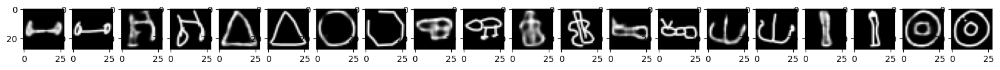

['dumbbell', 'square', 'mountain', 'hexagon', 'bird', 'cello', 'sailboat', 'chandelier', 'asparagus', 'donut']
['bridge', 'line', 'square', 'circle', 'anvil', 'square', 'fire hydrant', 'hedgehog', 'fork', 'smiley face']
['hedgehog', 'butterfly', 'fire hydrant', 'square', 'tree', 'scissors', 'ocean', 'broom', 'key', 'eye']
['dumbbell', 'bicycle', 'mountain', 'hexagon', 'bird', 'cello', 'ant', 'chandelier', 'asparagus', 'donut']


<Figure size 640x480 with 0 Axes>

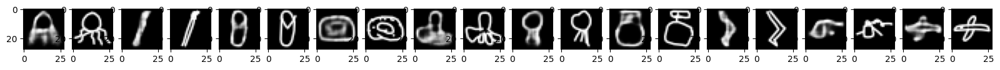

['octopus', 'asparagus', 'flip flops', 'donut', 'octopus', 'hot air balloon', 'apple', 'lightning', 'barn', 'airplane']
['crab', 'baseball bat', 'fire hydrant', 'camera', 'car', 'tree', 'square', 'banana', 'elephant', 'crocodile']
['fire hydrant', 'giraffe', 'cactus', 'hot tub', 'campfire', 'octopus', 'alarm clock', 'square', 'hexagon', 'car']
['octopus', 'asparagus', 'flip flops', 'donut', 'octopus', 'hot air balloon', 'alarm clock', 'lightning', 'fire hydrant', 'airplane']


<Figure size 640x480 with 0 Axes>

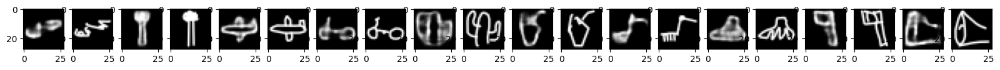

['key', 'asparagus', 'airplane', 'bicycle', 'cactus', 'bowtie', 'giraffe', 'octopus', 'axe', 'square']
['fish', 'tree', 'bat', 'elephant', 'ant', 'apple', 'key', 'chandelier', 'hammer', 'baseball']
['smiley face', 'fork', 'dolphin', 'dolphin', 'flip flops', 'butterfly', 'square', 'square', 'mailbox', 'fork']
['chandelier', 'asparagus', 'airplane', 'bicycle', 'cactus', 'apple', 'giraffe', 'octopus', 'axe', 'megaphone']


<Figure size 640x480 with 0 Axes>

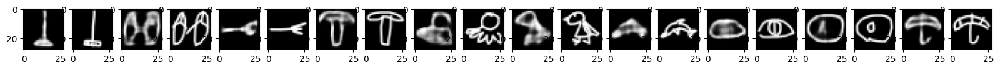

['broom', 'flip flops', 'giraffe', 'hammer', 'octopus', 'bird', 'dolphin', 'eye', 'smiley face', 'umbrella']
['chandelier', 'hourglass', 'fire hydrant', 'fire hydrant', 'square', 'umbrella', 'bridge', 'bird', 'donut', 'hammer']
['baseball bat', 'dumbbell', 'hot air balloon', 'mushroom', 'chair', 'key', 'bat', 'chandelier', 'ant', 'mushroom']
['broom', 'flip flops', 'fork', 'hammer', 'octopus', 'bird', 'dolphin', 'eye', 'donut', 'umbrella']


<Figure size 640x480 with 0 Axes>

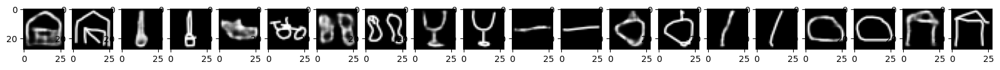

['barn', 'key', 'chandelier', 'flip flops', 'wine glass', 'line', 'apple', 'line', 'circle', 'fire hydrant']
['elephant', 'cello', 'hand', 'fire hydrant', 'hedgehog', 'square', 'square', 'broom', 'hexagon', 'mountain']
['rain', 'broom', 'square', 'tree', 'square', 'rain', 'chandelier', 'lightning', 'square', 'square']
['barn', 'broom', 'bicycle', 'flip flops', 'wine glass', 'line', 'apple', 'boomerang', 'circle', 'barn']


<Figure size 640x480 with 0 Axes>

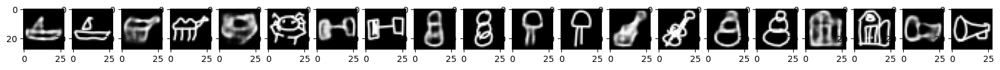

['megaphone', 'camel', 'crab', 'dumbbell', 'snowman', 'tree', 'cello', 'snowman', 'barn', 'ant']
['hot tub', 'ant', 'ant', 'flip flops', 'hot air balloon', 'mushroom', 'scissors', 'square', 'square', 'megaphone']
['key', 'hedgehog', 'stethoscope', 'fork', 'key', 'popsicle', 'square', 'alarm clock', 'elephant', 'bear']
['sailboat', 'camel', 'crab', 'dumbbell', 'snowman', 'mailbox', 'cello', 'snowman', 'barn', 'megaphone']


<Figure size 640x480 with 0 Axes>

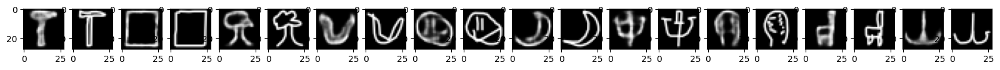

['hammer', 'circle', 'tree', 'boomerang', 'smiley face', 'banana', 'butterfly', 'cactus', 'giraffe', 'chandelier']
['tree', 'square', 'mushroom', 'hedgehog', 'baseball', 'boomerang', 'chandelier', 'fire hydrant', 'chair', 'broom']
['axe', 'book', 'fire hydrant', 'bat', 'hot air balloon', 'megaphone', 'cactus', 'flip flops', 'square', 'square']
['hammer', 'square', 'tree', 'boomerang', 'smiley face', 'banana', 'chandelier', 'cactus', 'chair', 'chandelier']


<Figure size 640x480 with 0 Axes>

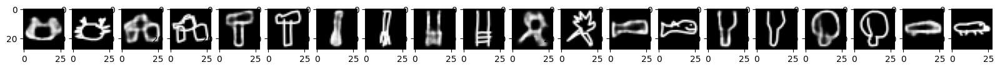

['cat', 'crab', 'hammer', 'broom', 'ladder', 'campfire', 'bed', 'hedgehog', 'light bulb', 'crocodile']
['crab', 'elephant', 'mailbox', 'key', 'chair', 'bear', 'fish', 'fork', 'popsicle', 'fire hydrant']
['square', 'tree', 'axe', 'scissors', 'square', 'scissors', 'ant', 'wine glass', 'hot air balloon', 'bed']
['crab', 'axe', 'hammer', 'broom', 'ladder', 'campfire', 'dolphin', 'fork', 'light bulb', 'crocodile']


<Figure size 640x480 with 0 Axes>

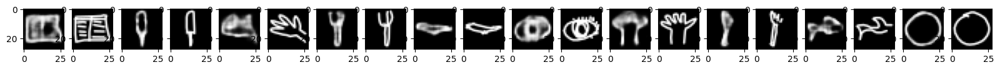

['book', 'popsicle', 'hand', 'fork', 'crocodile', 'eye', 'hand', 'fork', 'bowtie', 'circle']
['barn', 'lightning', 'megaphone', 'axe', 'bat', 'ant', 'bear', 'asparagus', 'dolphin', 'hexagon']
['hot tub', 'square', 'asparagus', 'asparagus', 'bird', 'bear', 'cactus', 'axe', 'axe', 'smiley face']
['book', 'popsicle', 'hand', 'fork', 'crocodile', 'eye', 'hand', 'asparagus', 'dolphin', 'circle']


<Figure size 640x480 with 0 Axes>

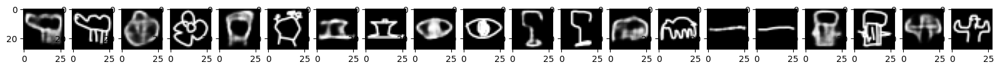

['camel', 'baseball', 'alarm clock', 'anvil', 'eye', 'wine glass', 'elephant', 'line', 'fire hydrant', 'cactus']
['bear', 'flower', 'bear', 'megaphone', 'chandelier', 'hourglass', 'barn', 'square', 'calculator', 'fork']
['rain', 'flip flops', 'bird', 'bridge', 'light bulb', 'square', 'hot tub', 'bridge', 'hot air balloon', 'fire hydrant']
['camel', 'flower', 'alarm clock', 'anvil', 'eye', 'wine glass', 'elephant', 'line', 'fire hydrant', 'cactus']


<Figure size 640x480 with 0 Axes>

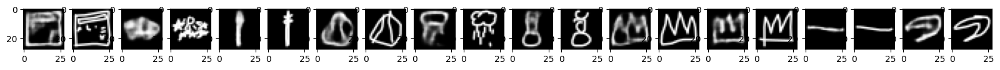

['calculator', 'campfire', 'asparagus', 'baseball', 'rain', 'snowman', 'sailboat', 'sailboat', 'line', 'boomerang']
['hot tub', 'octopus', 'fork', 'fork', 'tree', 'hourglass', 'cactus', 'camel', 'ocean', 'lightning']
['book', 'bat', 'axe', 'square', 'bear', 'cactus', 'camel', 'square', 'rain', 'bird']
['calculator', 'fire hydrant', 'asparagus', 'baseball', 'rain', 'snowman', 'crown', 'crown', 'line', 'boomerang']


<Figure size 640x480 with 0 Axes>

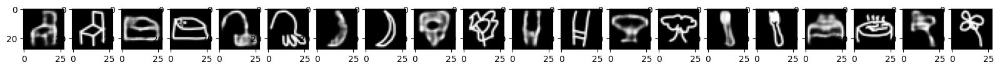

['chair', 'hot tub', 'octopus', 'banana', 'flower', 'ladder', 'tree', 'asparagus', 'hot tub', 'mailbox']
['giraffe', 'bed', 'key', 'book', 'bird', 'chair', 'rain', 'fork', 'bridge', 'flower']
['bed', 'barn', 'giraffe', 'key', 'bear', 'hedgehog', 'bird', 'hammer', 'bed', 'ant']
['chair', 'hot tub', 'octopus', 'banana', 'flower', 'ladder', 'tree', 'fork', 'hot tub', 'flower']


<Figure size 640x480 with 0 Axes>

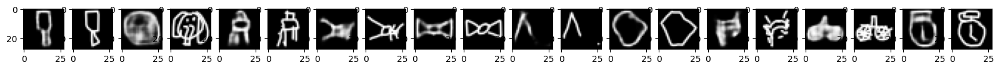

['wine glass', 'elephant', 'fire hydrant', 'crocodile', 'bowtie', 'mountain', 'hexagon', 'lightning', 'bicycle', 'alarm clock']
['popsicle', 'square', 'octopus', 'square', 'bridge', 'line', 'circle', 'cat', 'chandelier', 'square']
['square', 'ant', 'chair', 'fire hydrant', 'ant', 'asparagus', 'cloud', 'ant', 'fish', 'calculator']
['popsicle', 'elephant', 'chair', 'ant', 'bowtie', 'mountain', 'hexagon', 'dolphin', 'bicycle', 'alarm clock']


<Figure size 640x480 with 0 Axes>

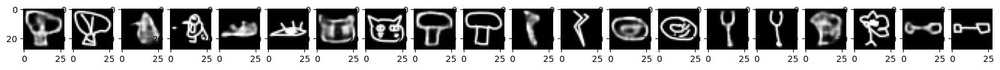

['square', 'square', 'hot tub', 'cat', 'mushroom', 'lightning', 'donut', 'hedgehog', 'flower', 'dumbbell']
['tree', 'asparagus', 'bridge', 'ant', 'hot air balloon', 'axe', 'smiley face', 'wine glass', 'bird', 'key']
['light bulb', 'light bulb', 'megaphone', 'bear', 'light bulb', 'mailbox', 'eye', 'fork', 'scissors', 'bridge']
['hot air balloon', 'bird', 'eye', 'cat', 'mushroom', 'lightning', 'donut', 'stethoscope', 'flower', 'dumbbell']


<Figure size 640x480 with 0 Axes>

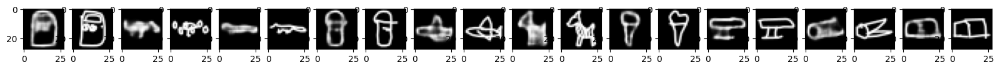

['calculator', 'popsicle', 'ocean', 'fire hydrant', 'airplane', 'zebra', 'ice cream', 'anvil', 'ant', 'book']
['square', 'fire hydrant', 'crocodile', 'mushroom', 'chandelier', 'cello', 'mailbox', 'mushroom', 'flip flops', 'barn']
['fire hydrant', 'ocean', 'ant', 'hot air balloon', 'bat', 'square', 'tree', 'hot tub', 'hot air balloon', 'circle']
['calculator', 'rain', 'crocodile', 'mailbox', 'airplane', 'zebra', 'ice cream', 'anvil', 'bowtie', 'barn']


<Figure size 640x480 with 0 Axes>

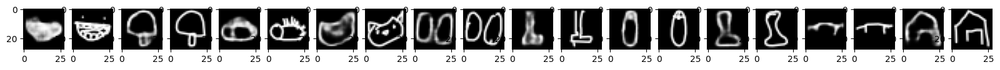

['fire hydrant', 'popsicle', 'stethoscope', 'cat', 'flip flops', 'broom', 'flip flops', 'hourglass', 'bridge', 'barn']
['sailboat', 'mushroom', 'eye', 'bear', 'square', 'chandelier', 'square', 'hot air balloon', 'anvil', 'elephant']
['hot air balloon', 'light bulb', 'square', 'ant', 'book', 'giraffe', 'fire hydrant', 'square', 'bear', 'bridge']
['smiley face', 'popsicle', 'hedgehog', 'cat', 'flip flops', 'broom', 'flip flops', 'hourglass', 'bridge', 'barn']


<Figure size 640x480 with 0 Axes>

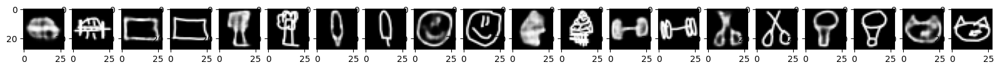

['bridge', 'circle', 'tree', 'popsicle', 'smiley face', 'campfire', 'dumbbell', 'scissors', 'hot air balloon', 'bear']
['hot tub', 'bed', 'fire hydrant', 'square', 'square', 'baseball', 'bridge', 'chandelier', 'light bulb', 'cat']
['asparagus', 'square', 'hammer', 'hedgehog', 'ant', 'barn', 'key', 'bear', 'snowman', 'alarm clock']
['bridge', 'square', 'tree', 'popsicle', 'smiley face', 'ice cream', 'dumbbell', 'scissors', 'hot air balloon', 'cat']


<Figure size 640x480 with 0 Axes>

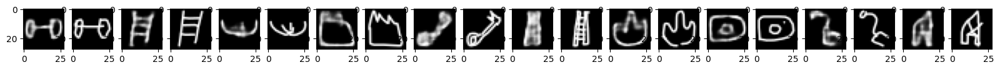

['dumbbell', 'ladder', 'chandelier', 'sailboat', 'giraffe', 'asparagus', 'cactus', 'camera', 'giraffe', 'campfire']
['flip flops', 'alarm clock', 'hedgehog', 'camel', 'key', 'bear', 'sailboat', 'square', 'hourglass', 'square']
['key', 'bear', 'bat', 'hot tub', 'square', 'square', 'hand', 'circle', 'bird', 'alarm clock']
['dumbbell', 'ladder', 'chandelier', 'crown', 'key', 'ladder', 'cactus', 'camera', 'stethoscope', 'barn']


<Figure size 640x480 with 0 Axes>

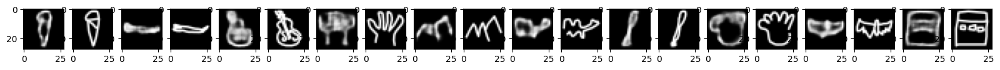

['ice cream', 'crocodile', 'cello', 'hand', 'mountain', 'camel', 'baseball bat', 'hand', 'bat', 'calculator']
['flip flops', 'smiley face', 'scissors', 'cactus', 'asparagus', 'bat', 'asparagus', 'bear', 'chandelier', 'bed']
['axe', 'baseball bat', 'square', 'fork', 'mailbox', 'apple', 'broom', 'fork', 'octopus', 'hot tub']
['ice cream', 'crocodile', 'cello', 'hand', 'mountain', 'camel', 'baseball bat', 'hand', 'bat', 'calculator']


<Figure size 640x480 with 0 Axes>

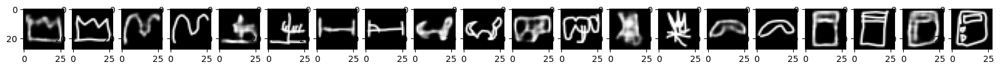

['sailboat', 'mountain', 'chandelier', 'bed', 'mailbox', 'elephant', 'campfire', 'boomerang', 'calculator', 'calculator']
['camel', 'square', 'sailboat', 'dumbbell', 'hammer', 'ant', 'square', 'bridge', 'bed', 'book']
['square', 'camel', 'fire hydrant', 'bridge', 'camel', 'bear', 'chandelier', 'square', 'square', 'mailbox']
['crown', 'mountain', 'chandelier', 'bed', 'crab', 'elephant', 'campfire', 'boomerang', 'calculator', 'calculator']


<Figure size 640x480 with 0 Axes>

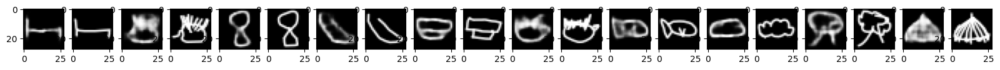

['bed', 'stethoscope', 'hourglass', 'banana', 'anvil', 'stethoscope', 'fish', 'cloud', 'tree', 'chandelier']
['chair', 'hand', 'hot air balloon', 'hot tub', 'hot tub', 'eye', 'camera', 'bear', 'rain', 'square']
['square', 'ant', 'wine glass', 'hedgehog', 'boomerang', 'bear', 'bear', 'smiley face', 'elephant', 'campfire']
['bed', 'hedgehog', 'hot air balloon', 'banana', 'anvil', 'hedgehog', 'fish', 'cloud', 'tree', 'chandelier']


<Figure size 640x480 with 0 Axes>

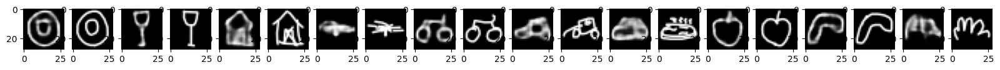

['donut', 'wine glass', 'barn', 'octopus', 'bicycle', 'square', 'hot tub', 'apple', 'boomerang', 'mountain']
['smiley face', 'hedgehog', 'fire hydrant', 'ant', 'bear', 'megaphone', 'bird', 'chandelier', 'dolphin', 'hand']
['eye', 'ant', 'square', 'smiley face', 'cloud', 'hammer', 'cat', 'hexagon', 'hexagon', 'asparagus']
['donut', 'wine glass', 'barn', 'lightning', 'bicycle', 'car', 'hot tub', 'apple', 'boomerang', 'hand']


<Figure size 640x480 with 0 Axes>

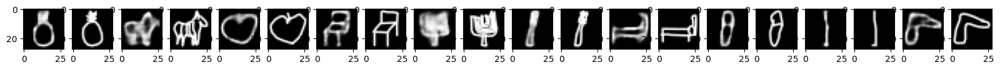

['pineapple', 'zebra', 'apple', 'chair', 'tree', 'asparagus', 'bed', 'axe', 'line', 'boomerang']
['square', 'square', 'smiley face', 'bed', 'asparagus', 'fork', 'cat', 'ice cream', 'broom', 'dolphin']
['bear', 'bear', 'sailboat', 'mailbox', 'bat', 'hammer', 'chair', 'flip flops', 'fork', 'fire hydrant']
['pineapple', 'zebra', 'apple', 'chair', 'chandelier', 'asparagus', 'bed', 'flip flops', 'broom', 'boomerang']


<Figure size 640x480 with 0 Axes>

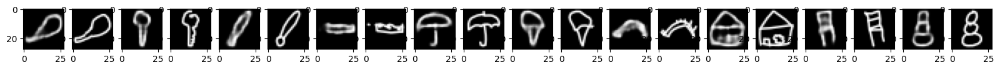

['baseball bat', 'key', 'baseball bat', 'crocodile', 'umbrella', 'ice cream', 'dolphin', 'barn', 'chair', 'snowman']
['banana', 'tree', 'ladder', 'megaphone', 'mailbox', 'tree', 'bridge', 'camera', 'ladder', 'key']
['flip flops', 'hot air balloon', 'asparagus', 'ant', 'bird', 'hot air balloon', 'crab', 'chandelier', 'calculator', 'cactus']
['baseball bat', 'key', 'baseball bat', 'hot tub', 'umbrella', 'ice cream', 'bridge', 'barn', 'chair', 'snowman']


<Figure size 640x480 with 0 Axes>

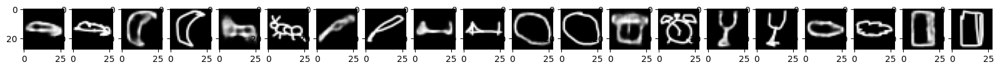

['dolphin', 'banana', 'barn', 'baseball bat', 'dumbbell', 'circle', 'alarm clock', 'wine glass', 'cloud', 'book']
['crocodile', 'fire hydrant', 'cloud', 'asparagus', 'bridge', 'hexagon', 'pineapple', 'hedgehog', 'bear', 'square']
['hammer', 'barn', 'lightning', 'ant', 'bowtie', 'square', 'hot tub', 'square', 'stethoscope', 'circle']
['dolphin', 'banana', 'ant', 'baseball bat', 'bridge', 'circle', 'alarm clock', 'wine glass', 'cloud', 'book']


<Figure size 640x480 with 0 Axes>

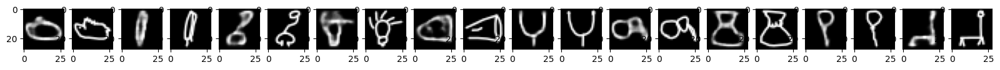

['stethoscope', 'ladder', 'hourglass', 'light bulb', 'ant', 'hedgehog', 'fish', 'hourglass', 'popsicle', 'giraffe']
['eye', 'asparagus', 'key', 'bird', 'fish', 'wine glass', 'elephant', 'bear', 'wine glass', 'chair']
['hand', 'square', 'hedgehog', 'bear', 'baseball', 'square', 'book', 'square', 'mailbox', 'square']
['hedgehog', 'popsicle', 'stethoscope', 'light bulb', 'megaphone', 'stethoscope', 'elephant', 'hourglass', 'hot air balloon', 'giraffe']


<Figure size 640x480 with 0 Axes>

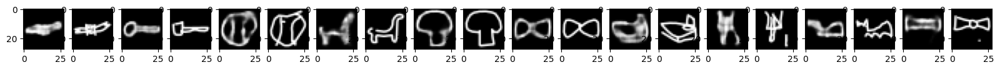

['wine glass', 'key', 'baseball', 'giraffe', 'mushroom', 'bowtie', 'bed', 'square', 'boomerang', 'ant']
['ocean', 'dumbbell', 'smiley face', 'chair', 'light bulb', 'fish', 'book', 'axe', 'camel', 'bear']
['broom', 'baseball bat', 'fire hydrant', 'donut', 'hot air balloon', 'dumbbell', 'bear', 'fork', 'hammer', 'asparagus']
['bat', 'dumbbell', 'baseball', 'giraffe', 'mushroom', 'bowtie', 'bed', 'fork', 'bat', 'bowtie']


<Figure size 640x480 with 0 Axes>

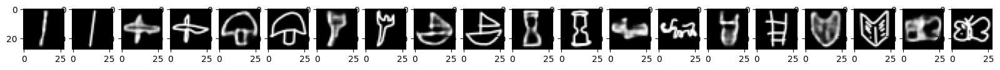

['line', 'airplane', 'mushroom', 'fork', 'megaphone', 'hourglass', 'elephant', 'cat', 'cat', 'butterfly']
['broom', 'dolphin', 'tree', 'axe', 'cactus', 'key', 'bat', 'ladder', 'bear', 'book']
['lightning', 'bat', 'umbrella', 'lightning', 'key', 'square', 'smiley face', 'alarm clock', 'alarm clock', 'chandelier']
['line', 'airplane', 'mushroom', 'fork', 'sailboat', 'hourglass', 'elephant', 'ladder', 'book', 'butterfly']


<Figure size 640x480 with 0 Axes>

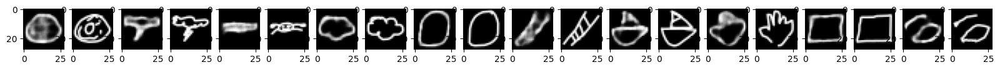

['donut', 'hammer', 'baseball', 'cloud', 'circle', 'ladder', 'megaphone', 'hand', 'circle', 'hexagon']
['smiley face', 'chandelier', 'crocodile', 'circle', 'hexagon', 'square', 'crocodile', 'bear', 'square', 'megaphone']
['bird', 'scissors', 'car', 'bear', 'square', 'lightning', 'hexagon', 'bird', 'ant', 'bird']
['donut', 'lightning', 'crab', 'cloud', 'circle', 'ladder', 'sailboat', 'hand', 'square', 'baseball bat']


<Figure size 640x480 with 0 Axes>

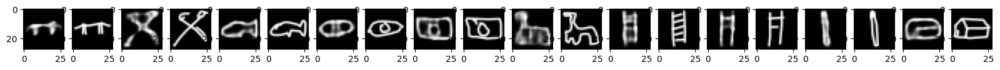

['bridge', 'scissors', 'fish', 'eye', 'camera', 'giraffe', 'ladder', 'ladder', 'asparagus', 'barn']
['chair', 'hourglass', 'dolphin', 'smiley face', 'book', 'camel', 'bear', 'axe', 'fork', 'hot tub']
['bear', 'hedgehog', 'cloud', 'bird', 'bear', 'dolphin', 'chair', 'fire hydrant', 'broom', 'bear']
['bridge', 'scissors', 'fish', 'eye', 'camera', 'giraffe', 'ladder', 'ladder', 'asparagus', 'barn']


<Figure size 640x480 with 0 Axes>

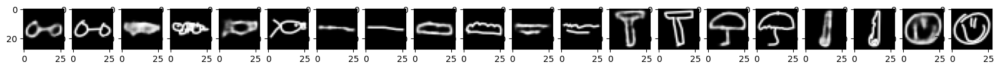

['dumbbell', 'bat', 'fish', 'line', 'cloud', 'ocean', 'hammer', 'umbrella', 'baseball bat', 'smiley face']
['key', 'baseball', 'crab', 'square', 'crocodile', 'square', 'axe', 'mushroom', 'key', 'baseball']
['bridge', 'ant', 'dolphin', 'bird', 'hot tub', 'bridge', 'wine glass', 'bird', 'broom', 'book']
['dumbbell', 'zebra', 'fish', 'line', 'cloud', 'ocean', 'hammer', 'umbrella', 'key', 'smiley face']


<Figure size 640x480 with 0 Axes>

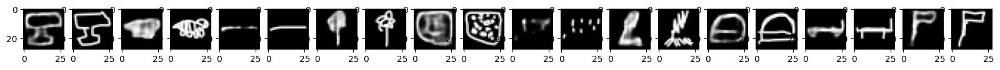

['anvil', 'zebra', 'line', 'flower', 'elephant', 'rain', 'campfire', 'alarm clock', 'key', 'axe']
['wine glass', 'camel', 'square', 'mailbox', 'square', 'mountain', 'square', 'hot tub', 'bed', 'mailbox']
['square', 'bicycle', 'bridge', 'axe', 'bear', 'square', 'scissors', 'bear', 'bicycle', 'square']
['anvil', 'zebra', 'line', 'flower', 'hot tub', 'rain', 'campfire', 'bridge', 'bed', 'axe']


<Figure size 640x480 with 0 Axes>

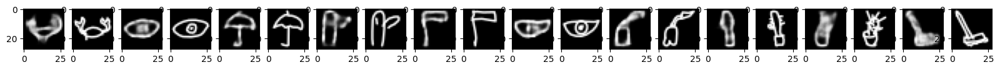

['crab', 'eye', 'umbrella', 'cactus', 'mailbox', 'eye', 'giraffe', 'cactus', 'pineapple', 'broom']
['bird', 'donut', 'mushroom', 'axe', 'axe', 'chandelier', 'bird', 'key', 'cello', 'square']
['square', 'smiley face', 'bird', 'fire hydrant', 'square', 'bird', 'boomerang', 'hot air balloon', 'cactus', 'campfire']
['crab', 'eye', 'umbrella', 'cactus', 'axe', 'eye', 'apple', 'cactus', 'cactus', 'broom']


<Figure size 640x480 with 0 Axes>

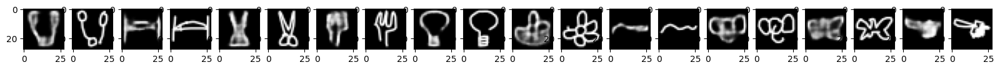

['hedgehog', 'bed', 'scissors', 'fork', 'hot air balloon', 'flower', 'bird', 'elephant', 'bat', 'umbrella']
['smiley face', 'bridge', 'square', 'hand', 'light bulb', 'car', 'ocean', 'bat', 'butterfly', 'broom']
['square', 'ant', 'bear', 'cactus', 'hedgehog', 'octopus', 'bridge', 'hot air balloon', 'ant', 'ladder']
['stethoscope', 'bridge', 'scissors', 'fork', 'light bulb', 'flower', 'ocean', 'elephant', 'bat', 'broom']


<Figure size 640x480 with 0 Axes>

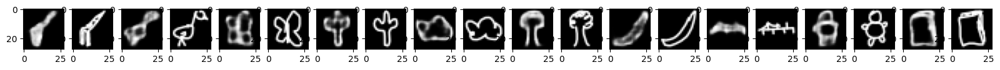

['broom', 'giraffe', 'butterfly', 'cactus', 'cloud', 'tree', 'banana', 'bat', 'bear', 'book']
['giraffe', 'broom', 'chandelier', 'fork', 'hand', 'hand', 'mountain', 'cat', 'bird', 'bed']
['mailbox', 'square', 'square', 'light bulb', 'flip flops', 'fire hydrant', 'square', 'bridge', 'ant', 'square']
['giraffe', 'bird', 'butterfly', 'cactus', 'cloud', 'tree', 'banana', 'bridge', 'bear', 'book']


<Figure size 640x480 with 0 Axes>

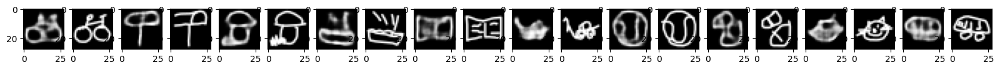

['bicycle', 'mailbox', 'square', 'hot tub', 'book', 'square', 'baseball', 'baseball', 'cat', 'car']
['ant', 'umbrella', 'barn', 'cat', 'ant', 'chandelier', 'smiley face', 'anvil', 'eye', 'octopus']
['square', 'axe', 'fire hydrant', 'sailboat', 'hot tub', 'smiley face', 'flip flops', 'fire hydrant', 'chandelier', 'smiley face']
['bicycle', 'mailbox', 'mushroom', 'hot tub', 'book', 'car', 'baseball', 'flip flops', 'cat', 'car']


<Figure size 640x480 with 0 Axes>

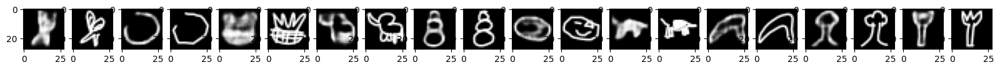

['scissors', 'hexagon', 'campfire', 'camel', 'snowman', 'smiley face', 'zebra', 'boomerang', 'tree', 'fork']
['square', 'smiley face', 'cat', 'bird', 'hot air balloon', 'bear', 'baseball', 'megaphone', 'bird', 'hammer']
['campfire', 'square', 'hot tub', 'hedgehog', 'square', 'donut', 'bridge', 'ant', 'bear', 'asparagus']
['scissors', 'hexagon', 'pineapple', 'elephant', 'snowman', 'smiley face', 'zebra', 'boomerang', 'tree', 'fork']


<Figure size 640x480 with 0 Axes>

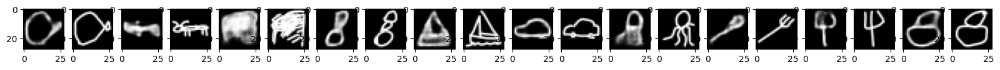

['fish', 'bed', 'tree', 'snowman', 'megaphone', 'car', 'octopus', 'asparagus', 'fork', 'snowman']
['bowtie', 'hammer', 'calculator', 'hourglass', 'campfire', 'cloud', 'fire hydrant', 'fork', 'hedgehog', 'hot tub']
['bear', 'cello', 'ocean', 'key', 'chandelier', 'flip flops', 'square', 'lightning', 'wine glass', 'cat']
['fish', 'ant', 'scissors', 'snowman', 'sailboat', 'car', 'octopus', 'fork', 'fork', 'snowman']


<Figure size 640x480 with 0 Axes>

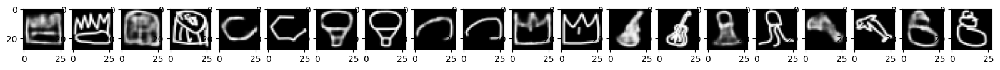

['sailboat', 'barn', 'hexagon', 'hot air balloon', 'square', 'sailboat', 'cello', 'octopus', 'dolphin', 'snowman']
['hot tub', 'ant', 'square', 'ice cream', 'boomerang', 'hot tub', 'square', 'tree', 'hammer', 'hot tub']
['bat', 'square', 'smiley face', 'light bulb', 'bridge', 'chandelier', 'campfire', 'fire hydrant', 'axe', 'bear']
['crown', 'hot tub', 'hexagon', 'hot air balloon', 'mushroom', 'crown', 'cello', 'octopus', 'dolphin', 'snowman']


<Figure size 640x480 with 0 Axes>

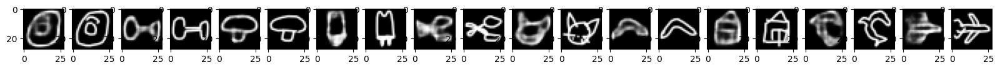

['donut', 'dumbbell', 'mushroom', 'flip flops', 'airplane', 'cat', 'boomerang', 'barn', 'bird', 'airplane']
['camera', 'key', 'umbrella', 'hedgehog', 'scissors', 'alarm clock', 'dolphin', 'elephant', 'boomerang', 'dolphin']
['smiley face', 'megaphone', 'hot air balloon', 'popsicle', 'octopus', 'book', 'mountain', 'square', 'umbrella', 'crocodile']
['donut', 'dumbbell', 'mushroom', 'popsicle', 'scissors', 'cat', 'boomerang', 'barn', 'dolphin', 'airplane']


<Figure size 640x480 with 0 Axes>

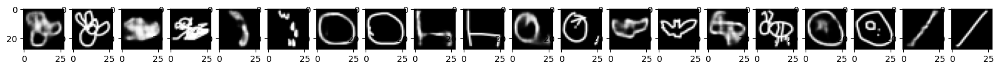

['stethoscope', 'octopus', 'lightning', 'circle', 'chair', 'flip flops', 'bat', 'cello', 'smiley face', 'line']
['bear', 'smiley face', 'square', 'hexagon', 'bed', 'baseball', 'bird', 'bird', 'donut', 'lightning']
['chandelier', 'broom', 'banana', 'square', 'square', 'boomerang', 'hand', 'baseball', 'square', 'broom']
['flower', 'lightning', 'rain', 'circle', 'chair', 'hourglass', 'bat', 'ant', 'donut', 'line']


<Figure size 640x480 with 0 Axes>

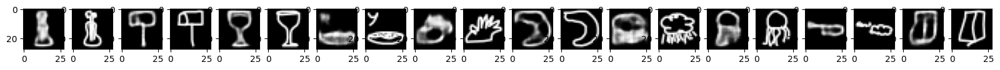

['cello', 'mailbox', 'wine glass', 'hot tub', 'hand', 'boomerang', 'rain', 'octopus', 'bowtie', 'square']
['fire hydrant', 'hammer', 'tree', 'square', 'stethoscope', 'hot air balloon', 'octopus', 'fire hydrant', 'fish', 'flip flops']
['square', 'axe', 'hourglass', 'megaphone', 'bat', 'square', 'car', 'square', 'cloud', 'hourglass']
['cello', 'mailbox', 'wine glass', 'donut', 'hand', 'boomerang', 'rain', 'octopus', 'cloud', 'lightning']


<Figure size 640x480 with 0 Axes>

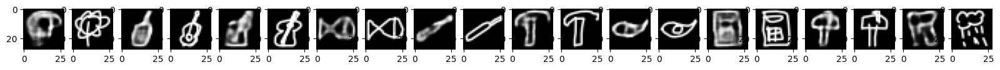

['tree', 'cello', 'cello', 'fish', 'baseball bat', 'hammer', 'fish', 'calculator', 'mailbox', 'rain']
['elephant', 'butterfly', 'butterfly', 'ant', 'asparagus', 'mushroom', 'circle', 'hourglass', 'hammer', 'tree']
['ant', 'alarm clock', 'square', 'bowtie', 'square', 'umbrella', 'bear', 'square', 'mushroom', 'bear']
['flower', 'cello', 'cello', 'fish', 'baseball bat', 'hammer', 'eye', 'calculator', 'mailbox', 'rain']


<Figure size 640x480 with 0 Axes>

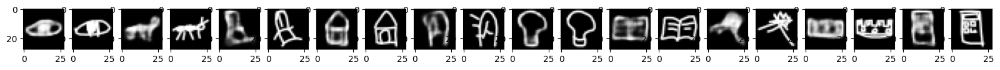

['eye', 'octopus', 'chair', 'barn', 'cactus', 'light bulb', 'book', 'tree', 'sailboat', 'calculator']
['ant', 'ant', 'hourglass', 'fire hydrant', 'scissors', 'hot air balloon', 'barn', 'ant', 'ant', 'square']
['chandelier', 'camel', 'cactus', 'square', 'snowman', 'key', 'bat', 'fork', 'bat', 'hourglass']
['eye', 'ant', 'chair', 'barn', 'cactus', 'light bulb', 'book', 'campfire', 'crown', 'calculator']


<Figure size 640x480 with 0 Axes>

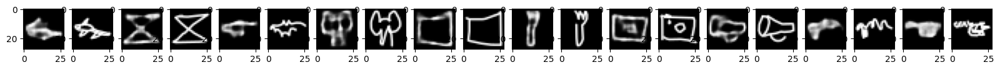

['cat', 'hourglass', 'crocodile', 'elephant', 'circle', 'fork', 'camera', 'ant', 'circle', 'hourglass']
['barn', 'ant', 'broom', 'tree', 'book', 'asparagus', 'ant', 'megaphone', 'baseball', 'square']
['bridge', 'square', 'stethoscope', 'mailbox', 'bed', 'axe', 'square', 'airplane', 'bear', 'sailboat']
['dolphin', 'hourglass', 'bat', 'elephant', 'square', 'fork', 'camera', 'megaphone', 'camel', 'crab']


<Figure size 640x480 with 0 Axes>

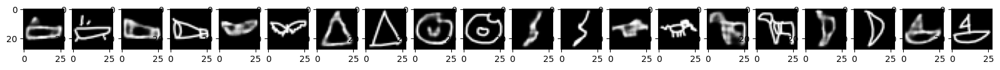

['hot tub', 'ant', 'bat', 'mountain', 'smiley face', 'lightning', 'anvil', 'zebra', 'square', 'megaphone']
['crocodile', 'bed', 'hexagon', 'sailboat', 'bear', 'square', 'barn', 'asparagus', 'boomerang', 'hot tub']
['bed', 'key', 'octopus', 'square', 'donut', 'light bulb', 'cat', 'square', 'hammer', 'chandelier']
['hot tub', 'megaphone', 'bat', 'mountain', 'donut', 'lightning', 'elephant', 'zebra', 'banana', 'sailboat']


<Figure size 640x480 with 0 Axes>

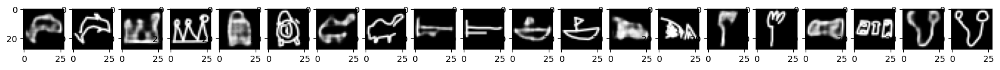

['dolphin', 'square', 'barn', 'camel', 'ant', 'megaphone', 'zebra', 'fork', 'hot air balloon', 'hedgehog']
['bridge', 'cat', 'alarm clock', 'bat', 'bed', 'cactus', 'lightning', 'hand', 'bat', 'smiley face']
['crab', 'bat', 'fire hydrant', 'dolphin', 'mailbox', 'crocodile', 'cello', 'bear', 'tree', 'lightning']
['dolphin', 'crown', 'alarm clock', 'camel', 'bed', 'sailboat', 'campfire', 'fork', 'megaphone', 'stethoscope']
Accuracy on test dataset: 65.55 %
Accuracy on test dataset within 2 guesses: 74.4 %
Accuracy on test dataset within 3 guesses: 77.69166666666666 %


In [24]:
test_loader = torch.load('/content/drive/MyDrive/APS360/Project/Data/TestLoader_6')
VisualizeNew4(vae_wild, test_loader, 'test')

In [ ]:
torch.save(vae_wild.state_dict(), '/content/drive/MyDrive/APS360/Project/Models/'+'FinalFinalFinal')

In [ ]:
#save losses
np.save('/content/drive/MyDrive/APS360/Project/Results/train_losses', train_losses)
np.save('/content/drive/MyDrive/APS360/Project/Results/train_losses_l1', train_losses_l1)
np.save('/content/drive/MyDrive/APS360/Project/Results/train_losses_recon', train_losses_recon)
np.save('/content/drive/MyDrive/APS360/Project/Results/train_losses_BCE', train_losses_bce)
np.save('/content/drive/MyDrive/APS360/Project/Results/train_losses_kld', train_losses_kld)
np.save('/content/drive/MyDrive/APS360/Project/Results/val_losses', val_losses)
np.save('/content/drive/MyDrive/APS360/Project/Results/val_losses_l1', val_losses_l1)
np.save('/content/drive/MyDrive/APS360/Project/Results/val_losses_recon', val_losses_recon)
np.save('/content/drive/MyDrive/APS360/Project/Results/val_losses_BCE', val_losses_bce)
np.save('/content/drive/MyDrive/APS360/Project/Results/val_losses_kld', val_losses_kld)


In [ ]:
def plot_loss_curve(f1,f2,l1,l2,xt,yt):
  train = np.load(f1)
  val = np.load(f2)
  plt.plot(train, label = l1, color = '#0064a0')
  plt.plot(val, label = l2, color = '#039345')
  plt.xlabel(xt)
  plt.ylabel(yt)
  plt.legend()
  plt.show()

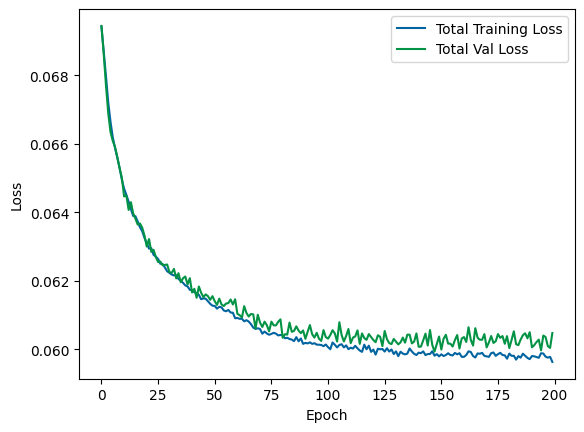

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
plot_loss_curve('/content/drive/MyDrive/APS360/Project/Results/train_losses.npy',\
                '/content/drive/MyDrive/APS360/Project/Results/val_losses.npy', 
                'Total Training Loss', 'Total Val Loss', 'Epoch', 'Loss')

In [ ]:
train_ce= np.load('/content/drive/MyDrive/APS360/Project/Results/train_losses_l1.npy')
val_ce = np.load('/content/drive/MyDrive/APS360/Project/Results/train_losses_l1.npy')

In [ ]:
train_loss_kld = np.load('/content/drive/MyDrive/APS360/Project/Results/train_losses_kld.npy')

In [ ]:
train_contr=np.load('/content/drive/MyDrive/APS360/Project/Results/train_losses_recon.npy')


In [ ]:
train_kld = np.load('/content/drive/MyDrive/APS360/Project/Results/train_losses_kld.npy')

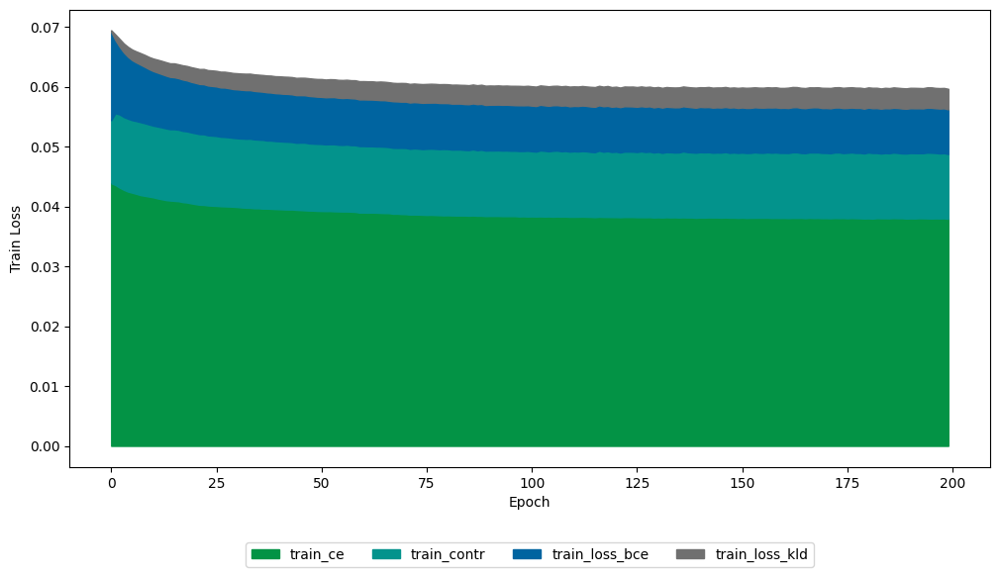

In [ ]:
# Create a stacked graph using the fill_between() function
fig, ax = plt.subplots(figsize=(12, 6))
train_l = [sum(x) for x in zip(train_bce, train_contr, train_kld, train_ce)]
ax.fill_between(range(len(train_l)), 0, train_ce, label='train_ce', color='#039345')
ax.fill_between(range(len(train_l)), train_ce, [a_i + b_i for a_i, b_i in zip(train_ce, train_contr)], label='train_contr', color = '#03938c')
ax.fill_between(range(len(train_l)), [a_i + b_i for a_i, b_i in zip(train_ce, train_contr)], [a_i + b_i + c_i for a_i, b_i, c_i in zip(train_ce, train_contr, train_bce)], label='train_loss_bce', color = '#0064a0')
ax.fill_between(range(len(train_l)), [a_i + b_i + c_i for a_i, b_i, c_i in zip(train_ce, train_contr, train_bce)], train_l, label='train_loss_kld', color = '#707070')

# Add a legend and labels for the x- and y-axes

#plt.legend()
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=4)
plt.xlabel('Epoch')
plt.ylabel('Train Loss')

# Show the graph
plt.show()

<ipython-input-5-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


fire hydrant


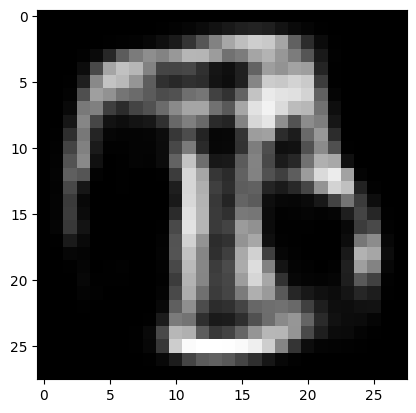

In [20]:
#block of code that randomly constrcuts sketches

vae_wild.eval()
with torch.no_grad():
    z = torch.randn(1, 100)
    z = z.float()

    
    new_sketch = vae_wild.cpu().decode(z).view(28, 28).numpy()
    plt.imshow(new_sketch, cmap='gray')
    #plt.show()
    print(classes[vae_wild.cpu().classify(z).argmax()])

<h1> Primary Model - NEAT Algorithm and Training

In [ ]:
import neat
import time
#1 Piece : 25 Correct Guess  / 23 Correct Guess / 21 Correct Guess
#2 Piece : 20 Correct Guess  / 18 Correct Guess / 16 Correct Guess
#3 Piece : 15 Correct Guess  / 13 Correct Guess / 11 Correct Guess
#4 Piece : 10 Correct Guess / 8 Correct Guess / 6 Correct Guess


# -1 / -3 / -5 For Wrong Guess


def fitness_function(genomes, config):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    points = [[25,23,21],[20,18,16],[15,13,11],[10,8,6]]
    neg = [1,3,5]
    val_loader = torch.load('/content/drive/MyDrive/Project'\
                                +'/Data/ValLoader_'+str(np.random.randint(0,9)))
    one = torch.zeros([256,28,28])
    two = torch.zeros([256,28,28])
    three = torch.zeros([256,28,28])
    four = torch.zeros([256,28,28])
    for i, (images, labels) in enumerate(val_loader):

      split = torch.chunk(images.squeeze(), 4, dim=1)
      one[:,:7] = split[0]
      two = one.clone()
      two[:,7:14] = split[1]
      three = two.clone()
      three[:,14:21] = split[2]
      four = three.clone()
      four[:,21:] = split[3]
      break
    images = [one, two, three, four]
    topk = []
    topk_idx = []
    for i in range(4):
      mu, var = vae_wild.encode(images[i].unsqueeze(1))
      z = vae_wild.reparameterize(mu,var)
      pred = vae_wild.classify(z)
      topk_i, topk_idx_i = torch.topk(pred, k= 14, dim=1)
      topk.append(topk_i)
      topk_idx.append(topk_idx_i)
    genomemax = -1000000
    genomemaxbrain = 0
    for genome_id, genome in genomes:
      net = neat.nn.FeedForwardNetwork.create(genome, config)
      fitness = 0
      for i in range(256):
        #guess_idx = 0
        guessed = []
        is_guessed= False
        for r in range(4):
          if is_guessed:
            break
          num_guesses = -1
          while num_guesses < 2:
            num_guesses+=1
            tp1,tp2,tp3 = 0+num_guesses, 1+num_guesses, 2+num_guesses
            while topk_idx[r][i][tp1] in guessed:
              tp1 += 1
              tp2 += 1
              tp3 += 1
            while topk_idx[r][i][tp2] in guessed:
              tp2 += 1
              tp3 += 1
            while topk_idx[r][i][tp3] in guessed:
              tp3 += 1
            guess = topk_idx[r][i][tp1]
            if net.activate([topk[r][i][tp1],topk[r][i][tp2],topk[r][i][tp3],num_guesses, r])[0] > 0.5:
              guessed.append(guess)
              #print(guess, labels[i])
              if guess == labels[i]:
                fitness += points[r][num_guesses]
                is_guessed = True
                break
              else:
                fitness -= neg[num_guesses]
            else:
              break

        genome.fitness = fitness
        if fitness > genomemax:
          genomemax=fitness
          genomemaxbrain = genome
          
    draw_net(config, genomemaxbrain, node_names = {-1 : 'Prob 1', -2 : 'Prob 2', -3 : 'Prob 3', -4 : 'Guess Num', -5 : 'Round', 0 : 'Guess?'}, filename = '/content/drive/MyDrive/APS360/Project/NEAT/genome_dot_5_'+str(time.time())[:10]+'_'+str(genomemax))
    

In [ ]:
config = neat.Config(neat.DefaultGenome, neat.DefaultReproduction,
                     neat.DefaultSpeciesSet, neat.DefaultStagnation, filename='/content/drive/MyDrive/Project/NEAT/config_v1.txt')

In [ ]:
p = neat.Population(config)

In [ ]:
p.add_reporter(neat.StdOutReporter(True))
stats = neat.StatisticsReporter()
p.add_reporter(stats)
check = neat.Checkpointer(5)
p.add_reporter(check)
winner = p.run(fitness_function, 100)


 ****** Running generation 0 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 0.00000 stdev: 0.00000
Best fitness: 0.00000 - size: (1, 0) - species 1 - id 1
Average adjusted fitness: 0.000
Mean genetic distance 0.694, standard deviation 0.515
Population of 150 members in 1 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1    0   150      0.0    0.000     0
Total extinctions: 0
Generation time: 11.179 sec

 ****** Running generation 1 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: -164.69333 stdev: 575.80874
Best fitness: 1493.00000 - size: (1, 1) - species 1 - id 177
Average adjusted fitness: 0.527
Mean genetic distance 0.866, standard deviation 0.603
Population of 150 members in 1 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1    1   150   1493.0    0.527     0
Total extinctions: 0
Generation time: 15.083 sec (13.131 average)

 ****** Running generation 2 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: -122.48000 stdev: 613.99930
Best fitness: 1773.00000 - size: (1, 1) - species 1 - id 406
Average adjusted fitness: 0.479
Mean genetic distance 1.132, standard deviation 0.685
Population of 150 members in 1 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1    2   150   1773.0    0.479     0
Total extinctions: 0
Generation time: 21.958 sec (16.073 average)

 ****** Running generation 3 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: -23.67333 stdev: 719.60585
Best fitness: 2252.00000 - size: (1, 2) - species 1 - id 560
Average adjusted fitness: 0.455
Mean genetic distance 1.352, standard deviation 0.562
Population of 150 members in 1 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1    3   150   2252.0    0.455     0
Total extinctions: 0
Generation time: 20.676 sec (17.224 average)

 ****** Running generation 4 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 106.19333 stdev: 903.83202
Best fitness: 2228.00000 - size: (1, 2) - species 1 - id 560
Average adjusted fitness: 0.465
Mean genetic distance 1.722, standard deviation 0.503
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1    4   146   2228.0    0.465     1
     2    0     4       --       --     0
Total extinctions: 0
Generation time: 23.472 sec (18.474 average)
Saving checkpoint to neat-checkpoint-4

 ****** Running generation 5 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 403.69333 stdev: 1120.85553
Best fitness: 2153.00000 - size: (1, 2) - species 1 - id 755
Average adjusted fitness: 0.658
Mean genetic distance 1.821, standard deviation 0.607
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1    5    86   2153.0    0.610     2
     2    1    64   2153.0    0.706     0
Total extinctions: 0
Generation time: 26.898 sec (19.878 average)

 ****** Running generation 6 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 759.91333 stdev: 1255.97218
Best fitness: 2293.00000 - size: (1, 2) - species 2 - id 755
Average adjusted fitness: 0.619
Mean genetic distance 1.682, standard deviation 0.592
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1    6    93   2273.0    0.586     0
     2    2    57   2293.0    0.652     0
Total extinctions: 0
Generation time: 26.679 sec (20.849 average)

 ****** Running generation 7 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 632.57333 stdev: 1317.34559
Best fitness: 2348.00000 - size: (1, 2) - species 2 - id 755
Average adjusted fitness: 0.609
Mean genetic distance 1.605, standard deviation 0.580
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1    7    83   2182.0    0.551     1
     2    3    67   2348.0    0.667     0
Total extinctions: 0
Generation time: 25.694 sec (21.455 average)

 ****** Running generation 8 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 814.24667 stdev: 1230.04811
Best fitness: 2188.00000 - size: (1, 2) - species 2 - id 1172
Average adjusted fitness: 0.671
Mean genetic distance 1.683, standard deviation 0.556
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1    8    88   2017.0    0.664     2
     2    4    62   2188.0    0.679     1
Total extinctions: 0
Generation time: 24.605 sec (21.805 average)

 ****** Running generation 9 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 734.64667 stdev: 1387.37612
Best fitness: 2246.00000 - size: (1, 2) - species 2 - id 1172
Average adjusted fitness: 0.654
Mean genetic distance 1.634, standard deviation 0.540
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1    9    92   2131.0    0.594     3
     2    5    58   2246.0    0.714     2
Total extinctions: 0
Generation time: 25.287 sec (22.153 average)
Saving checkpoint to neat-checkpoint-9

 ****** Running generation 10 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 921.12667 stdev: 1220.39318
Best fitness: 2355.00000 - size: (1, 2) - species 2 - id 1172
Average adjusted fitness: 0.638
Mean genetic distance 1.570, standard deviation 0.517
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   10   112   2241.0    0.636     4
     2    6    38   2355.0    0.640     0
Total extinctions: 0
Generation time: 25.558 sec (23.591 average)

 ****** Running generation 11 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 862.22667 stdev: 1291.61903
Best fitness: 2239.00000 - size: (1, 2) - species 2 - id 1706
Average adjusted fitness: 0.682
Mean genetic distance 1.616, standard deviation 0.457
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   11   105   2231.0    0.641     5
     2    7    45   2239.0    0.722     1
Total extinctions: 0
Generation time: 24.826 sec (24.565 average)

 ****** Running generation 12 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 735.14000 stdev: 1369.84370
Best fitness: 2271.00000 - size: (1, 3) - species 2 - id 1818
Average adjusted fitness: 0.647
Mean genetic distance 1.689, standard deviation 0.506
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   12    74   2214.0    0.569     6
     2    8    76   2271.0    0.724     2
Total extinctions: 0
Generation time: 28.497 sec (25.219 average)

 ****** Running generation 13 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 813.87333 stdev: 1440.15306
Best fitness: 2323.00000 - size: (1, 3) - species 2 - id 2004
Average adjusted fitness: 0.671
Mean genetic distance 1.661, standard deviation 0.481
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   13    75   2017.0    0.582     7
     2    9    75   2323.0    0.760     3
Total extinctions: 0
Generation time: 33.434 sec (26.495 average)

 ****** Running generation 14 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 963.93333 stdev: 1232.73479
Best fitness: 2358.00000 - size: (1, 3) - species 2 - id 2004
Average adjusted fitness: 0.672
Mean genetic distance 1.745, standard deviation 0.433
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   14    78   2321.0    0.665     0
     2   10    72   2358.0    0.680     0
Total extinctions: 0
Generation time: 26.958 sec (26.844 average)
Saving checkpoint to neat-checkpoint-14

 ****** Running generation 15 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 572.20000 stdev: 1417.82659
Best fitness: 2077.00000 - size: (1, 3) - species 2 - id 2004
Average adjusted fitness: 0.669
Mean genetic distance 1.878, standard deviation 0.460
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   15    71   2019.0    0.558     1
     2   11    79   2077.0    0.781     1
Total extinctions: 0
Generation time: 27.332 sec (26.887 average)

 ****** Running generation 16 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 749.94000 stdev: 1440.71784
Best fitness: 2244.00000 - size: (1, 3) - species 2 - id 2004
Average adjusted fitness: 0.658
Mean genetic distance 2.127, standard deviation 0.617
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   16    55   2143.0    0.586     2
     2   12    95   2244.0    0.730     2
Total extinctions: 0
Generation time: 30.917 sec (27.311 average)

 ****** Running generation 17 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1165.34667 stdev: 1346.54192
Best fitness: 2365.00000 - size: (1, 3) - species 2 - id 2004
Average adjusted fitness: 0.707
Mean genetic distance 2.082, standard deviation 0.668
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   17    62   2238.0    0.695     3
     2   13    88   2365.0    0.719     0
Total extinctions: 0
Generation time: 37.561 sec (28.498 average)

 ****** Running generation 18 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1005.16667 stdev: 1356.01994
Best fitness: 2368.00000 - size: (1, 3) - species 2 - id 2004
Average adjusted fitness: 0.673
Mean genetic distance 2.106, standard deviation 0.591
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   18    58   2330.0    0.646     0
     2   14    92   2368.0    0.699     0
Total extinctions: 0
Generation time: 30.673 sec (29.104 average)

 ****** Running generation 19 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1208.21333 stdev: 1237.75465
Best fitness: 2419.00000 - size: (1, 3) - species 2 - id 2869
Average adjusted fitness: 0.733
Mean genetic distance 1.873, standard deviation 0.607
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   19    51   2364.0    0.697     0
     2   15    99   2419.0    0.769     0
Total extinctions: 0
Generation time: 22.957 sec (28.871 average)
Saving checkpoint to neat-checkpoint-19

 ****** Running generation 20 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1106.13333 stdev: 1102.31399
Best fitness: 2223.00000 - size: (3, 7) - species 2 - id 3067
Average adjusted fitness: 0.742
Mean genetic distance 1.898, standard deviation 0.634
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   20    75   2201.0    0.773     1
     2   16    54   2223.0    0.711     1
     3    0    21       --       --     0
Total extinctions: 0
Generation time: 30.305 sec (29.346 average)

 ****** Running generation 21 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1038.12667 stdev: 1234.19501
Best fitness: 2114.00000 - size: (3, 4) - species 2 - id 3031
Average adjusted fitness: 0.716
Mean genetic distance 1.963, standard deviation 0.683
Population of 149 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   21    51   2100.0    0.790     2
     2   17    69   2114.0    0.767     2
     3    1    29   2073.0    0.592     0
Total extinctions: 0
Generation time: 58.040 sec (32.667 average)

 ****** Running generation 22 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1558.76510 stdev: 1210.74381
Best fitness: 2639.00000 - size: (3, 4) - species 2 - id 3031
Average adjusted fitness: 0.747
Mean genetic distance 1.872, standard deviation 0.624
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   22    62   2604.0    0.767     0
     2   18    50   2639.0    0.740     0
     3    2    38   2582.0    0.734     0
Total extinctions: 0
Generation time: 38.612 sec (33.679 average)

 ****** Running generation 23 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1318.75333 stdev: 1096.78381
Best fitness: 2366.00000 - size: (1, 3) - species 1 - id 3446
Average adjusted fitness: 0.766
Mean genetic distance 1.774, standard deviation 0.601
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   23    72   2366.0    0.765     1
     2   19    35   2338.0    0.743     1
     3    3    43   2313.0    0.792     1
Total extinctions: 0
Generation time: 37.488 sec (34.084 average)

 ****** Running generation 24 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1366.60667 stdev: 1088.59123
Best fitness: 2300.00000 - size: (1, 3) - species 1 - id 3446
Average adjusted fitness: 0.778
Mean genetic distance 1.865, standard deviation 0.678
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   24    70   2300.0    0.790     2
     2   20    35   2297.0    0.778     2
     3    4    45   2294.0    0.764     2
Total extinctions: 0
Generation time: 29.013 sec (34.290 average)
Saving checkpoint to neat-checkpoint-24

 ****** Running generation 25 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1230.64000 stdev: 1017.28542
Best fitness: 2217.00000 - size: (1, 3) - species 1 - id 3745
Average adjusted fitness: 0.755
Mean genetic distance 1.835, standard deviation 0.657
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   25    73   2217.0    0.760     3
     2   21    28   2205.0    0.713     3
     3    5    49   2149.0    0.793     3
Total extinctions: 0
Generation time: 25.976 sec (34.154 average)

 ****** Running generation 26 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1193.34667 stdev: 989.99068
Best fitness: 2256.00000 - size: (1, 3) - species 1 - id 3931
Average adjusted fitness: 0.771
Mean genetic distance 1.962, standard deviation 0.655
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   26    75   2256.0    0.757     4
     2   22    25   2224.0    0.783     4
     3    6    50   2224.0    0.773     4
Total extinctions: 0
Generation time: 25.730 sec (33.635 average)

 ****** Running generation 27 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1397.84000 stdev: 1088.43509
Best fitness: 2404.00000 - size: (3, 7) - species 1 - id 4010
Average adjusted fitness: 0.720
Mean genetic distance 2.020, standard deviation 0.684
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   27    69   2404.0    0.793     5
     2   23    32   2349.0    0.668     5
     3    7    49   2349.0    0.699     5
Total extinctions: 0
Generation time: 24.655 sec (32.345 average)

 ****** Running generation 28 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1588.56667 stdev: 1057.23055
Best fitness: 2504.00000 - size: (3, 7) - species 1 - id 4010
Average adjusted fitness: 0.772
Mean genetic distance 2.108, standard deviation 0.599
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   28    85   2504.0    0.801     6
     2   24    16   2476.0    0.788     6
     3    8    49   2418.0    0.728     6
Total extinctions: 0
Generation time: 24.104 sec (31.688 average)

 ****** Running generation 29 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1326.20000 stdev: 1044.74786
Best fitness: 2157.00000 - size: (3, 7) - species 1 - id 4010
Average adjusted fitness: 0.780
Mean genetic distance 2.131, standard deviation 0.556
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   29    62   2157.0    0.849     7
     2   25    40   2086.0    0.688     7
     3    9    48   2154.0    0.803     7
Total extinctions: 0
Generation time: 26.966 sec (32.089 average)
Saving checkpoint to neat-checkpoint-29

 ****** Running generation 30 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1358.84000 stdev: 1106.30760
Best fitness: 2245.00000 - size: (3, 6) - species 1 - id 4508
Average adjusted fitness: 0.779
Mean genetic distance 2.140, standard deviation 0.517
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   30    73   2245.0    0.883     8
     2   26    29   2210.0    0.687     8
     3   10    48   2156.0    0.766     8
Total extinctions: 0
Generation time: 29.630 sec (32.021 average)

 ****** Running generation 31 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1476.24667 stdev: 1194.49615
Best fitness: 2515.00000 - size: (3, 6) - species 1 - id 4648
Average adjusted fitness: 0.722
Mean genetic distance 2.058, standard deviation 0.521
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   31    61   2515.0    0.857     9
     2   27    46   2490.0    0.570     9
     3   11    43   2460.0    0.740     9
Total extinctions: 0
Generation time: 23.124 sec (28.530 average)

 ****** Running generation 32 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1382.30000 stdev: 1032.52646
Best fitness: 2249.00000 - size: (3, 7) - species 1 - id 4516
Average adjusted fitness: 0.794
Mean genetic distance 2.096, standard deviation 0.624
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   32    64   2249.0    0.850    10
     2   28    48   2211.0    0.764    10
     3   12    38   2199.0    0.768    10
Total extinctions: 0
Generation time: 25.354 sec (27.204 average)

 ****** Running generation 33 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1304.95333 stdev: 1190.06371
Best fitness: 2371.00000 - size: (3, 8) - species 1 - id 4911
Average adjusted fitness: 0.739
Mean genetic distance 2.120, standard deviation 0.624
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   33    47   2371.0    0.823    11
     2   29    39   2300.0    0.678    11
     3   13    64   2289.0    0.715    11
Total extinctions: 0
Generation time: 26.524 sec (26.108 average)

 ****** Running generation 34 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1370.36000 stdev: 1182.41946
Best fitness: 2438.00000 - size: (3, 7) - species 1 - id 5059
Average adjusted fitness: 0.770
Mean genetic distance 2.078, standard deviation 0.601
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   34    47   2438.0    0.827    12
     2   30    59   2403.0    0.781    12
     3   14    44   2403.0    0.702    12
Total extinctions: 0
Generation time: 24.887 sec (25.695 average)
Saving checkpoint to neat-checkpoint-34

 ****** Running generation 35 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1452.67333 stdev: 1120.28186
Best fitness: 2500.00000 - size: (3, 5) - species 2 - id 5235
Average adjusted fitness: 0.756
Mean genetic distance 2.123, standard deviation 0.657
Population of 151 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   35    42   2495.0    0.790    13
     2   31    64   2500.0    0.730    13
     3   15    45   2485.0    0.747    13
Total extinctions: 0
Generation time: 23.418 sec (25.439 average)

 ****** Running generation 36 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1263.58278 stdev: 1219.64341
Best fitness: 2424.00000 - size: (3, 7) - species 1 - id 5316
Average adjusted fitness: 0.717
Mean genetic distance 2.113, standard deviation 0.725
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   36    27   2424.0    0.720    14
     2   32    77   2411.0    0.746    14
     3   16    46   2388.0    0.685    14
Total extinctions: 0
Generation time: 26.852 sec (25.551 average)

 ****** Running generation 37 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1487.08000 stdev: 997.03227
Best fitness: 2368.00000 - size: (3, 7) - species 2 - id 5470
Average adjusted fitness: 0.777
Mean genetic distance 2.135, standard deviation 0.700
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   37    40   2300.0    0.753    15
     2   33    59   2368.0    0.818    15
     3   17    51   2313.0    0.759    15
Total extinctions: 0
Generation time: 26.651 sec (25.751 average)

 ****** Running generation 38 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1608.76000 stdev: 1177.64823
Best fitness: 2543.00000 - size: (3, 5) - species 2 - id 5628
Average adjusted fitness: 0.758
Mean genetic distance 2.132, standard deviation 0.687
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   38    42   2542.0    0.811    16
     2   34    54   2543.0    0.741    16
     3   18    54   2523.0    0.721    16
Total extinctions: 0
Generation time: 26.323 sec (25.973 average)

 ****** Running generation 39 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1555.15333 stdev: 1103.59700
Best fitness: 2403.00000 - size: (2, 4) - species 3 - id 5122
Average adjusted fitness: 0.785
Mean genetic distance 2.197, standard deviation 0.725
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   39    41   2399.0    0.784    17
     2   35    54   2400.0    0.808    17
     3   19    55   2403.0    0.763    17
Total extinctions: 0
Generation time: 28.587 sec (26.135 average)
Saving checkpoint to neat-checkpoint-39

 ****** Running generation 40 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1484.23333 stdev: 1187.06376
Best fitness: 2589.00000 - size: (3, 7) - species 2 - id 5887
Average adjusted fitness: 0.750
Mean genetic distance 2.276, standard deviation 0.812
Population of 149 members in 4 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   40    54   2588.0    0.801    18
     2   36    44   2589.0    0.764    18
     3   20    48   2587.0    0.685     0
     4    0     3       --       --     0
Total extinctions: 0
Generation time: 30.202 sec (26.192 average)

 ****** Running generation 41 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1317.83893 stdev: 1094.06152
Best fitness: 2411.00000 - size: (2, 3) - species 1 - id 6033
Average adjusted fitness: 0.707
Mean genetic distance 2.386, standard deviation 0.841
Population of 150 members in 4 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   41    45   2411.0    0.755    19
     2   37    46   2395.0    0.744    19
     3   21    33   2349.0    0.711     1
     4    1    26   2195.0    0.617     0
Total extinctions: 0
Generation time: 25.385 sec (26.418 average)

 ****** Running generation 42 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1302.92667 stdev: 1162.02311
Best fitness: 2300.00000 - size: (2, 5) - species 2 - id 6073
Average adjusted fitness: 0.749
Mean genetic distance 2.361, standard deviation 0.888
Population of 151 members in 4 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   42    41   2288.0    0.802    20
     2   38    44   2300.0    0.810    20
     3   22    42   2226.0    0.723     2
     4    2    24   2201.0    0.662     0
Total extinctions: 0
Generation time: 32.744 sec (27.157 average)

 ****** Running generation 43 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1310.45695 stdev: 1066.34168
Best fitness: 2400.00000 - size: (1, 5) - species 2 - id 6032
Average adjusted fitness: 0.554
Mean genetic distance 2.316, standard deviation 0.860
Population of 151 members in 4 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   43    43   2380.0    0.611    21
     2   39    40   2400.0    0.593    21
     3   23    30   2359.0    0.387     3
     4    3    38   2359.0    0.627     0
Total extinctions: 0
Generation time: 27.115 sec (27.216 average)

 ****** Running generation 44 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1621.52318 stdev: 1165.67471
Best fitness: 2584.00000 - size: (3, 5) - species 2 - id 6479
Average adjusted fitness: 0.754
Mean genetic distance 2.323, standard deviation 0.892
Population of 149 members in 4 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   44    35   2568.0    0.756    22
     2   40    44   2584.0    0.742    22
     3   24    25   2529.0    0.703     4
     4    4    45   2529.0    0.817     0
Total extinctions: 0
Generation time: 30.338 sec (27.761 average)
Saving checkpoint to neat-checkpoint-44

 ****** Running generation 45 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1703.57047 stdev: 1020.67919
Best fitness: 2401.00000 - size: (3, 5) - species 1 - id 6625
Average adjusted fitness: 0.815
Mean genetic distance 2.387, standard deviation 0.736
Population of 150 members in 4 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   45    37   2401.0    0.854    23
     2   41    38   2387.0    0.832    23
     3   25    35   2387.0    0.746     5
     4    5    40   2387.0    0.828     1
Total extinctions: 0
Generation time: 30.229 sec (28.443 average)

 ****** Running generation 46 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1548.77333 stdev: 1176.00198
Best fitness: 2590.00000 - size: (3, 6) - species 1 - id 6804
Average adjusted fitness: 0.733
Mean genetic distance 2.422, standard deviation 0.739
Population of 151 members in 4 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   46    51   2590.0    0.768    24
     2   42    24   2556.0    0.684    24
     3   26    37   2556.0    0.694     6
     4    6    39   2556.0    0.786     0
Total extinctions: 0
Generation time: 30.023 sec (28.760 average)

 ****** Running generation 47 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1266.88079 stdev: 1068.37408
Best fitness: 2066.00000 - size: (4, 5) - species 1 - id 6927
Average adjusted fitness: 0.828
Mean genetic distance 2.346, standard deviation 0.757
Population of 150 members in 4 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   47    36   2066.0    0.859    25
     2   43    43   1976.0    0.879    25
     3   27    36   1973.0    0.779     7
     4    7    35   1973.0    0.794     1
Total extinctions: 0
Generation time: 32.430 sec (29.338 average)

 ****** Running generation 48 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1504.36000 stdev: 1179.78411
Best fitness: 2527.00000 - size: (4, 5) - species 2 - id 7075
Average adjusted fitness: 0.748
Mean genetic distance 2.417, standard deviation 0.805
Population of 149 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   48    41   2526.0    0.704    26
     2   44    30   2527.0    0.779    26
     3   28    38   2449.0    0.765     8
     4    8    35   2446.0    0.745     2
     5    0     5       --       --     0
Total extinctions: 0
Generation time: 29.214 sec (29.627 average)

 ****** Running generation 49 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1597.18792 stdev: 1174.69423
Best fitness: 2603.00000 - size: (4, 5) - species 1 - id 6927

Species 2 with 30 members is stagnated: removing it
Average adjusted fitness: 0.670
Mean genetic distance 2.481, standard deviation 0.847
Population of 150 members in 4 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   49    54   2603.0    0.792    27
     3   29    43   2581.0    0.722     9
     4    9    41   2502.0    0.699     3
     5    1    12   2509.0    0.466     0
Total extinctions: 0
Generation time: 31.255 sec (29.893 average)
Saving checkpoint to neat-checkpoint-49

 ****** Running generation 50 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1785.10000 stdev: 1113.03706
Best fitness: 2668.00000 - size: (3, 6) - species 3 - id 7159
Average adjusted fitness: 0.749
Mean genetic distance 2.498, standard deviation 0.774
Population of 149 members in 4 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   50    53   2661.0    0.834     0
     3   30    37   2668.0    0.711     0
     4   10    41   2607.0    0.798     0
     5    2    18   2607.0    0.652     0
Total extinctions: 0
Generation time: 30.974 sec (29.971 average)

 ****** Running generation 51 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1539.79866 stdev: 1100.93723
Best fitness: 2302.00000 - size: (4, 5) - species 1 - id 7443
Average adjusted fitness: 0.801
Mean genetic distance 2.544, standard deviation 0.706
Population of 149 members in 4 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   51    66   2302.0    0.838     1
     3   31    38   2276.0    0.839     1
     4   11    39   2249.0    0.795     1
     5    3     6   2267.0    0.733     1
Total extinctions: 0
Generation time: 35.892 sec (31.021 average)

 ****** Running generation 52 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1436.87919 stdev: 1106.78554
Best fitness: 2327.00000 - size: (4, 5) - species 1 - id 7443
Average adjusted fitness: 0.820
Mean genetic distance 2.539, standard deviation 0.783
Population of 151 members in 4 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   52    55   2327.0    0.801     2
     3   32    38   2283.0    0.819     2
     4   12    38   2202.0    0.771     2
     5    4    20   2202.0    0.892     2
Total extinctions: 0
Generation time: 34.727 sec (31.220 average)

 ****** Running generation 53 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1370.71523 stdev: 1125.62898
Best fitness: 2363.00000 - size: (3, 5) - species 1 - id 7797
Average adjusted fitness: 0.779
Mean genetic distance 2.515, standard deviation 0.746
Population of 150 members in 4 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   53    40   2363.0    0.775     3
     3   33    43   2328.0    0.750     3
     4   13    33   2268.0    0.756     3
     5    5    34   2276.0    0.837     3
Total extinctions: 0
Generation time: 49.364 sec (33.445 average)

 ****** Running generation 54 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1471.80000 stdev: 1218.17431
Best fitness: 2483.00000 - size: (4, 6) - species 1 - id 7942
Average adjusted fitness: 0.739
Mean genetic distance 2.549, standard deviation 0.627
Population of 150 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   54    21   2483.0    0.832     4
     3   34    38   2447.0    0.654     4
     4   14    34   2427.0    0.728     4
     5    6    28   2450.0    0.743     4
     6    0    29       --       --     0
Total extinctions: 0
Generation time: 41.979 sec (34.609 average)
Saving checkpoint to neat-checkpoint-54

 ****** Running generation 55 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1657.21333 stdev: 1017.30946
Best fitness: 2400.00000 - size: (4, 5) - species 6 - id 8081
Average adjusted fitness: 0.815
Mean genetic distance 2.619, standard deviation 0.719
Population of 150 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   55    11   2398.0    0.793     5
     3   35    30   2389.0    0.836     5
     4   15    36   2356.0    0.834     5
     5    7    13   2394.0    0.795     5
     6    1    60   2400.0    0.817     0
Total extinctions: 0
Generation time: 39.624 sec (35.548 average)

 ****** Running generation 56 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1768.14667 stdev: 969.29624
Best fitness: 2412.00000 - size: (2, 6) - species 3 - id 8141
Average adjusted fitness: 0.856
Mean genetic distance 2.588, standard deviation 0.736
Population of 150 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   56    22   2391.0    0.883     6
     3   36    28   2412.0    0.800     6
     4   16    33   2389.0    0.859     6
     5    8    31   2401.0    0.876     6
     6    2    36   2403.0    0.860     0
Total extinctions: 0
Generation time: 30.064 sec (35.552 average)

 ****** Running generation 57 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1560.92000 stdev: 1007.17632
Best fitness: 2326.00000 - size: (5, 9) - species 6 - id 8338
Average adjusted fitness: 0.817
Mean genetic distance 2.537, standard deviation 0.723
Population of 150 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   57    29   2318.0    0.784     7
     3   37    24   2316.0    0.799     7
     4   17    36   2306.0    0.758     7
     5    9    34   2324.0    0.890     7
     6    3    27   2326.0    0.855     1
Total extinctions: 0
Generation time: 29.469 sec (35.256 average)

 ****** Running generation 58 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1819.62667 stdev: 975.06505
Best fitness: 2476.00000 - size: (4, 6) - species 1 - id 8271
Average adjusted fitness: 0.733
Mean genetic distance 2.472, standard deviation 0.700
Population of 149 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   58    27   2476.0    0.816     8
     3   38    34   2473.0    0.653     8
     4   18    24   2465.0    0.687     8
     5   10    24   2466.0    0.782     8
     6    4    40   2468.0    0.727     0
Total extinctions: 0
Generation time: 30.701 sec (35.405 average)

 ****** Running generation 59 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1698.93960 stdev: 754.14276
Best fitness: 2180.00000 - size: (4, 5) - species 6 - id 8580
Average adjusted fitness: 0.815
Mean genetic distance 2.361, standard deviation 0.771
Population of 150 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   59    23   2158.0    0.830     9
     3   39    29   2172.0    0.729     9
     4   19    27   2146.0    0.802     9
     5   11    30   2171.0    0.856     9
     6    5    41   2180.0    0.858     1
Total extinctions: 0
Generation time: 30.844 sec (35.364 average)
Saving checkpoint to neat-checkpoint-59

 ****** Running generation 60 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1530.59333 stdev: 989.02036
Best fitness: 2227.00000 - size: (4, 5) - species 5 - id 8550
Average adjusted fitness: 0.839
Mean genetic distance 2.296, standard deviation 0.797
Population of 151 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   60    28   2205.0    0.900    10
     3   40    33   2202.0    0.671    10
     4   20    20   2208.0    0.841    10
     5   12    42   2227.0    0.883    10
     6    6    28   2217.0    0.900     2
Total extinctions: 0
Generation time: 37.491 sec (36.016 average)

 ****** Running generation 61 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1874.88742 stdev: 1137.09780
Best fitness: 2712.00000 - size: (4, 8) - species 1 - id 8686
Average adjusted fitness: 0.781
Mean genetic distance 2.217, standard deviation 0.738
Population of 151 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   61    26   2712.0    0.799     0
     3   41    33   2706.0    0.759     0
     4   21    21   2676.0    0.721     0
     5   13    39   2711.0    0.815     0
     6    7    32   2695.0    0.813     0
Total extinctions: 0
Generation time: 27.836 sec (35.210 average)

 ****** Running generation 62 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1351.44371 stdev: 1135.13876
Best fitness: 2266.00000 - size: (4, 7) - species 5 - id 9028
Average adjusted fitness: 0.787
Mean genetic distance 2.233, standard deviation 0.724
Population of 150 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   62    23   2237.0    0.820     1
     3   42    33   2264.0    0.730     1
     4   22    20   2158.0    0.688     1
     5   14    49   2266.0    0.868     1
     6    8    25   2251.0    0.828     1
Total extinctions: 0
Generation time: 28.042 sec (34.541 average)

 ****** Running generation 63 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1526.06000 stdev: 1246.34976
Best fitness: 2503.00000 - size: (4, 8) - species 5 - id 8686
Average adjusted fitness: 0.770
Mean genetic distance 2.302, standard deviation 0.789
Population of 151 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   63    32   2503.0    0.760     2
     3   43    33   2495.0    0.622     2
     4   23    22   2495.0    0.797     2
     5   15    37   2503.0    0.876     2
     6    9    27   2500.0    0.795     2
Total extinctions: 0
Generation time: 25.399 sec (32.145 average)

 ****** Running generation 64 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1383.13907 stdev: 1106.85835
Best fitness: 2326.00000 - size: (3, 6) - species 3 - id 9261
Average adjusted fitness: 0.789
Mean genetic distance 2.345, standard deviation 0.720
Population of 150 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   64    42   2319.0    0.817     3
     3   44    27   2326.0    0.719     3
     4   24    30   2313.0    0.788     3
     5   16    31   2317.0    0.756     3
     6   10    20   2316.0    0.867     3
Total extinctions: 0
Generation time: 27.897 sec (30.737 average)
Saving checkpoint to neat-checkpoint-64

 ****** Running generation 65 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1305.22000 stdev: 1036.55053
Best fitness: 2219.00000 - size: (3, 7) - species 1 - id 9442
Average adjusted fitness: 0.798
Mean genetic distance 2.316, standard deviation 0.683
Population of 149 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   65    37   2219.0    0.789     4
     3   45    18   2213.0    0.793     4
     4   25    38   2210.0    0.703     4
     5   17    32   2207.0    0.815     4
     6   11    24   2217.0    0.887     4
Total extinctions: 0
Generation time: 28.393 sec (29.614 average)

 ****** Running generation 66 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1470.10738 stdev: 984.99989
Best fitness: 2237.00000 - size: (4, 6) - species 1 - id 9464
Average adjusted fitness: 0.822
Mean genetic distance 2.390, standard deviation 0.722
Population of 150 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   66    34   2237.0    0.890     5
     3   46    40   2178.0    0.809     5
     4   26    18   2214.0    0.809     5
     5   18    33   2231.0    0.794     5
     6   12    25   2214.0    0.807     5
Total extinctions: 0
Generation time: 27.254 sec (29.333 average)

 ****** Running generation 67 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1381.96667 stdev: 1063.23534
Best fitness: 2297.00000 - size: (3, 5) - species 5 - id 9726
Average adjusted fitness: 0.794
Mean genetic distance 2.344, standard deviation 0.711
Population of 150 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   67    34   2290.0    0.805     6
     3   47    39   2266.0    0.725     6
     4   27    20   2271.0    0.826     6
     5   19    38   2297.0    0.784     6
     6   13    19   2280.0    0.831     6
Total extinctions: 0
Generation time: 26.765 sec (29.062 average)

 ****** Running generation 68 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1600.39333 stdev: 1024.61290
Best fitness: 2365.00000 - size: (3, 7) - species 3 - id 9778
Average adjusted fitness: 0.812
Mean genetic distance 2.363, standard deviation 0.676
Population of 151 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   68    33   2359.0    0.851     7
     3   48    28   2365.0    0.762     7
     4   28    30   2359.0    0.743     7
     5   20    29   2357.0    0.794     7
     6   14    31   2355.0    0.910     7
Total extinctions: 0
Generation time: 28.027 sec (28.795 average)

 ****** Running generation 69 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1531.56954 stdev: 1024.37448
Best fitness: 2289.00000 - size: (4, 6) - species 1 - id 10019
Average adjusted fitness: 0.819
Mean genetic distance 2.333, standard deviation 0.729
Population of 150 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   69    34   2289.0    0.908     8
     3   49    26   2228.0    0.709     8
     4   29    30   2257.0    0.782     8
     5   21    30   2271.0    0.858     8
     6   15    30   2281.0    0.839     8
Total extinctions: 0
Generation time: 30.300 sec (28.740 average)
Saving checkpoint to neat-checkpoint-69

 ****** Running generation 70 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1595.29333 stdev: 981.50466
Best fitness: 2264.00000 - size: (3, 6) - species 6 - id 9936
Average adjusted fitness: 0.838
Mean genetic distance 2.387, standard deviation 0.741
Population of 149 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   70    29   2257.0    0.865     9
     3   50    28   2254.0    0.842     9
     4   30    31   2243.0    0.811     9
     5   22    28   2257.0    0.866     9
     6   16    33   2264.0    0.805     9
Total extinctions: 0
Generation time: 33.529 sec (28.344 average)

 ****** Running generation 71 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1531.17450 stdev: 1133.47262
Best fitness: 2481.00000 - size: (4, 7) - species 1 - id 10307
Average adjusted fitness: 0.764
Mean genetic distance 2.353, standard deviation 0.845
Population of 151 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   71    21   2481.0    0.788    10
     3   51    35   2464.0    0.729    10
     4   31    23   2475.0    0.698    10
     5   23    35   2475.0    0.746    10
     6   17    37   2469.0    0.860    10
Total extinctions: 0
Generation time: 30.804 sec (28.641 average)

 ****** Running generation 72 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1367.60927 stdev: 975.24102
Best fitness: 2222.00000 - size: (2, 7) - species 4 - id 10089
Average adjusted fitness: 0.664
Mean genetic distance 2.417, standard deviation 0.858
Population of 150 members in 5 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   72    21   2221.0    0.650    11
     3   52    47   2215.0    0.654    11
     4   32     9   2222.0    0.614    11
     5   24    31   2217.0    0.855    11
     6   18    42   2198.0    0.548    11
Total extinctions: 0
Generation time: 32.217 sec (29.058 average)

 ****** Running generation 73 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1369.13333 stdev: 1067.01713
Best fitness: 2184.00000 - size: (4, 8) - species 1 - id 10585
Average adjusted fitness: 0.808
Mean genetic distance 2.555, standard deviation 0.842
Population of 149 members in 6 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   73    25   2184.0    0.908    12
     3   53     7   2163.0    0.832    12
     4   33    33   2135.0    0.671    12
     5   25    36   2169.0    0.832    12
     6   19    31   2182.0    0.795    12
     7    0    17       --       --     0
Total extinctions: 0
Generation time: 33.917 sec (29.910 average)

 ****** Running generation 74 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1608.88591 stdev: 968.21971
Best fitness: 2319.00000 - size: (3, 5) - species 6 - id 10437
Average adjusted fitness: 0.811
Mean genetic distance 2.609, standard deviation 0.790
Population of 150 members in 6 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   74    19   2315.0    0.897    13
     3   54    14   2088.0    0.598    13
     4   34    12   2306.0    0.800    13
     5   26    31   2317.0    0.884    13
     6   20    36   2319.0    0.843    13
     7    1    38   2283.0    0.844     0
Total extinctions: 0
Generation time: 32.077 sec (30.328 average)
Saving checkpoint to neat-checkpoint-74

 ****** Running generation 75 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1395.72000 stdev: 1146.37369
Best fitness: 2399.00000 - size: (3, 6) - species 6 - id 10874
Average adjusted fitness: 0.751
Mean genetic distance 2.587, standard deviation 0.886
Population of 150 members in 6 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   75    25   2398.0    0.927    14
     3   55    22   2361.0    0.656    14
     4   35    17   2386.0    0.593    14
     5   27    25   2395.0    0.838    14
     6   21    33   2399.0    0.781    14
     7    2    28   2373.0    0.709     0
Total extinctions: 0
Generation time: 31.164 sec (30.605 average)

 ****** Running generation 76 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1439.28000 stdev: 1155.71891
Best fitness: 2364.00000 - size: (2, 5) - species 5 - id 10959
Average adjusted fitness: 0.757
Mean genetic distance 2.523, standard deviation 0.842
Population of 150 members in 6 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   76    15   2349.0    0.862    15
     3   56    19   2340.0    0.550    15
     4   36    20   2353.0    0.649    15
     5   28    29   2364.0    0.893    15
     6   22    40   2364.0    0.862    15
     7    3    27   2315.0    0.729     1
Total extinctions: 0
Generation time: 31.384 sec (31.018 average)

 ****** Running generation 77 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1517.76000 stdev: 1064.71271
Best fitness: 2335.00000 - size: (3, 6) - species 6 - id 11158
Average adjusted fitness: 0.797
Mean genetic distance 2.476, standard deviation 0.836
Population of 150 members in 6 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   77    10   2312.0    0.830    16
     3   57    17   2323.0    0.660    16
     4   37    21   2308.0    0.783    16
     5   29    32   2324.0    0.889    16
     6   23    40   2335.0    0.808    16
     7    4    30   2331.0    0.813     2
Total extinctions: 0
Generation time: 28.563 sec (31.198 average)

 ****** Running generation 78 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1385.21333 stdev: 1068.66916
Best fitness: 2267.00000 - size: (3, 7) - species 7 - id 11268
Average adjusted fitness: 0.778
Mean genetic distance 2.458, standard deviation 0.819
Population of 150 members in 6 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   78    22   2242.0    0.837    17
     3   58    21   2250.0    0.758    17
     4   38    23   2234.0    0.619    17
     5   30    37   2245.0    0.789    17
     6   24    21   2247.0    0.865    17
     7    5    26   2267.0    0.799     3
Total extinctions: 0
Generation time: 31.129 sec (31.508 average)

 ****** Running generation 79 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1629.88000 stdev: 1002.93220
Best fitness: 2413.00000 - size: (4, 8) - species 7 - id 11437
Average adjusted fitness: 0.808
Mean genetic distance 2.465, standard deviation 0.790
Population of 150 members in 6 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   79    19   2399.0    0.927    18
     3   59    34   2389.0    0.704    18
     4   39    15   2401.0    0.821    18
     5   31    11   2394.0    0.736    18
     6   25    48   2401.0    0.843    18
     7    6    23   2413.0    0.818     0
Total extinctions: 0
Generation time: 30.414 sec (31.520 average)
Saving checkpoint to neat-checkpoint-79

 ****** Running generation 80 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1321.40000 stdev: 1055.65935
Best fitness: 2353.00000 - size: (3, 5) - species 5 - id 11481
Average adjusted fitness: 0.780
Mean genetic distance 2.478, standard deviation 0.817
Population of 151 members in 6 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     1   80    31   2350.0    0.834    19
     3   60    36   2330.0    0.653    19
     4   40    11   2266.0    0.831    19
     5   32    18   2353.0    0.835    19
     6   26    31   2344.0    0.781    19
     7    7    24   2327.0    0.746     1
Total extinctions: 0
Generation time: 29.771 sec (31.144 average)

 ****** Running generation 81 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1285.52980 stdev: 1116.16506
Best fitness: 2345.00000 - size: (2, 6) - species 3 - id 10620

Species 4 with 11 members is stagnated: removing it

Species 6 with 31 members is stagnated: removing it

Species 1 with 31 members is stagnated: removing it
Average adjusted fitness: 0.737
Mean genetic distance 2.446, standard deviation 0.987
Population of 151 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   61    53   2345.0    0.659    20
     5   33    49   2344.0    0.819    20
     7    8    49   2329.0    0.734     2
Total extinctions: 0
Generation time: 35.245 sec (31.588 average)

 ****** Running generation 82 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1216.37086 stdev: 1084.06979
Best fitness: 2124.00000 - size: (4, 9) - species 7 - id 11762

Species 5 with 49 members is stagnated: removing it
Average adjusted fitness: 0.741
Mean genetic distance 1.876, standard deviation 0.806
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   62    77   2114.0    0.768    21
     7    9    73   2124.0    0.715     3
Total extinctions: 0
Generation time: 31.004 sec (31.467 average)

 ****** Running generation 83 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1252.52000 stdev: 1046.73019
Best fitness: 2347.00000 - size: (4, 9) - species 7 - id 11762
Average adjusted fitness: 0.553
Mean genetic distance 2.042, standard deviation 0.679
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   63    72   2325.0    0.528    22
     7   10    78   2347.0    0.579     4
Total extinctions: 0
Generation time: 31.532 sec (31.228 average)

 ****** Running generation 84 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1037.46000 stdev: 1128.36685
Best fitness: 2252.00000 - size: (2, 6) - species 3 - id 11849
Average adjusted fitness: 0.747
Mean genetic distance 2.088, standard deviation 0.616
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   64    70   2252.0    0.732    23
     7   11    80   2241.0    0.762     5
Total extinctions: 0
Generation time: 33.787 sec (31.399 average)
Saving checkpoint to neat-checkpoint-84

 ****** Running generation 85 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1167.31333 stdev: 1324.24523
Best fitness: 2423.00000 - size: (2, 6) - species 3 - id 11849
Average adjusted fitness: 0.771
Mean genetic distance 2.022, standard deviation 0.683
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   65    71   2423.0    0.770    24
     7   12    79   2413.0    0.772     6
Total extinctions: 0
Generation time: 38.921 sec (32.175 average)

 ****** Running generation 86 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1432.29333 stdev: 1019.43066
Best fitness: 2307.00000 - size: (4, 6) - species 7 - id 12335
Average adjusted fitness: 0.800
Mean genetic distance 2.084, standard deviation 0.698
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   66    72   2285.0    0.774    25
     7   13    78   2307.0    0.825     7
Total extinctions: 0
Generation time: 38.109 sec (32.847 average)

 ****** Running generation 87 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1272.68667 stdev: 1025.82416
Best fitness: 2168.00000 - size: (4, 8) - species 7 - id 12560
Average adjusted fitness: 0.788
Mean genetic distance 2.123, standard deviation 0.643
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   67    77   2147.0    0.739    26
     7   14    73   2168.0    0.836     8
Total extinctions: 0
Generation time: 37.811 sec (33.772 average)

 ****** Running generation 88 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1036.40667 stdev: 1148.19115
Best fitness: 2177.00000 - size: (2, 5) - species 3 - id 12433
Average adjusted fitness: 0.746
Mean genetic distance 2.157, standard deviation 0.631
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   68    73   2177.0    0.726    27
     7   15    77   2169.0    0.766     9
Total extinctions: 0
Generation time: 35.193 sec (34.179 average)

 ****** Running generation 89 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1222.50000 stdev: 1170.65044
Best fitness: 2352.00000 - size: (2, 5) - species 3 - id 12433
Average adjusted fitness: 0.756
Mean genetic distance 2.054, standard deviation 0.627
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   69    71   2352.0    0.710    28
     7   16    79   2349.0    0.802    10
Total extinctions: 0
Generation time: 37.154 sec (34.853 average)
Saving checkpoint to neat-checkpoint-89

 ****** Running generation 90 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1353.07333 stdev: 1153.74610
Best fitness: 2485.00000 - size: (2, 5) - species 3 - id 12433
Average adjusted fitness: 0.727
Mean genetic distance 2.030, standard deviation 0.621
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   70    68   2485.0    0.721    29
     7   17    82   2482.0    0.733     0
Total extinctions: 0
Generation time: 38.588 sec (35.734 average)

 ****** Running generation 91 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1127.42000 stdev: 1158.23667
Best fitness: 2302.00000 - size: (2, 5) - species 3 - id 13160
Average adjusted fitness: 0.714
Mean genetic distance 1.975, standard deviation 0.578
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   71    73   2302.0    0.753    30
     7   18    77   2297.0    0.675     1
Total extinctions: 0
Generation time: 37.004 sec (35.910 average)

 ****** Running generation 92 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1288.13333 stdev: 1195.91770
Best fitness: 2478.00000 - size: (4, 9) - species 3 - id 13277
Average adjusted fitness: 0.715
Mean genetic distance 1.902, standard deviation 0.571
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   72    72   2478.0    0.740    31
     7   19    78   2457.0    0.690     2
Total extinctions: 0
Generation time: 37.555 sec (36.565 average)

 ****** Running generation 93 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1359.33333 stdev: 1287.45161
Best fitness: 2542.00000 - size: (2, 5) - species 3 - id 12433
Average adjusted fitness: 0.712
Mean genetic distance 1.952, standard deviation 0.574
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   73    83   2542.0    0.758    32
     7   20    67   2531.0    0.667     0
Total extinctions: 0
Generation time: 36.833 sec (37.096 average)

 ****** Running generation 94 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1217.20667 stdev: 1305.22004
Best fitness: 2481.00000 - size: (3, 6) - species 3 - id 13564
Average adjusted fitness: 0.700
Mean genetic distance 2.043, standard deviation 0.626
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   74    82   2481.0    0.747    33
     7   21    68   2453.0    0.653     1
Total extinctions: 0
Generation time: 34.595 sec (37.176 average)
Saving checkpoint to neat-checkpoint-94

 ****** Running generation 95 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1470.86000 stdev: 1039.81332
Best fitness: 2471.00000 - size: (3, 6) - species 3 - id 13723
Average adjusted fitness: 0.768
Mean genetic distance 2.115, standard deviation 0.737
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   75    77   2471.0    0.754    34
     7   22    73   2459.0    0.782     2
Total extinctions: 0
Generation time: 31.388 sec (36.423 average)

 ****** Running generation 96 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1343.32000 stdev: 1162.20843
Best fitness: 2611.00000 - size: (3, 6) - species 3 - id 13723
Average adjusted fitness: 0.690
Mean genetic distance 2.168, standard deviation 0.602
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   76    66   2611.0    0.670    35
     7   23    84   2585.0    0.710     0
Total extinctions: 0
Generation time: 29.025 sec (35.515 average)

 ****** Running generation 97 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1338.49333 stdev: 1082.25259
Best fitness: 2412.00000 - size: (4, 9) - species 7 - id 13960
Average adjusted fitness: 0.719
Mean genetic distance 2.139, standard deviation 0.554
Population of 150 members in 2 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   77    77   2364.0    0.688    36
     7   24    73   2412.0    0.750     1
Total extinctions: 0
Generation time: 31.489 sec (34.882 average)

 ****** Running generation 98 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1578.76667 stdev: 1230.48963
Best fitness: 2569.00000 - size: (3, 6) - species 3 - id 13907
Average adjusted fitness: 0.759
Mean genetic distance 2.199, standard deviation 0.553
Population of 150 members in 3 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   78    83   2569.0    0.761    37
     7   25    64   2565.0    0.757     2
     8    0     3       --       --     0
Total extinctions: 0
Generation time: 37.040 sec (35.067 average)

 ****** Running generation 99 ****** 



<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


Population's average fitness: 1380.62000 stdev: 1042.82420
Best fitness: 2261.00000 - size: (4, 7) - species 7 - id 14225
Average adjusted fitness: 0.787
Mean genetic distance 2.445, standard deviation 0.646
Population of 150 members in 4 species:
   ID   age  size  fitness  adj fit  stag
  ====  ===  ====  =======  =======  ====
     3   79    35   2249.0    0.784    38
     7   26    42   2261.0    0.789     3
     8    1    18   2092.0    0.787     0
     9    0    55       --       --     0
Total extinctions: 0
Generation time: 28.382 sec (34.190 average)
Saving checkpoint to neat-checkpoint-99


In [ ]:
import neat
import time
#1 Piece : 25 Correct Guess  / 23 Correct Guess / 21 Correct Guess
#2 Piece : 20 Correct Guess  / 18 Correct Guess / 16 Correct Guess
#3 Piece : 15 Correct Guess  / 13 Correct Guess / 11 Correct Guess
#4 Piece : 10 Correct Guess / 8 Correct Guess / 6 Correct Guess


# -1 / -3 / -5 For Wrong Guess


def fitness_function_long(genome, config, tl):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    points = [[25,23,21],[20,18,16],[15,13,11],[10,8,6]]
    neg = [1,3,5]

    val_loader = torch.load('/content/drive/MyDrive/Project'\
                                +'/Data/TestLoader_'+str(tl))
    
    images = []
    labels = torch.tensor([])
    for i, (imgs, labs) in enumerate(val_loader):
      one = torch.zeros([imgs.size()[0],28,28])
      two = torch.zeros([imgs.size()[0],28,28])
      three = torch.zeros([imgs.size()[0],28,28])
      four = torch.zeros([imgs.size()[0],28,28])
      split = torch.chunk(imgs.squeeze(), 4, dim=1)
      one[:,:7] = split[0]
      two = one.clone()
      two[:,7:14] = split[1]
      three = two.clone()
      three[:,14:21] = split[2]
      four = three.clone()
      four[:,21:] = split[3]

      if i == 0:
        images.append(one)
        images.append(two)
        images.append(three)
        images.append(four)
        labels = labs
      else:
        images[0] = torch.cat((images[0],one))
        images[1] = torch.cat((images[1],two))
        images[2] = torch.cat((images[2],three))
        images[3] = torch.cat((images[3],four))
        labels = torch.cat((labels,labs))
    topk = []
    topk_idx = []
    for i in range(4):
      mu, var = vae_wild.encode(images[i].unsqueeze(1))
      z = vae_wild.reparameterize(mu,var)
      pred = vae_wild.classify(z)
      topk_i, topk_idx_i = torch.topk(pred, k= 14, dim=1)
      topk.append(topk_i)
      topk_idx.append(topk_idx_i)
    genomemax = -1000000
    genomemaxbrain = 0

    net = neat.nn.FeedForwardNetwork.create(genome, config)
    fitness = 0
    for i in range(images[0].size()[0]):
      #guess_idx = 0
      guessed = []
      is_guessed= False
      for r in range(4):
        if is_guessed:
          break
        num_guesses = -1
        while num_guesses < 2:
          num_guesses+=1
          tp1,tp2,tp3 = 0+num_guesses, 1+num_guesses, 2+num_guesses
          while topk_idx[r][i][tp1] in guessed:
            tp1 += 1
            tp2 += 1
            tp3 += 1
          while topk_idx[r][i][tp2] in guessed:
            tp2 += 1
            tp3 += 1
          while topk_idx[r][i][tp3] in guessed:
            tp3 += 1
          guess = topk_idx[r][i][tp1]
          if net.activate([topk[r][i][tp1],topk[r][i][tp2],topk[r][i][tp3],num_guesses, r])[0] > 0.5:
            guessed.append(guess)
            #print(guess, labels[i])
            if guess == labels[i]:
              fitness += points[r][num_guesses]
              is_guessed = True
              break
            else:
              fitness -= neg[num_guesses]
          else:
            break
    print(fitness/images[0].size()[0])
    print(fitness)
    return fitness, images[0].size()[0]
    #draw_net(config, genomemaxbrain, node_names = {-1 : 'Prob 1', -2 : 'Prob 2', -3 : 'Prob 3', -4 : 'Guess Num', -5 : 'Round', 0 : 'Guess?'}, filename = '/content/drive/MyDrive/APS360/Project/NEAT/genome_dot_5_'+str(time.time())[:10]+'_'+str(genomemax))
    

In [ ]:
import warnings

import graphviz
import matplotlib.pyplot as plt
import numpy as np


def plot_stats(statistics, ylog=False, view=False, filename='avg_fitness.png'):
    """ Plots the population's average and best fitness. """
    if plt is None:
        warnings.warn("This display is not available due to a missing optional dependency (matplotlib)")
        return

    generation = range(len(statistics.most_fit_genomes))
    best_fitness = [c.fitness for c in statistics.most_fit_genomes]
    avg_fitness = np.array(statistics.get_fitness_mean())
    stdev_fitness = np.array(statistics.get_fitness_stdev())

    plt.plot(generation, avg_fitness, 'b-', label="average")
    plt.plot(generation, avg_fitness - stdev_fitness, 'k--', label="-1 sd")
    plt.plot(generation, avg_fitness + stdev_fitness, 'k--', label="+1 sd")
    plt.plot(generation, best_fitness, 'g-', label="best")

    plt.title("Population's average and best fitness")
    plt.xlabel("Generations")
    plt.ylabel("Fitness")
    plt.grid()
    plt.legend(loc="best")
    if ylog:
        plt.gca().set_yscale('symlog')

    plt.savefig(filename)
    if view:
        plt.show()

    plt.close()



def plot_species(statistics, view=False, filename='speciation.png'):
    """ Visualizes speciation throughout evolution. """
    if plt is None:
        warnings.warn("This display is not available due to a missing optional dependency (matplotlib)")
        return

    species_sizes = statistics.get_species_sizes()
    num_generations = len(species_sizes)
    curves = np.array(species_sizes).T

    fig, ax = plt.subplots()
    ax.stackplot(range(num_generations), *curves)

    plt.title("Speciation")
    plt.ylabel("Size per Species")
    plt.xlabel("Generations")

    plt.savefig(filename)

    if view:
        plt.show()

    plt.close()


def draw_net(config, genome, view=False, filename=None, node_names=None, show_disabled=True, prune_unused=False,
             node_colors=None, fmt='png'):
    """ Receives a genome and draws a neural network with arbitrary topology. """
    # Attributes for network nodes.
    if graphviz is None:
        warnings.warn("This display is not available due to a missing optional dependency (graphviz)")
        return

    # If requested, use a copy of the genome which omits all components that won't affect the output.
    if prune_unused:
        genome = genome.get_pruned_copy(config.genome_config)

    if node_names is None:
        node_names = {}

    assert type(node_names) is dict

    if node_colors is None:
        node_colors = {}

    assert type(node_colors) is dict

    node_attrs = {
        'shape': 'circle',
        'fontsize': '9',
        'height': '0.2',
        'width': '0.2'}

    dot = graphviz.Digraph(format=fmt, node_attr=node_attrs)

    inputs = set()
    for k in config.genome_config.input_keys:
        inputs.add(k)
        name = node_names.get(k, str(k))
        input_attrs = {'style': 'filled', 'shape': 'box', 'fillcolor': node_colors.get(k, 'lightgray')}
        dot.node(name, _attributes=input_attrs)

    outputs = set()
    for k in config.genome_config.output_keys:
        outputs.add(k)
        name = node_names.get(k, str(k))
        node_attrs = {'style': 'filled', 'fillcolor': node_colors.get(k, 'lightblue')}

        dot.node(name, _attributes=node_attrs)

    used_nodes = set(genome.nodes.keys())
    for n in used_nodes:
        if n in inputs or n in outputs:
            continue

        attrs = {'style': 'filled',
                 'fillcolor': node_colors.get(n, 'white')}
        dot.node(str(n), _attributes=attrs)

    for cg in genome.connections.values():
        if cg.enabled or show_disabled:
            # if cg.input not in used_nodes or cg.output not in used_nodes:
            #    continue
            input, output = cg.key
            a = node_names.get(input, str(input))
            b = node_names.get(output, str(output))
            style = 'solid' if cg.enabled else 'dotted'
            color = 'green' if cg.weight > 0 else 'red'
            width = str(0.1 + abs(cg.weight / 5.0))
            dot.edge(a, b, _attributes={'style': style, 'color': color, 'penwidth': width})

    dot.render(filename, view=view)

    return dot

In [ ]:
f = [0]*10
s = [0]*10
for i in range(10):
  f[i], s[i] = fitness_function_long(winner, config, i)

<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


8.999166666666667
107990
9.036333333333333
108436
8.883916666666666
106607
9.0245
108294
8.99025
107883
9.006666666666666
108080
8.9015
106818
9.032916666666667
108395
9.0345
108414
8.91375
106965


In [ ]:
print(sum(s))

120000


In [ ]:
print(winner)

Key: 14225
Fitness: 2261
Nodes:
	0 DefaultNodeGene(key=0, bias=2.16062668316361, response=1.0, activation=sigmoid, aggregation=sum)
	94 DefaultNodeGene(key=94, bias=2.713990061609625, response=1.0, activation=sigmoid, aggregation=sum)
	133 DefaultNodeGene(key=133, bias=-0.003555158086651883, response=1.0, activation=sigmoid, aggregation=sum)
	1097 DefaultNodeGene(key=1097, bias=-1.360600661276049, response=1.0, activation=sigmoid, aggregation=sum)
Connections:
	DefaultConnectionGene(key=(-5, 94), weight=-2.180513115523413, enabled=True)
	DefaultConnectionGene(key=(-5, 133), weight=0.6647615839965361, enabled=True)
	DefaultConnectionGene(key=(-4, 0), weight=-2.3802766795126016, enabled=True)
	DefaultConnectionGene(key=(-4, 1097), weight=0.8629726554032888, enabled=True)
	DefaultConnectionGene(key=(-3, 94), weight=2.157048866808728, enabled=False)
	DefaultConnectionGene(key=(-2, 94), weight=-0.5612921674015787, enabled=True)
	DefaultConnectionGene(key=(-1, 133), weight=0.9219605913388742

In [ ]:
net = neat.nn.FeedForwardNetwork.create(winner, config)

In [ ]:
#p1, p2, p3, ng, r
for r in range(4):
  for gn in range(3):
    maxGuess = 'No'
    minGuess = 'No'
    if net.activate([0,0.499,0,gn,r])[0] > 0.5:
      maxGuess = 'Yes'
    if net.activate([0,0,0,gn,r])[0] > 0.5:
      minGuess = 'Yes'
    print(f'Round : {r}, {gn} Guesses Taken, P2 of 0.499, Take a Guess? {maxGuess}')
    print(f'Round : {r}, {gn} Guesses Taken, P2 of 0.000, Take a Guess? {minGuess}')


Round : 0, 0 Guesses Taken, P2 of 0.499, Take a Guess? No
Round : 0, 0 Guesses Taken, P2 of 0.000, Take a Guess? No
Round : 0, 1 Guesses Taken, P2 of 0.499, Take a Guess? No
Round : 0, 1 Guesses Taken, P2 of 0.000, Take a Guess? No
Round : 0, 2 Guesses Taken, P2 of 0.499, Take a Guess? No
Round : 0, 2 Guesses Taken, P2 of 0.000, Take a Guess? No
Round : 1, 0 Guesses Taken, P2 of 0.499, Take a Guess? Yes
Round : 1, 0 Guesses Taken, P2 of 0.000, Take a Guess? No
Round : 1, 1 Guesses Taken, P2 of 0.499, Take a Guess? No
Round : 1, 1 Guesses Taken, P2 of 0.000, Take a Guess? No
Round : 1, 2 Guesses Taken, P2 of 0.499, Take a Guess? No
Round : 1, 2 Guesses Taken, P2 of 0.000, Take a Guess? No
Round : 2, 0 Guesses Taken, P2 of 0.499, Take a Guess? Yes
Round : 2, 0 Guesses Taken, P2 of 0.000, Take a Guess? Yes
Round : 2, 1 Guesses Taken, P2 of 0.499, Take a Guess? No
Round : 2, 1 Guesses Taken, P2 of 0.000, Take a Guess? No
Round : 2, 2 Guesses Taken, P2 of 0.499, Take a Guess? No
Round : 2, 

In [ ]:
#p1, p2, p3, ng, r
for p2 in range(0,5000,1):
  P2 = p2/10000
  Guess = 'No'
  if net.activate([0,P2,0,0,1])[0] > 0.5:
    Guess = 'Yes'
    print(f'Round : 1, 0 Guesses Taken, P2 of {P2}, Take a Guess? {Guess}')
    break

Round : 1, 0 Guesses Taken, P2 of 0.3245, Take a Guess? Yes


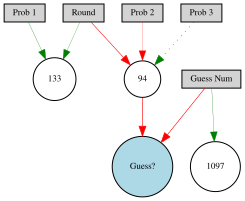

In [ ]:
draw_net(config, winner, node_names = {-1 : 'Prob 1', -2 : 'Prob 2', -3 : 'Prob 3', -4 : 'Guess Num', -5 : 'Round', 0 : 'Guess?'})

In [ ]:
plot_stats(stats)

In [ ]:
plot_species(stats)

In [ ]:
plot_species(stats, filename='/content/drive/MyDrive/APS360/Project/NEAT/crackedspecies2.png')

In [ ]:
plot_stats(stats, filename='/content/drive/MyDrive/APS360/Project/NEAT/crackedstats2.png')

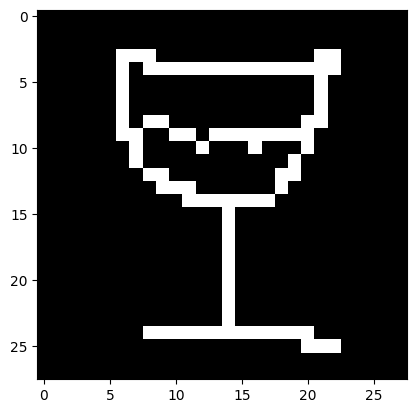

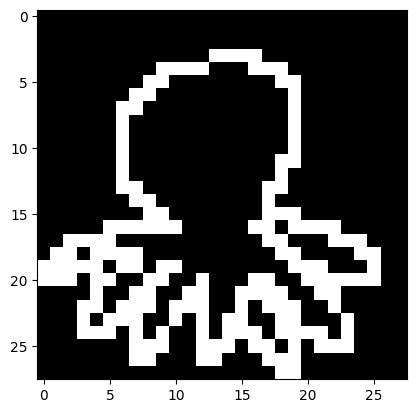

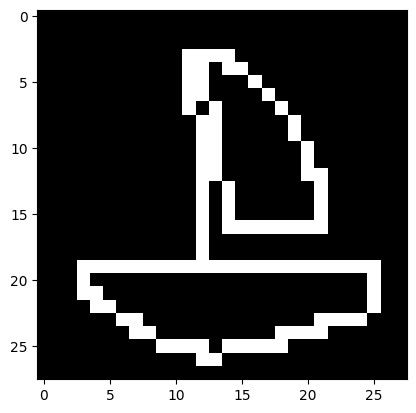

In [ ]:
import imageio.v3 as iio
im  = [0,0,0]
im[0] = iio.imread('wine_glass.png')
im[0] = im[0][:,:,0]/255
plt.imshow(im[0], cmap='gray')
plt.show()
im[1] = iio.imread('octopus.png')
im[1] = im[1][:,:,0]/255
plt.imshow(im[1], cmap='gray')
plt.show()
im[2] = iio.imread('sail_boat.png')
im[2] = im[2][:,:,0]/255
plt.imshow(im[2], cmap='gray')
plt.show()
im = torch.tensor(im)

In [ ]:
print(im.size())
img, pred, _, _ = vae_wild(im.unsqueeze(1).float())

torch.Size([3, 28, 28])


<ipython-input-4-b42ddbc6282d>:41: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.softmax(h7)


<h1> misc code - may/ may not work - use for reference

In [ ]:
'''topk, topk_i = torch.topk(pred, k = 3, dim =1)
for idx, i in enumerate(img):
  print(f'Top Guess: {classes[topk_i[idx][0]]}')
  print(f'Second Guess: {classes[topk_i[idx][1]]}')
  print(f'Third Guess: {classes[topk_i[idx][2]]}')
  print(topk[idx])
  plt.imshow(i.detach().numpy().reshape(28,28), cmap = 'gray')
  plt.show()'''

images = []
for i, imgs in enumerate(img):
  one = torch.zeros([imgs.size()[0],28,28])
  two = torch.zeros([imgs.size()[0],28,28])
  three = torch.zeros([imgs.size()[0],28,28])
  four = torch.zeros([imgs.size()[0],28,28])
  split = torch.chunk(imgs, 4, dim=0)
  one[:,:7] = split[0]
  two = one.clone()
  two[:,7:14] = split[1]
  three = two.clone()
  three[:,14:21] = split[2]
  four = three.clone()
  four[:,21:] = split[3]

  if i == 0:
    images.append(one)
    images.append(two)
    images.append(three)
    images.append(four)
  else:
    images[0] = torch.cat((images[0],one))
    images[1] = torch.cat((images[1],two))
    images[2] = torch.cat((images[2],three))
    images[3] = torch.cat((images[3],four))
topk = []
topk_idx = []
for i in range(4):
  mu, var = vae_wild.encode(images[i].unsqueeze(1))
  z = vae_wild.reparameterize(mu,var)
  pred = vae_wild.classify(z)
  topk_i, topk_idx_i = torch.topk(pred, k= 14, dim=1)
  topk.append(topk_i)
  topk_idx.append(topk_idx_i)

RuntimeError: ignored